In [ ]:
# STEP 0: Install required packages
!pip install -q kaggle timm albumentations imbalanced-learn

# Set up random seeds for reproducibility
import random
import numpy as np
import torch

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using:", device)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 76.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 64.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 37.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 58.0 MB/s eta 0:00:00
Using: cuda


In [ ]:
# Upload Kaggle API credentials
from google.colab import files
files.upload()  # Upload kaggle.json

# Configure Kaggle API access
!mkdir -p ~/.kaggle && cp kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


In [ ]:
# Download HAM10000 dataset
!kaggle datasets download -d kmader/skin-cancer-mnist-ham10000

# Extract dataset files
!unzip -q skin-cancer-mnist-ham10000.zip -d HAM10000

Dataset URL: https://www.kaggle.com/datasets/kmader/skin-cancer-mnist-ham10000
License(s): CC-BY-NC-SA-4.0


In [ ]:
# Import necessary libraries
import os
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

import albumentations as A
from albumentations.pytorch import ToTensorV2
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import RandomOverSampler

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau

from tqdm import tqdm

In [ ]:
# Load metadata
df = pd.read_csv("HAM10000/HAM10000_metadata.csv")

# Encode the labels
label_encoder = LabelEncoder()
df['label'] = label_encoder.fit_transform(df['dx'])

# Map image paths
img_path1 = 'HAM10000/HAM10000_images_part_1/'
img_path2 = 'HAM10000/HAM10000_images_part_2/'
all_img_paths = {os.path.splitext(f)[0]: os.path.join(img_path1, f)
                 if os.path.exists(os.path.join(img_path1, f))
                 else os.path.join(img_path2, f)
                 for f in os.listdir(img_path1) + os.listdir(img_path2)}
df['path'] = df['image_id'].map(all_img_paths)

# Display class distribution
print("Class distribution before balancing:")
print(df['dx'].value_counts())
print("\nNumeric label distribution:")
print(df['label'].value_counts())

Class distribution before balancing:
dx
nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: count, dtype: int64

Numeric label distribution:
label
5    6705
4    1113
2    1099
1     514
0     327
6     142
3     115
Name: count, dtype: int64


In [ ]:
# Apply oversampling to balance the dataset
ros = RandomOverSampler(random_state=SEED)
X_resampled, y_resampled = ros.fit_resample(df[['path']], df['label'])
df_balanced = pd.DataFrame(X_resampled)
df_balanced['label'] = y_resampled

print("Balanced class distribution:")
print(df_balanced['label'].value_counts())

# Split into training and validation sets
train_df, val_df = train_test_split(df_balanced, test_size=0.2,
                                   stratify=df_balanced['label'],
                                   random_state=SEED)

print(f"\nTraining set: {len(train_df)} samples")
print(f"Validation set: {len(val_df)} samples")

Balanced class distribution:
label
2    6705
5    6705
3    6705
4    6705
6    6705
1    6705
0    6705
Name: count, dtype: int64

Training set: 37548 samples
Validation set: 9387 samples


In [ ]:
# Custom dataset class
class SkinDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        image = Image.open(self.df.loc[idx, 'path']).convert('RGB')
        image = np.array(image)
        label = self.df.loc[idx, 'label']
        if self.transform:
            image = self.transform(image=image)['image']
        return image, label

# Define transformations
train_transform = A.Compose([
    A.Resize(64, 64),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=20, p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.CoarseDropout(max_holes=8, max_height=8, max_width=8, p=0.5),
    A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ToTensorV2()
])

val_transform = A.Compose([
    A.Resize(64, 64),
    A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ToTensorV2()
])

# Create datasets and dataloaders
train_dataset = SkinDataset(train_df, transform=train_transform)
val_dataset = SkinDataset(val_df, transform=val_transform)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False, num_workers=2)

/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:111: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
<ipython-input-7-d3720c40900d>:25: UserWarning: Argument(s) 'max_holes, max_height, max_width' are not valid for transform CoarseDropout
  A.CoarseDropout(max_holes=8, max_height=8, max_width=8, p=0.5),


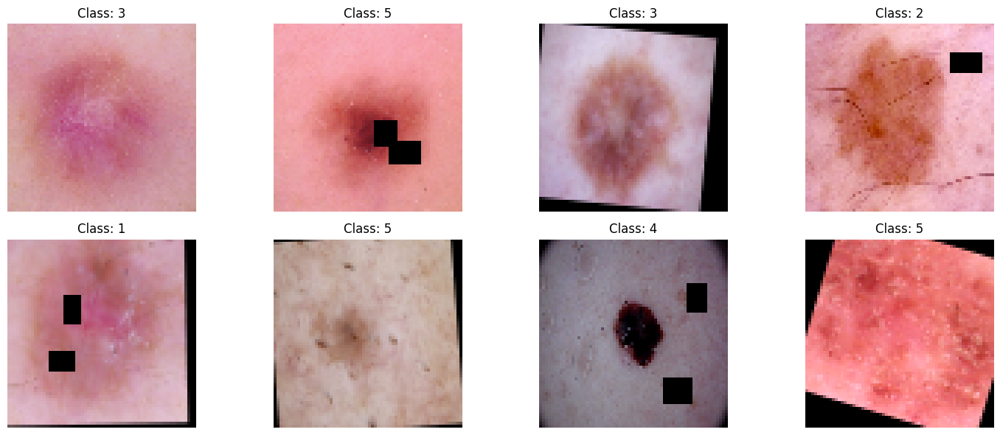

In [ ]:
# Visualize some sample images
plt.figure(figsize=(15, 6))
for i in range(8):
    img, label = train_dataset[i]
    # Convert tensor to numpy for visualization
    img = img.permute(1, 2, 0).numpy() * 0.5 + 0.5  # Denormalize
    img = np.clip(img, 0, 1)

    plt.subplot(2, 4, i+1)
    plt.imshow(img)
    plt.title(f"Class: {label}")
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
# Define DCNN model
class DCNN(nn.Module):
    def __init__(self, num_classes=7):
        super(DCNN, self).__init__()
        self.features = nn.Sequential(
            self.conv_block(3, 32),
            self.conv_block(32, 64),
            self.conv_block(64, 128),
            self.conv_block(128, 256)
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(0.5),
            nn.Linear(256*4*4, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.Linear(64, num_classes)
        )

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

model = DCNN().to(device)
print(model)

# Count model parameters
total_params = sum(p.numel() for p in model.parameters())
print(f"Total parameters: {total_params:,}")

DCNN(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (1): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    )
    (3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), s

In [ ]:
# Define custom label smoothing loss
class LabelSmoothingLoss(nn.Module):
    def __init__(self, classes=7, smoothing=0.1):
        super(LabelSmoothingLoss, self).__init__()
        self.confidence = 1.0 - smoothing
        self.smoothing = smoothing
        self.cls = classes

    def forward(self, x, target):
        log_probs = F.log_softmax(x, dim=-1)
        true_dist = torch.zeros_like(log_probs)
        true_dist.fill_(self.smoothing / (self.cls - 1))
        true_dist.scatter_(1, target.data.unsqueeze(1), self.confidence)
        return torch.mean(torch.sum(-true_dist * log_probs, dim=-1))

# Initialize loss, optimizer, scheduler and gradient scaler
criterion = LabelSmoothingLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3, verbose=True)
scaler = torch.cuda.amp.GradScaler()

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
<ipython-input-10-dfb0c0f3706b>:20: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


In [ ]:
# Training function
def train_one_epoch():
    model.train()
    running_loss = 0
    correct, total = 0, 0

    for images, labels in tqdm(train_loader, desc="Training"):
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()

        with torch.cuda.amp.autocast():
            outputs = model(images)
            loss = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()

        # Calculate training accuracy
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    train_acc = 100 * correct / total
    return running_loss / len(train_loader), train_acc

# Evaluation function
def evaluate():
    model.eval()
    correct, total = 0, 0
    class_correct = [0] * 7
    class_total = [0] * 7

    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc="Evaluating"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            correct += (preds == labels).sum().item()
            total += labels.size(0)

            # Per-class accuracy
            for i in range(labels.size(0)):
                label = labels[i]
                class_correct[label] += (preds[i] == label).item()
                class_total[label] += 1

    # Calculate per-class accuracy
    class_acc = [100 * correct / max(1, total) for correct, total in zip(class_correct, class_total)]
    return 100 * correct / total, class_acc

In [ ]:
# Training loop
best_acc = 0
train_losses, val_accs = [], []
epochs = 45

for epoch in range(1, epochs + 1):
    print(f"\n🌟 Epoch {epoch}/{epochs}")

    # Train
    loss, train_acc = train_one_epoch()
    train_losses.append(loss)
    print(f"📊 Loss: {loss:.4f} | Train Accuracy: {train_acc:.2f}%")

    # Evaluate
    val_acc, class_accs = evaluate()
    val_accs.append(val_acc)
    print(f"✅ Val Accuracy: {val_acc:.2f}%")

    # Log per-class accuracy
    for i, acc in enumerate(class_accs):
        print(f"Class {i} accuracy: {acc:.2f}%")

    # Learning rate scheduler
    scheduler.step(val_acc)

    # Save best model
    if val_acc > best_acc:
        best_acc = val_acc
        torch.save(model.state_dict(), "best_model.pth")
        print(f"💾 Model saved with accuracy: {best_acc:.2f}%")

print(f"\n🔥 Best Accuracy: {best_acc:.2f}%")


🌟 Epoch 1/45


Training:   0%|          | 0/294 [00:00<?, ?it/s]<ipython-input-11-f664d275b393>:11: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Training: 100%|██████████| 294/294 [03:21<00:00,  1.46it/s]


📊 Loss: 1.3975 | Train Accuracy: 53.26%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.68it/s]


✅ Val Accuracy: 66.38%
Class 0 accuracy: 62.64%
Class 1 accuracy: 38.70%
Class 2 accuracy: 53.77%
Class 3 accuracy: 80.84%
Class 4 accuracy: 60.18%
Class 5 accuracy: 71.22%
Class 6 accuracy: 97.32%
💾 Model saved with accuracy: 66.38%

🌟 Epoch 2/45


Training: 100%|██████████| 294/294 [03:02<00:00,  1.61it/s]


📊 Loss: 1.1692 | Train Accuracy: 65.72%


Evaluating: 100%|██████████| 74/74 [00:44<00:00,  1.68it/s]


✅ Val Accuracy: 70.37%
Class 0 accuracy: 57.72%
Class 1 accuracy: 70.77%
Class 2 accuracy: 60.18%
Class 3 accuracy: 79.42%
Class 4 accuracy: 79.49%
Class 5 accuracy: 50.34%
Class 6 accuracy: 94.71%
💾 Model saved with accuracy: 70.37%

🌟 Epoch 3/45


Training: 100%|██████████| 294/294 [03:03<00:00,  1.61it/s]


📊 Loss: 1.0745 | Train Accuracy: 70.74%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.72it/s]


✅ Val Accuracy: 78.19%
Class 0 accuracy: 79.05%
Class 1 accuracy: 77.26%
Class 2 accuracy: 58.31%
Class 3 accuracy: 96.64%
Class 4 accuracy: 63.83%
Class 5 accuracy: 72.26%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 78.19%

🌟 Epoch 4/45


Training: 100%|██████████| 294/294 [03:01<00:00,  1.62it/s]


📊 Loss: 1.0180 | Train Accuracy: 73.55%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.69it/s]


✅ Val Accuracy: 82.80%
Class 0 accuracy: 85.83%
Class 1 accuracy: 85.38%
Class 2 accuracy: 59.88%
Class 3 accuracy: 98.88%
Class 4 accuracy: 73.90%
Class 5 accuracy: 75.69%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 82.80%

🌟 Epoch 5/45


Training: 100%|██████████| 294/294 [03:01<00:00,  1.62it/s]


📊 Loss: 0.9640 | Train Accuracy: 76.66%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.71it/s]


✅ Val Accuracy: 84.43%
Class 0 accuracy: 93.66%
Class 1 accuracy: 90.98%
Class 2 accuracy: 69.65%
Class 3 accuracy: 100.00%
Class 4 accuracy: 70.25%
Class 5 accuracy: 66.44%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 84.43%

🌟 Epoch 6/45


Training: 100%|██████████| 294/294 [03:01<00:00,  1.62it/s]


📊 Loss: 0.9305 | Train Accuracy: 78.50%


Evaluating: 100%|██████████| 74/74 [00:42<00:00,  1.72it/s]


✅ Val Accuracy: 85.64%
Class 0 accuracy: 90.90%
Class 1 accuracy: 91.13%
Class 2 accuracy: 62.27%
Class 3 accuracy: 100.00%
Class 4 accuracy: 76.88%
Class 5 accuracy: 78.30%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 85.64%

🌟 Epoch 7/45


Training: 100%|██████████| 294/294 [03:02<00:00,  1.61it/s]


📊 Loss: 0.8997 | Train Accuracy: 80.24%


Evaluating: 100%|██████████| 74/74 [00:44<00:00,  1.66it/s]


✅ Val Accuracy: 85.94%
Class 0 accuracy: 92.39%
Class 1 accuracy: 84.41%
Class 2 accuracy: 70.02%
Class 3 accuracy: 100.00%
Class 4 accuracy: 82.77%
Class 5 accuracy: 71.96%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 85.94%

🌟 Epoch 8/45


Training: 100%|██████████| 294/294 [03:01<00:00,  1.62it/s]


📊 Loss: 0.8728 | Train Accuracy: 81.87%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.72it/s]


✅ Val Accuracy: 88.33%
Class 0 accuracy: 97.39%
Class 1 accuracy: 94.85%
Class 2 accuracy: 80.24%
Class 3 accuracy: 100.00%
Class 4 accuracy: 74.94%
Class 5 accuracy: 70.92%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 88.33%

🌟 Epoch 9/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.62it/s]


📊 Loss: 0.8446 | Train Accuracy: 83.42%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.70it/s]


✅ Val Accuracy: 88.25%
Class 0 accuracy: 94.71%
Class 1 accuracy: 91.13%
Class 2 accuracy: 90.68%
Class 3 accuracy: 100.00%
Class 4 accuracy: 75.99%
Class 5 accuracy: 65.25%
Class 6 accuracy: 100.00%

🌟 Epoch 10/45


Training: 100%|██████████| 294/294 [03:03<00:00,  1.60it/s]


📊 Loss: 0.8245 | Train Accuracy: 84.43%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.69it/s]


✅ Val Accuracy: 90.93%
Class 0 accuracy: 97.91%
Class 1 accuracy: 96.20%
Class 2 accuracy: 81.43%
Class 3 accuracy: 100.00%
Class 4 accuracy: 84.41%
Class 5 accuracy: 76.58%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 90.93%

🌟 Epoch 11/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.63it/s]


📊 Loss: 0.8100 | Train Accuracy: 85.34%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.72it/s]


✅ Val Accuracy: 91.79%
Class 0 accuracy: 98.81%
Class 1 accuracy: 99.11%
Class 2 accuracy: 77.70%
Class 3 accuracy: 100.00%
Class 4 accuracy: 92.92%
Class 5 accuracy: 73.97%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 91.79%

🌟 Epoch 12/45


Training: 100%|██████████| 294/294 [03:01<00:00,  1.62it/s]


📊 Loss: 0.7893 | Train Accuracy: 86.55%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.69it/s]


✅ Val Accuracy: 92.01%
Class 0 accuracy: 97.84%
Class 1 accuracy: 95.97%
Class 2 accuracy: 88.81%
Class 3 accuracy: 100.00%
Class 4 accuracy: 88.22%
Class 5 accuracy: 73.90%
Class 6 accuracy: 99.33%
💾 Model saved with accuracy: 92.01%

🌟 Epoch 13/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.63it/s]


📊 Loss: 0.7763 | Train Accuracy: 87.26%


Evaluating: 100%|██████████| 74/74 [00:44<00:00,  1.67it/s]


✅ Val Accuracy: 93.11%
Class 0 accuracy: 99.78%
Class 1 accuracy: 97.32%
Class 2 accuracy: 86.43%
Class 3 accuracy: 100.00%
Class 4 accuracy: 91.87%
Class 5 accuracy: 76.36%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 93.11%

🌟 Epoch 14/45


Training: 100%|██████████| 294/294 [03:01<00:00,  1.62it/s]


📊 Loss: 0.7624 | Train Accuracy: 87.76%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.72it/s]


✅ Val Accuracy: 93.14%
Class 0 accuracy: 98.73%
Class 1 accuracy: 99.33%
Class 2 accuracy: 90.16%
Class 3 accuracy: 100.00%
Class 4 accuracy: 94.18%
Class 5 accuracy: 69.57%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 93.14%

🌟 Epoch 15/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.63it/s]


📊 Loss: 0.7471 | Train Accuracy: 88.76%


Evaluating: 100%|██████████| 74/74 [00:44<00:00,  1.68it/s]


✅ Val Accuracy: 92.77%
Class 0 accuracy: 97.09%
Class 1 accuracy: 98.96%
Class 2 accuracy: 90.83%
Class 3 accuracy: 100.00%
Class 4 accuracy: 88.52%
Class 5 accuracy: 73.97%
Class 6 accuracy: 100.00%

🌟 Epoch 16/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.63it/s]


📊 Loss: 0.7391 | Train Accuracy: 89.48%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.70it/s]


✅ Val Accuracy: 94.25%
Class 0 accuracy: 99.78%
Class 1 accuracy: 99.70%
Class 2 accuracy: 87.77%
Class 3 accuracy: 100.00%
Class 4 accuracy: 94.26%
Class 5 accuracy: 78.23%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 94.25%

🌟 Epoch 17/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.63it/s]


📊 Loss: 0.7297 | Train Accuracy: 89.83%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.70it/s]


✅ Val Accuracy: 93.53%
Class 0 accuracy: 99.63%
Class 1 accuracy: 99.40%
Class 2 accuracy: 84.79%
Class 3 accuracy: 100.00%
Class 4 accuracy: 97.09%
Class 5 accuracy: 73.83%
Class 6 accuracy: 100.00%

🌟 Epoch 18/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.63it/s]


📊 Loss: 0.7234 | Train Accuracy: 90.17%


Evaluating: 100%|██████████| 74/74 [00:44<00:00,  1.68it/s]


✅ Val Accuracy: 94.78%
Class 0 accuracy: 99.78%
Class 1 accuracy: 99.40%
Class 2 accuracy: 93.36%
Class 3 accuracy: 100.00%
Class 4 accuracy: 92.02%
Class 5 accuracy: 78.90%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 94.78%

🌟 Epoch 19/45


Training: 100%|██████████| 294/294 [03:02<00:00,  1.61it/s]


📊 Loss: 0.7102 | Train Accuracy: 90.85%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.69it/s]


✅ Val Accuracy: 94.52%
Class 0 accuracy: 98.58%
Class 1 accuracy: 99.78%
Class 2 accuracy: 91.42%
Class 3 accuracy: 100.00%
Class 4 accuracy: 93.96%
Class 5 accuracy: 77.93%
Class 6 accuracy: 100.00%

🌟 Epoch 20/45


Training: 100%|██████████| 294/294 [03:03<00:00,  1.60it/s]


📊 Loss: 0.7094 | Train Accuracy: 90.98%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.70it/s]


✅ Val Accuracy: 94.98%
Class 0 accuracy: 99.48%
Class 1 accuracy: 99.63%
Class 2 accuracy: 95.30%
Class 3 accuracy: 100.00%
Class 4 accuracy: 94.48%
Class 5 accuracy: 75.99%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 94.98%

🌟 Epoch 21/45


Training: 100%|██████████| 294/294 [03:01<00:00,  1.62it/s]


📊 Loss: 0.6983 | Train Accuracy: 91.58%


Evaluating: 100%|██████████| 74/74 [00:53<00:00,  1.39it/s]


✅ Val Accuracy: 95.00%
Class 0 accuracy: 99.78%
Class 1 accuracy: 99.78%
Class 2 accuracy: 92.39%
Class 3 accuracy: 100.00%
Class 4 accuracy: 96.50%
Class 5 accuracy: 76.58%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 95.00%

🌟 Epoch 22/45


Training: 100%|██████████| 294/294 [03:18<00:00,  1.48it/s]


📊 Loss: 0.6927 | Train Accuracy: 91.74%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.68it/s]


✅ Val Accuracy: 95.23%
Class 0 accuracy: 99.25%
Class 1 accuracy: 99.25%
Class 2 accuracy: 97.32%
Class 3 accuracy: 100.00%
Class 4 accuracy: 91.87%
Class 5 accuracy: 78.90%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 95.23%

🌟 Epoch 23/45


Training: 100%|██████████| 294/294 [03:02<00:00,  1.61it/s]


📊 Loss: 0.6857 | Train Accuracy: 92.23%


Evaluating: 100%|██████████| 74/74 [00:42<00:00,  1.72it/s]


✅ Val Accuracy: 95.62%
Class 0 accuracy: 99.78%
Class 1 accuracy: 100.00%
Class 2 accuracy: 93.51%
Class 3 accuracy: 100.00%
Class 4 accuracy: 95.38%
Class 5 accuracy: 80.69%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 95.62%

🌟 Epoch 24/45


Training: 100%|██████████| 294/294 [03:01<00:00,  1.62it/s]


📊 Loss: 0.6788 | Train Accuracy: 92.44%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.71it/s]


✅ Val Accuracy: 95.73%
Class 0 accuracy: 99.78%
Class 1 accuracy: 99.40%
Class 2 accuracy: 96.20%
Class 3 accuracy: 100.00%
Class 4 accuracy: 96.35%
Class 5 accuracy: 78.37%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 95.73%

🌟 Epoch 25/45


Training: 100%|██████████| 294/294 [03:03<00:00,  1.60it/s]


📊 Loss: 0.6744 | Train Accuracy: 92.77%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.72it/s]


✅ Val Accuracy: 96.16%
Class 0 accuracy: 99.78%
Class 1 accuracy: 99.85%
Class 2 accuracy: 98.51%
Class 3 accuracy: 100.00%
Class 4 accuracy: 95.90%
Class 5 accuracy: 79.12%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 96.16%

🌟 Epoch 26/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.63it/s]


📊 Loss: 0.6718 | Train Accuracy: 92.92%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.71it/s]


✅ Val Accuracy: 96.19%
Class 0 accuracy: 99.78%
Class 1 accuracy: 100.00%
Class 2 accuracy: 97.99%
Class 3 accuracy: 100.00%
Class 4 accuracy: 96.12%
Class 5 accuracy: 79.42%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 96.19%

🌟 Epoch 27/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.63it/s]


📊 Loss: 0.6652 | Train Accuracy: 93.33%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.71it/s]


✅ Val Accuracy: 96.54%
Class 0 accuracy: 99.78%
Class 1 accuracy: 100.00%
Class 2 accuracy: 97.46%
Class 3 accuracy: 100.00%
Class 4 accuracy: 96.27%
Class 5 accuracy: 82.25%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 96.54%

🌟 Epoch 28/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.63it/s]


📊 Loss: 0.6570 | Train Accuracy: 93.67%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.69it/s]


✅ Val Accuracy: 96.18%
Class 0 accuracy: 100.00%
Class 1 accuracy: 100.00%
Class 2 accuracy: 98.66%
Class 3 accuracy: 100.00%
Class 4 accuracy: 97.02%
Class 5 accuracy: 77.55%
Class 6 accuracy: 100.00%

🌟 Epoch 29/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.63it/s]


📊 Loss: 0.6573 | Train Accuracy: 93.67%


Evaluating: 100%|██████████| 74/74 [00:42<00:00,  1.72it/s]


✅ Val Accuracy: 96.70%
Class 0 accuracy: 100.00%
Class 1 accuracy: 99.11%
Class 2 accuracy: 98.43%
Class 3 accuracy: 100.00%
Class 4 accuracy: 96.12%
Class 5 accuracy: 83.22%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 96.70%

🌟 Epoch 30/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.63it/s]


📊 Loss: 0.6517 | Train Accuracy: 94.00%


Evaluating: 100%|██████████| 74/74 [00:42<00:00,  1.72it/s]


✅ Val Accuracy: 97.04%
Class 0 accuracy: 100.00%
Class 1 accuracy: 100.00%
Class 2 accuracy: 98.36%
Class 3 accuracy: 100.00%
Class 4 accuracy: 95.97%
Class 5 accuracy: 84.94%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 97.04%

🌟 Epoch 31/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.63it/s]


📊 Loss: 0.6466 | Train Accuracy: 94.30%


Evaluating: 100%|██████████| 74/74 [00:44<00:00,  1.67it/s]


✅ Val Accuracy: 96.83%
Class 0 accuracy: 100.00%
Class 1 accuracy: 100.00%
Class 2 accuracy: 98.51%
Class 3 accuracy: 100.00%
Class 4 accuracy: 95.75%
Class 5 accuracy: 83.52%
Class 6 accuracy: 100.00%

🌟 Epoch 32/45


Training: 100%|██████████| 294/294 [03:01<00:00,  1.62it/s]


📊 Loss: 0.6441 | Train Accuracy: 94.35%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.71it/s]


✅ Val Accuracy: 96.46%
Class 0 accuracy: 99.78%
Class 1 accuracy: 100.00%
Class 2 accuracy: 97.61%
Class 3 accuracy: 100.00%
Class 4 accuracy: 94.33%
Class 5 accuracy: 83.52%
Class 6 accuracy: 100.00%

🌟 Epoch 33/45


Training: 100%|██████████| 294/294 [03:03<00:00,  1.60it/s]


📊 Loss: 0.6422 | Train Accuracy: 94.43%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.70it/s]


✅ Val Accuracy: 96.80%
Class 0 accuracy: 99.78%
Class 1 accuracy: 100.00%
Class 2 accuracy: 96.87%
Class 3 accuracy: 100.00%
Class 4 accuracy: 96.27%
Class 5 accuracy: 84.71%
Class 6 accuracy: 100.00%

🌟 Epoch 34/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.63it/s]


📊 Loss: 0.6380 | Train Accuracy: 94.66%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.69it/s]


✅ Val Accuracy: 97.00%
Class 0 accuracy: 100.00%
Class 1 accuracy: 99.70%
Class 2 accuracy: 99.03%
Class 3 accuracy: 100.00%
Class 4 accuracy: 97.69%
Class 5 accuracy: 82.55%
Class 6 accuracy: 100.00%

🌟 Epoch 35/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.62it/s]


📊 Loss: 0.6165 | Train Accuracy: 95.70%


Evaluating: 100%|██████████| 74/74 [00:44<00:00,  1.66it/s]


✅ Val Accuracy: 97.68%
Class 0 accuracy: 100.00%
Class 1 accuracy: 100.00%
Class 2 accuracy: 98.96%
Class 3 accuracy: 100.00%
Class 4 accuracy: 98.14%
Class 5 accuracy: 86.65%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 97.68%

🌟 Epoch 36/45


Training: 100%|██████████| 294/294 [03:02<00:00,  1.61it/s]


📊 Loss: 0.6112 | Train Accuracy: 96.01%


Evaluating: 100%|██████████| 74/74 [00:44<00:00,  1.65it/s]


✅ Val Accuracy: 97.59%
Class 0 accuracy: 100.00%
Class 1 accuracy: 100.00%
Class 2 accuracy: 99.63%
Class 3 accuracy: 100.00%
Class 4 accuracy: 98.81%
Class 5 accuracy: 84.71%
Class 6 accuracy: 100.00%

🌟 Epoch 37/45


Training: 100%|██████████| 294/294 [03:03<00:00,  1.60it/s]


📊 Loss: 0.6092 | Train Accuracy: 96.16%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.71it/s]


✅ Val Accuracy: 97.29%
Class 0 accuracy: 100.00%
Class 1 accuracy: 100.00%
Class 2 accuracy: 99.40%
Class 3 accuracy: 100.00%
Class 4 accuracy: 98.43%
Class 5 accuracy: 83.22%
Class 6 accuracy: 100.00%

🌟 Epoch 38/45


Training: 100%|██████████| 294/294 [03:04<00:00,  1.59it/s]


📊 Loss: 0.6065 | Train Accuracy: 96.21%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.72it/s]


✅ Val Accuracy: 97.83%
Class 0 accuracy: 100.00%
Class 1 accuracy: 100.00%
Class 2 accuracy: 98.96%
Class 3 accuracy: 100.00%
Class 4 accuracy: 98.88%
Class 5 accuracy: 86.95%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 97.83%

🌟 Epoch 39/45


Training: 100%|██████████| 294/294 [03:03<00:00,  1.60it/s]


📊 Loss: 0.6050 | Train Accuracy: 96.34%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.69it/s]


✅ Val Accuracy: 97.28%
Class 0 accuracy: 100.00%
Class 1 accuracy: 100.00%
Class 2 accuracy: 99.25%
Class 3 accuracy: 100.00%
Class 4 accuracy: 99.25%
Class 5 accuracy: 82.48%
Class 6 accuracy: 100.00%

🌟 Epoch 40/45


Training: 100%|██████████| 294/294 [03:02<00:00,  1.61it/s]


📊 Loss: 0.6020 | Train Accuracy: 96.48%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.71it/s]


✅ Val Accuracy: 97.86%
Class 0 accuracy: 100.00%
Class 1 accuracy: 100.00%
Class 2 accuracy: 98.51%
Class 3 accuracy: 100.00%
Class 4 accuracy: 98.66%
Class 5 accuracy: 87.84%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 97.86%

🌟 Epoch 41/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.63it/s]


📊 Loss: 0.6004 | Train Accuracy: 96.59%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.72it/s]


✅ Val Accuracy: 97.94%
Class 0 accuracy: 100.00%
Class 1 accuracy: 100.00%
Class 2 accuracy: 98.96%
Class 3 accuracy: 100.00%
Class 4 accuracy: 98.51%
Class 5 accuracy: 88.14%
Class 6 accuracy: 100.00%
💾 Model saved with accuracy: 97.94%

🌟 Epoch 42/45


Training: 100%|██████████| 294/294 [03:05<00:00,  1.59it/s]


📊 Loss: 0.5998 | Train Accuracy: 96.58%


Evaluating: 100%|██████████| 74/74 [00:45<00:00,  1.61it/s]


✅ Val Accuracy: 97.88%
Class 0 accuracy: 100.00%
Class 1 accuracy: 100.00%
Class 2 accuracy: 99.70%
Class 3 accuracy: 100.00%
Class 4 accuracy: 98.66%
Class 5 accuracy: 86.80%
Class 6 accuracy: 100.00%

🌟 Epoch 43/45


Training: 100%|██████████| 294/294 [03:03<00:00,  1.60it/s]


📊 Loss: 0.5980 | Train Accuracy: 96.69%


Evaluating: 100%|██████████| 74/74 [00:44<00:00,  1.68it/s]


✅ Val Accuracy: 97.77%
Class 0 accuracy: 100.00%
Class 1 accuracy: 100.00%
Class 2 accuracy: 99.40%
Class 3 accuracy: 100.00%
Class 4 accuracy: 99.33%
Class 5 accuracy: 85.68%
Class 6 accuracy: 100.00%

🌟 Epoch 44/45


Training: 100%|██████████| 294/294 [03:00<00:00,  1.63it/s]


📊 Loss: 0.5980 | Train Accuracy: 96.64%


Evaluating: 100%|██████████| 74/74 [00:43<00:00,  1.71it/s]


✅ Val Accuracy: 97.72%
Class 0 accuracy: 100.00%
Class 1 accuracy: 100.00%
Class 2 accuracy: 99.93%
Class 3 accuracy: 100.00%
Class 4 accuracy: 99.18%
Class 5 accuracy: 84.94%
Class 6 accuracy: 100.00%

🌟 Epoch 45/45


Training: 100%|██████████| 294/294 [03:02<00:00,  1.61it/s]


📊 Loss: 0.5964 | Train Accuracy: 96.73%


Evaluating: 100%|██████████| 74/74 [00:42<00:00,  1.72it/s]

✅ Val Accuracy: 97.76%
Class 0 accuracy: 100.00%
Class 1 accuracy: 100.00%
Class 2 accuracy: 99.78%
Class 3 accuracy: 100.00%
Class 4 accuracy: 98.81%
Class 5 accuracy: 85.76%
Class 6 accuracy: 100.00%

🔥 Best Accuracy: 97.94%


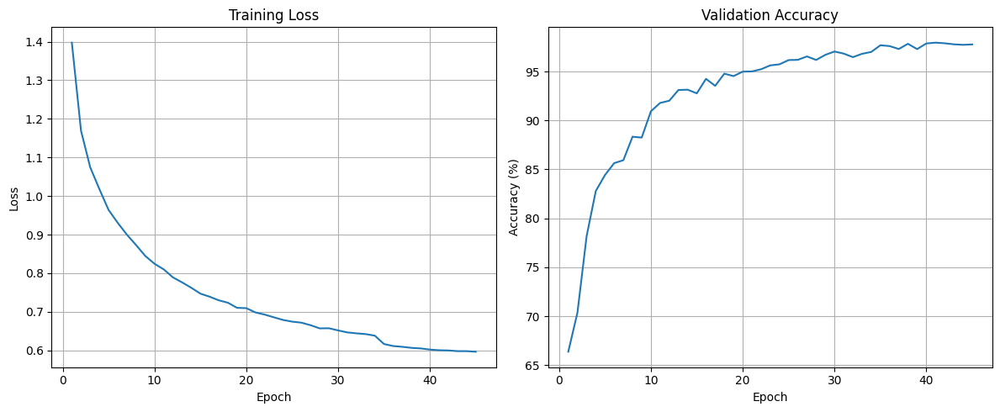

In [ ]:
# Plot training progress
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(range(1, epochs + 1), train_losses)
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(range(1, epochs + 1), val_accs)
plt.title('Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.grid(True)

plt.tight_layout()
plt.show()

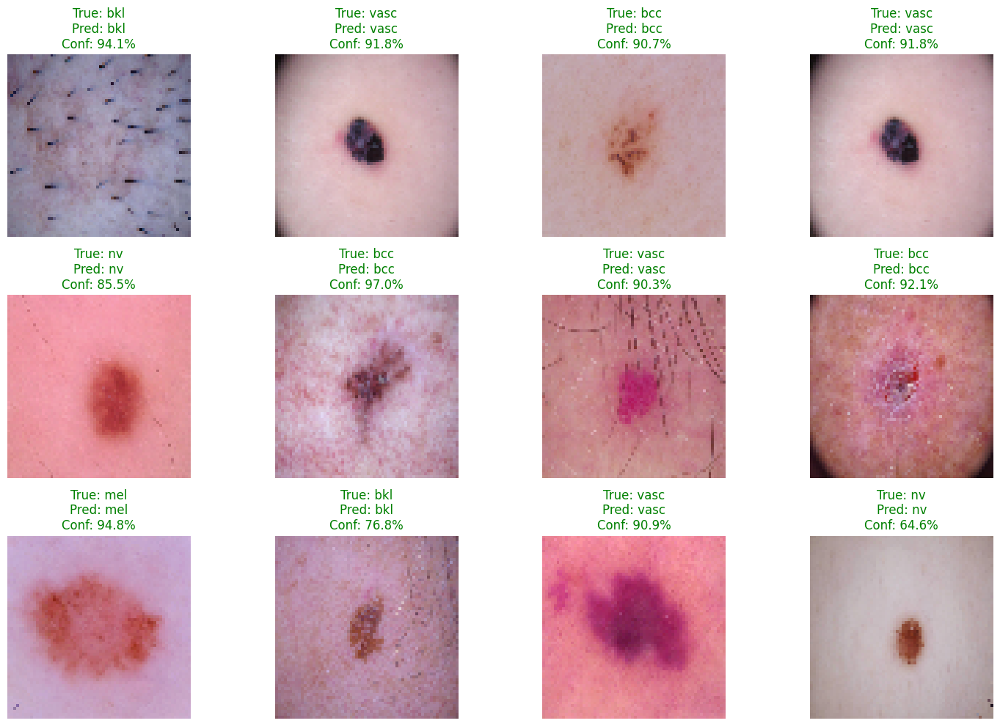

In [ ]:
# Load best model and run inference on some examples
model.load_state_dict(torch.load("best_model.pth"))
model.eval()

# Get class names for visualization
class_names = list(label_encoder.classes_)

# Visualize predictions
plt.figure(figsize=(15, 10))
with torch.no_grad():
    for i in range(12):
        img, true_label = val_dataset[i]
        img_tensor = img.unsqueeze(0).to(device)

        output = model(img_tensor)
        prob = F.softmax(output, dim=1)
        pred_label = torch.argmax(output, dim=1).item()
        confidence = prob[0][pred_label].item() * 100

        # Denormalize for display
        img_display = img.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5
        img_display = np.clip(img_display, 0, 1)

        plt.subplot(3, 4, i + 1)
        plt.imshow(img_display)
        color = "green" if pred_label == true_label else "red"
        plt.title(f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}\nConf: {confidence:.1f}%",
                 color=color)
        plt.axis('off')

plt.tight_layout()
plt.show()

<ipython-input-17-a24db4eea5a3>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=original_counts.index, y=original_counts.values, palette='viridis')
<ipython-input-17-a24db4eea5a3>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[class_names[i] for i in balanced_counts.index], y=balanced_counts.values, palette='viridis')


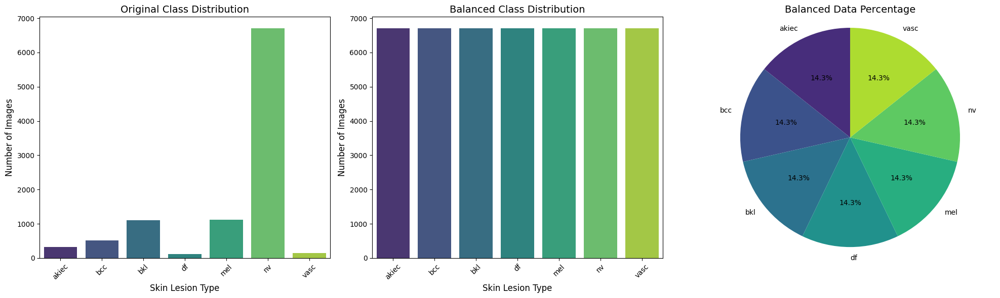

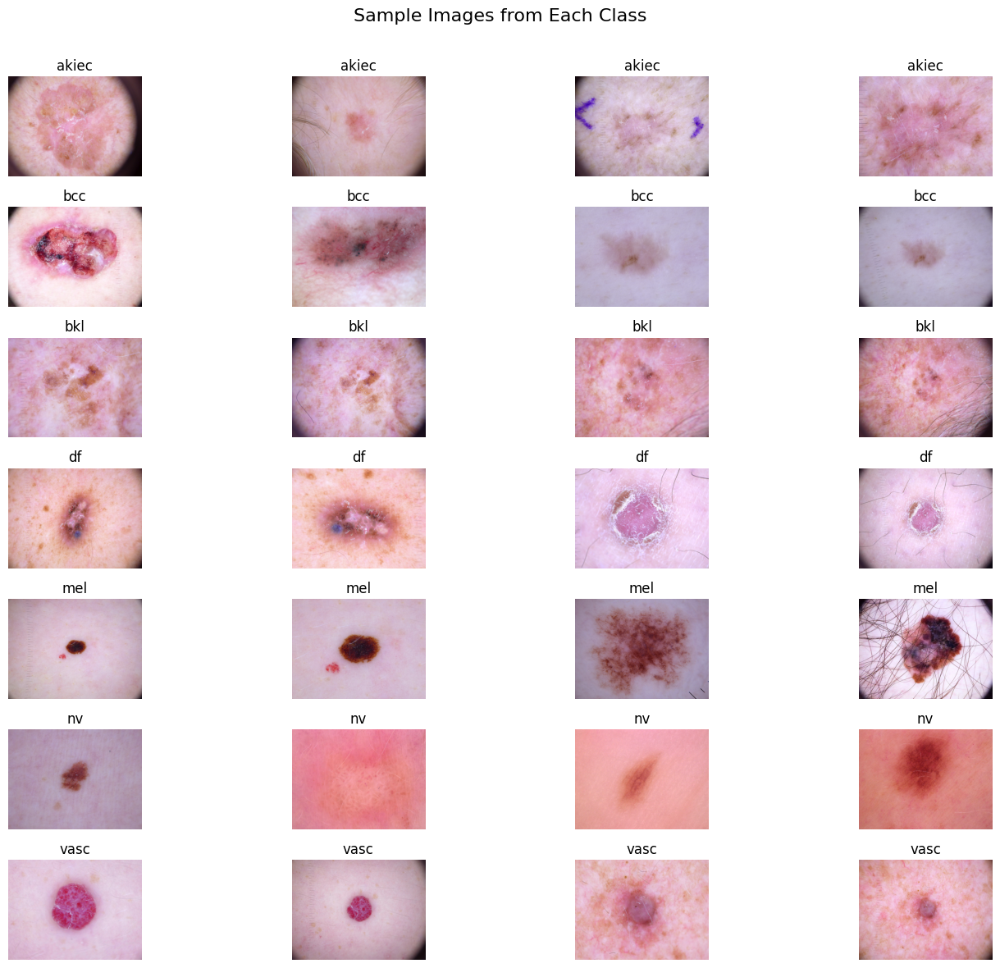

In [ ]:
!pip install seaborn
import seaborn as sns # Import seaborn library and alias it as 'sns'
# Data Distribution Visualization
def visualize_data_distribution():
    # Class distribution in original dataset
    plt.figure(figsize=(20, 6))

    # Original distribution
    plt.subplot(1, 3, 1)
    original_counts = df['dx'].value_counts().sort_index()
    sns.barplot(x=original_counts.index, y=original_counts.values, palette='viridis')
    plt.title('Original Class Distribution', fontsize=14)
    plt.xlabel('Skin Lesion Type', fontsize=12)
    plt.ylabel('Number of Images', fontsize=12)
    plt.xticks(rotation=45)

    # After balancing
    plt.subplot(1, 3, 2)
    balanced_counts = df_balanced['label'].value_counts().sort_index()
    sns.barplot(x=[class_names[i] for i in balanced_counts.index], y=balanced_counts.values, palette='viridis')
    plt.title('Balanced Class Distribution', fontsize=14)
    plt.xlabel('Skin Lesion Type', fontsize=12)
    plt.ylabel('Number of Images', fontsize=12)
    plt.xticks(rotation=45)

    # Pie chart of balanced data
    plt.subplot(1, 3, 3)
    plt.pie(balanced_counts.values, labels=[class_names[i] for i in balanced_counts.index],
            autopct='%1.1f%%', startangle=90, colors=sns.color_palette('viridis', len(class_names)))
    plt.title('Balanced Data Percentage', fontsize=14)
    plt.axis('equal')

    plt.tight_layout()
    plt.savefig('data_distribution.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Sample images from each class
    plt.figure(figsize=(15, 12))
    for i, class_name in enumerate(class_names):
        # Get 4 sample images from each class
        class_indices = np.where(df_balanced['label'] == i)[0][:4]
        for j, idx in enumerate(class_indices):
            img_path = df_balanced.iloc[idx]['path']
            img = Image.open(img_path).convert('RGB')
            plt.subplot(7, 4, i*4 + j + 1)
            plt.imshow(img)
            plt.title(class_name)
            plt.axis('off')

    plt.suptitle('Sample Images from Each Class', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig('sample_images_per_class.png', dpi=300, bbox_inches='tight')
    plt.show()

# Execute visualization
visualize_data_distribution()

Generating predictions: 100%|██████████| 74/74 [00:44<00:00,  1.65it/s]


<Figure size 1200x1000 with 0 Axes>

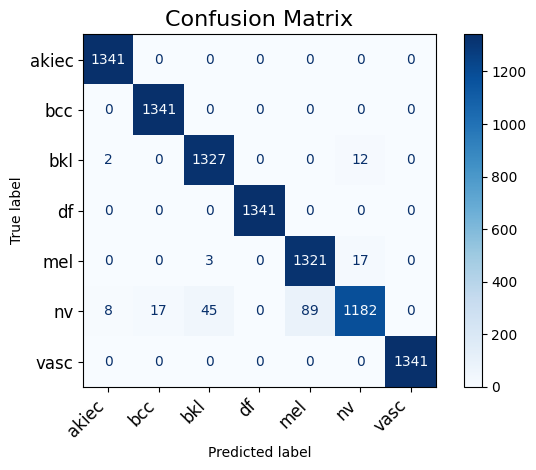

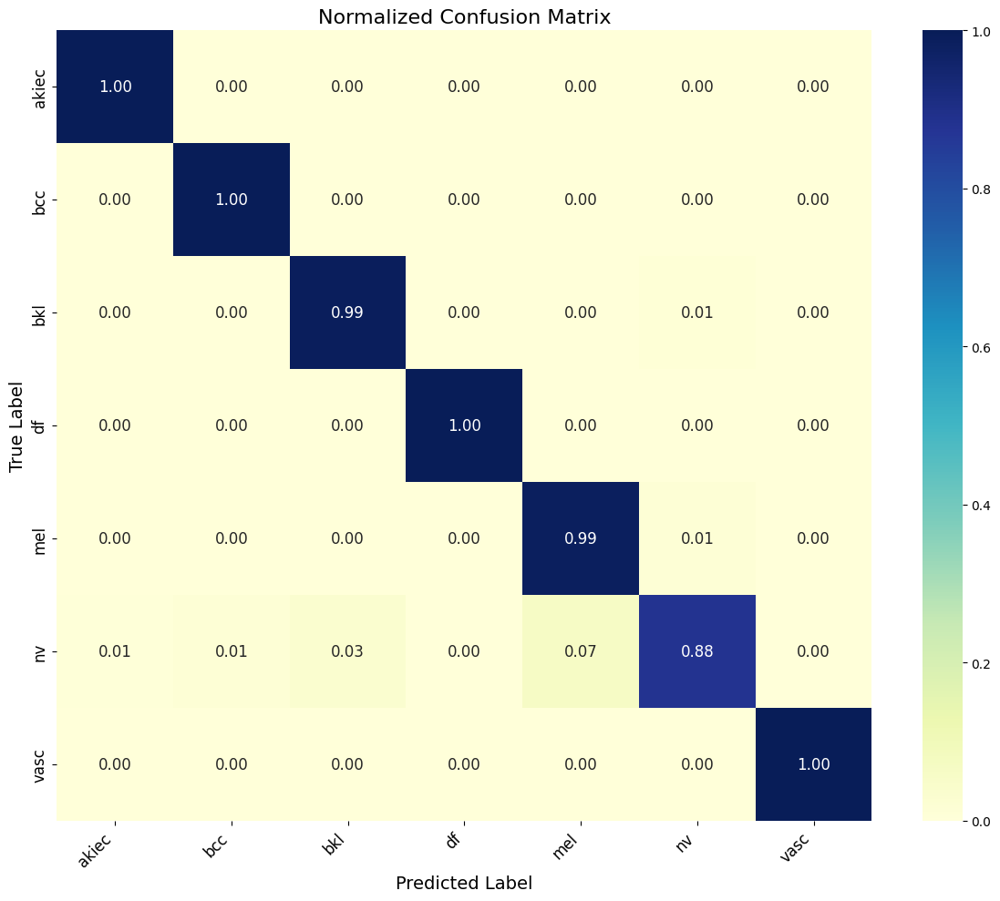

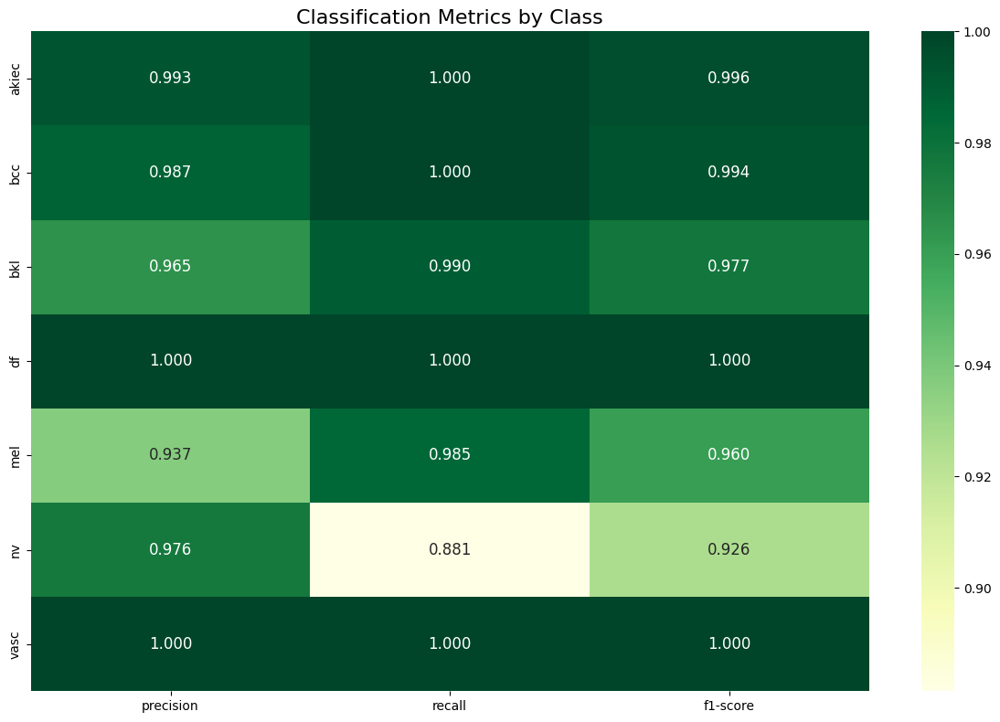


Classification Report:

              precision    recall  f1-score   support

       akiec       0.99      1.00      1.00      1341
         bcc       0.99      1.00      0.99      1341
         bkl       0.97      0.99      0.98      1341
          df       1.00      1.00      1.00      1341
         mel       0.94      0.99      0.96      1341
          nv       0.98      0.88      0.93      1341
        vasc       1.00      1.00      1.00      1341

    accuracy                           0.98      9387
   macro avg       0.98      0.98      0.98      9387
weighted avg       0.98      0.98      0.98      9387



In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
import seaborn as sns

def generate_confusion_matrix():
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc="Generating predictions"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Generate confusion matrix
    cm = confusion_matrix(all_labels, all_preds)

    # Plot standard confusion matrix
    plt.figure(figsize=(12, 10))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap='Blues', values_format='d')
    plt.title('Confusion Matrix', fontsize=16)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.savefig('confusion_matrix.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Plot normalized confusion matrix as heatmap
    plt.figure(figsize=(12, 10))
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='YlGnBu',
                xticklabels=class_names, yticklabels=class_names, annot_kws={"size": 12})
    plt.xlabel('Predicted Label', fontsize=14)
    plt.ylabel('True Label', fontsize=14)
    plt.title('Normalized Confusion Matrix', fontsize=16)
    plt.xticks(fontsize=12, rotation=45, ha='right')
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.savefig('normalized_confusion_matrix.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Print classification report
    report = classification_report(all_labels, all_preds, target_names=class_names, output_dict=True)
    df_report = pd.DataFrame(report).transpose()

    # Plot classification report as a heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(df_report.iloc[:-3, :3].astype(float), annot=True, cmap="YlGn", fmt='.3f', annot_kws={"size": 12})
    plt.title('Classification Metrics by Class', fontsize=16)
    plt.tight_layout()
    plt.savefig('classification_report_heatmap.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\nClassification Report:\n")
    print(classification_report(all_labels, all_preds, target_names=class_names))

    return cm, all_labels, all_preds

# Generate and display confusion matrix
cm, true_labels, pred_labels = generate_confusion_matrix()

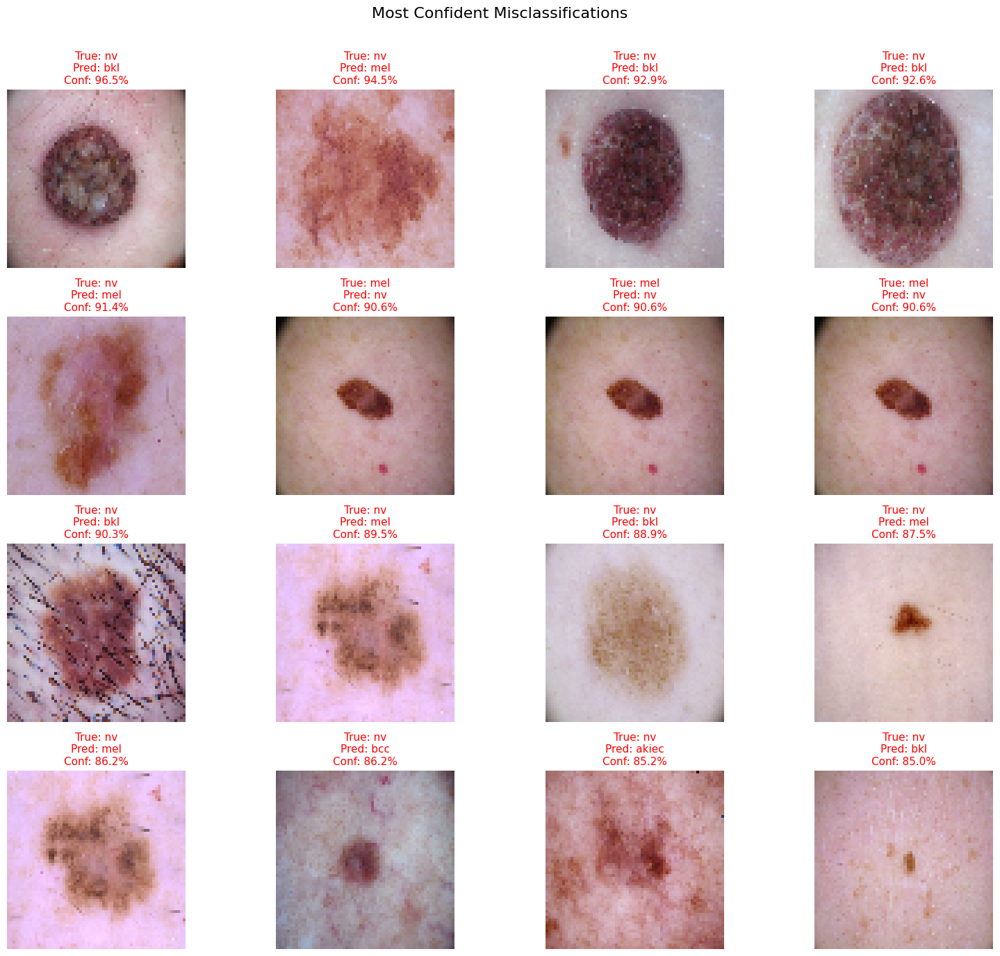

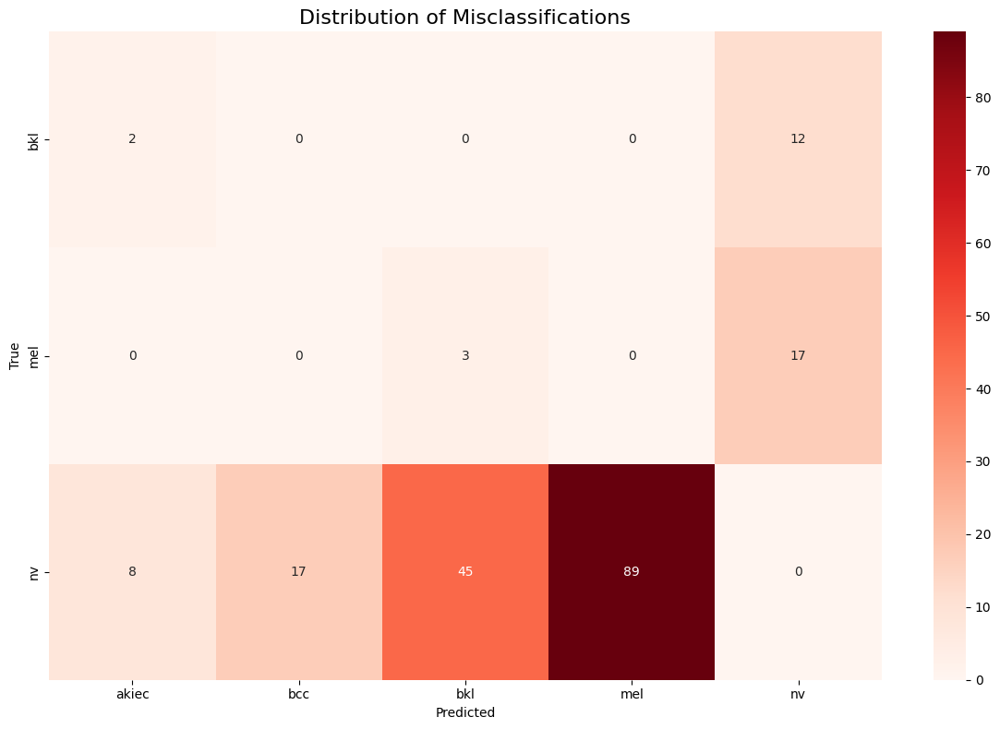

In [ ]:
def analyze_misclassifications():
    model.eval()
    misclassified_samples = []

    with torch.no_grad():
        # Iterate directly through the underlying dataset of val_dataset
        for i in range(len(val_dataset)):
            # Get image and label using the __getitem__ method
            image, label = val_dataset[i]
            image_tensor = image.unsqueeze(0).to(device)
            output = model(image_tensor)
            _, pred = torch.max(output, 1)
            pred = pred.item()

            if pred != label:
                prob = F.softmax(output, dim=1)[0, pred].item()
                misclassified_samples.append((i, label, pred, prob))
    # ... (Rest of the code remains the same)

    # Sort by prediction probability (most confident mistakes first)
    misclassified_samples.sort(key=lambda x: x[3], reverse=True)

    # Display most confident misclassifications
    n_samples = min(16, len(misclassified_samples))
    plt.figure(figsize=(16, 14))

    for i in range(n_samples):
        idx, true_label, pred_label, prob = misclassified_samples[i]

        # Get the image using __getitem__ again
        img, _ = val_dataset[idx]
        img_np = img.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5
        img_np = np.clip(img_np, 0, 1)

        plt.subplot(4, 4, i+1)
        plt.imshow(img_np)
        plt.title(f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}\nConf: {prob*100:.1f}%",
                 color='red', fontsize=11)
        plt.axis('off')

    plt.suptitle('Most Confident Misclassifications', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig('misclassifications.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Analyze the types of errors (which classes get confused with which)
    error_df = pd.DataFrame(misclassified_samples, columns=['idx', 'true', 'pred', 'prob'])

    # Create a matrix of confusions
    error_counts = pd.crosstab(
        [error_df['true'].map(lambda x: class_names[x])],
        [error_df['pred'].map(lambda x: class_names[x])],
        rownames=['True'], colnames=['Predicted']
    )

    # Visualize the error distribution
    plt.figure(figsize=(12, 8))
    sns.heatmap(error_counts, annot=True, cmap='Reds', fmt='d')
    plt.title('Distribution of Misclassifications', fontsize=16)
    plt.tight_layout()
    plt.savefig('error_distribution.png', dpi=300, bbox_inches='tight')
    plt.show()

    return misclassified_samples, error_df
# Analyze misclassifications
misclassified_samples, error_df = analyze_misclassifications()

Generating probabilities: 100%|██████████| 74/74 [00:46<00:00,  1.58it/s]


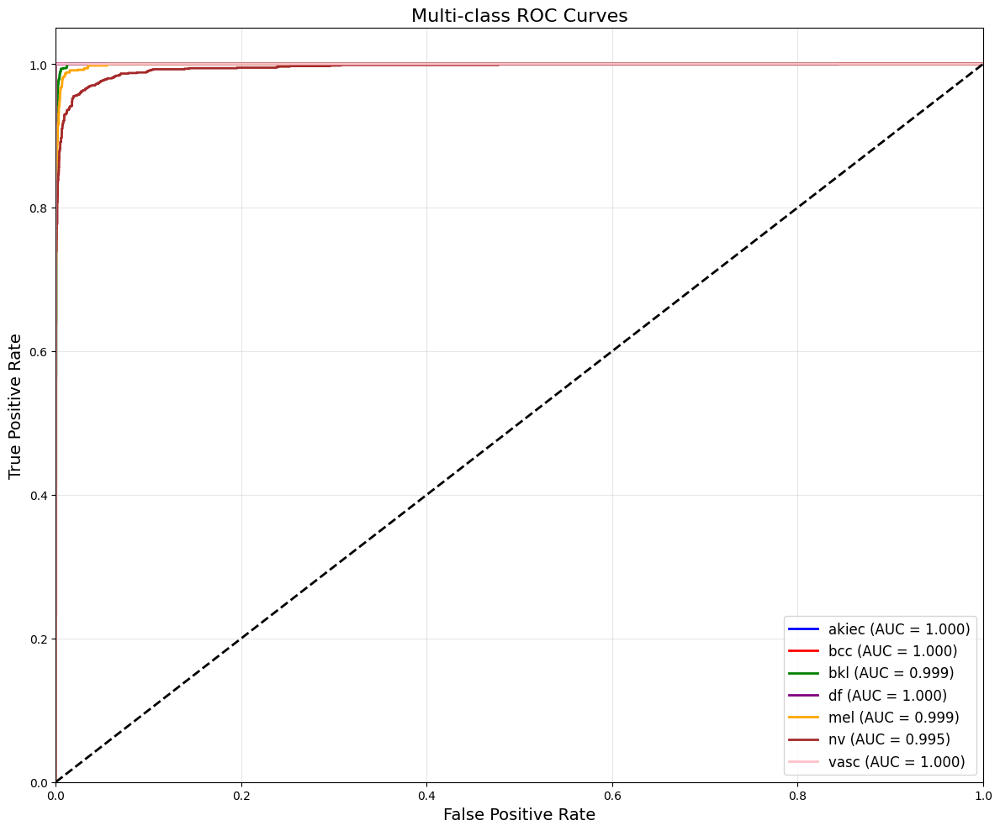

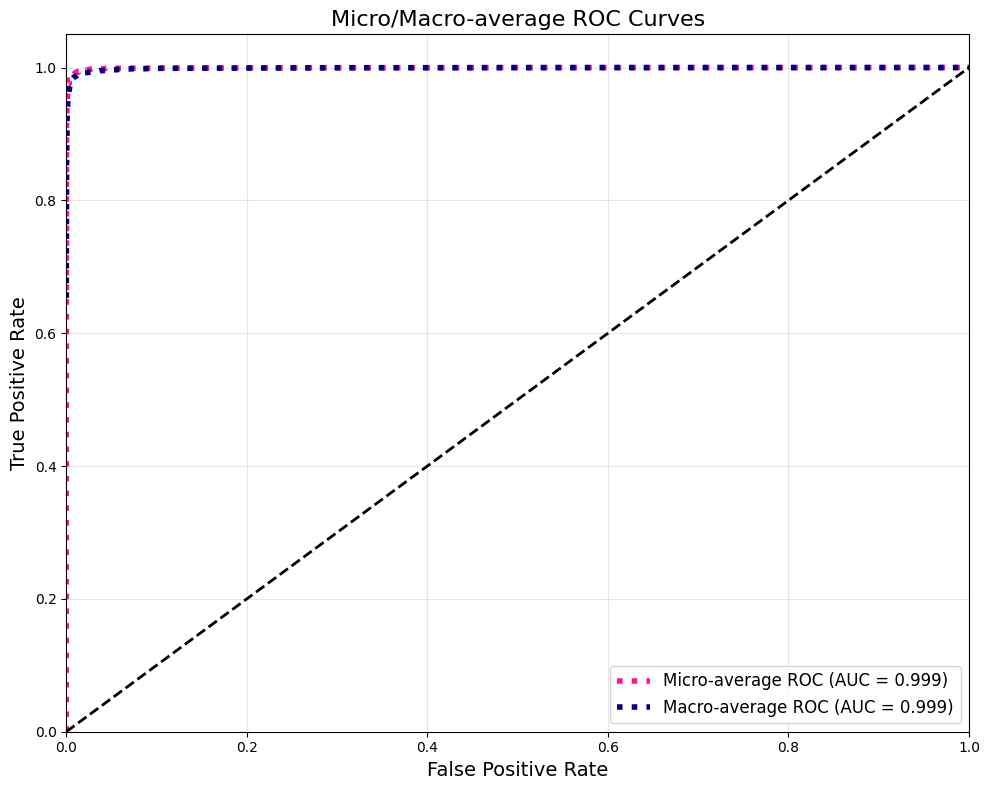

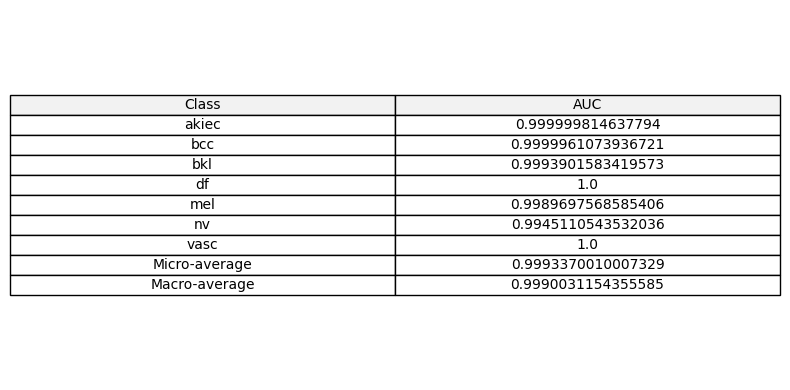

In [ ]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.preprocessing import label_binarize
from itertools import cycle

def plot_roc_curves():
    model.eval()
    all_probs = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc="Generating probabilities"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = F.softmax(outputs, dim=1)

            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    all_probs = np.array(all_probs)
    all_labels = np.array(all_labels)

    # Binarize labels for ROC curve
    n_classes = len(class_names)
    y_bin = label_binarize(all_labels, classes=range(n_classes))

    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], all_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves
    plt.figure(figsize=(12, 10))
    colors = cycle(['blue', 'red', 'green', 'purple', 'orange', 'brown', 'pink'])

    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'{class_names[i]} (AUC = {roc_auc[i]:.3f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=14)
    plt.ylabel('True Positive Rate', fontsize=14)
    plt.title('Multi-class ROC Curves', fontsize=16)
    plt.legend(loc="lower right", fontsize=12)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig('roc_curves.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Compute micro-average and macro-average ROC curves
    # Micro-average
    fpr["micro"], tpr["micro"], _ = roc_curve(y_bin.ravel(), all_probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # Macro-average
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # Plot micro/macro-average ROC curves
    plt.figure(figsize=(10, 8))
    plt.plot(fpr["micro"], tpr["micro"],
             label=f'Micro-average ROC (AUC = {roc_auc["micro"]:.3f})',
             color='deeppink', linestyle=':', linewidth=4)

    plt.plot(fpr["macro"], tpr["macro"],
             label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.3f})',
             color='navy', linestyle=':', linewidth=4)

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=14)
    plt.ylabel('True Positive Rate', fontsize=14)
    plt.title('Micro/Macro-average ROC Curves', fontsize=16)
    plt.legend(loc="lower right", fontsize=12)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig('average_roc_curves.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Create a table of AUC values
    auc_df = pd.DataFrame({'Class': class_names, 'AUC': [roc_auc[i] for i in range(n_classes)]})
    auc_df = pd.concat([
    auc_df,
    pd.DataFrame([{'Class': 'Micro-average', 'AUC': roc_auc['micro']}]),
    pd.DataFrame([{'Class': 'Macro-average', 'AUC': roc_auc['macro']}])
], ignore_index=True)

    plt.figure(figsize=(8, 4))
    plt.axis('off')
    plt.table(cellText=auc_df.values, colLabels=auc_df.columns,
              loc='center', cellLoc='center', colColours=['#f2f2f2']*2)
    plt.tight_layout()
    plt.savefig('auc_table.png', dpi=300, bbox_inches='tight')
    plt.show()

    return roc_auc

# Generate and display ROC curves
roc_auc_scores = plot_roc_curves()

Generating probabilities for PR curves: 100%|██████████| 74/74 [00:49<00:00,  1.50it/s]


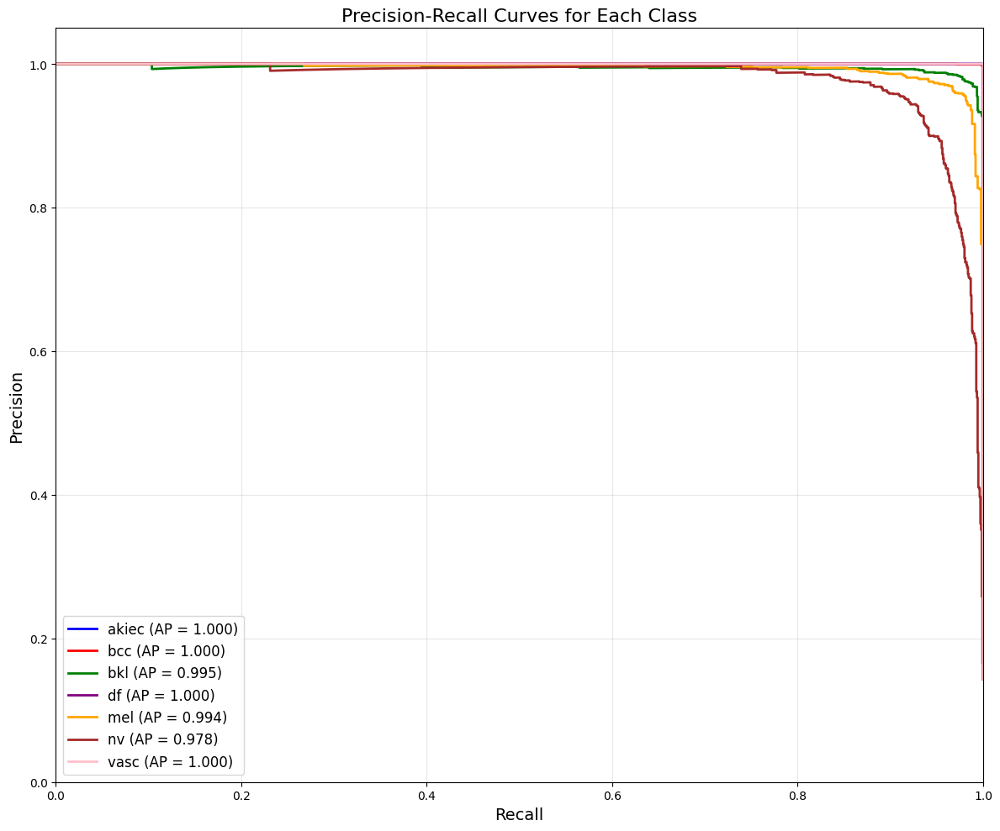

<Figure size 1000x800 with 0 Axes>

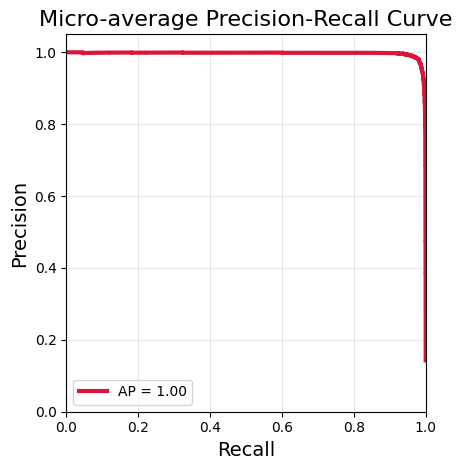

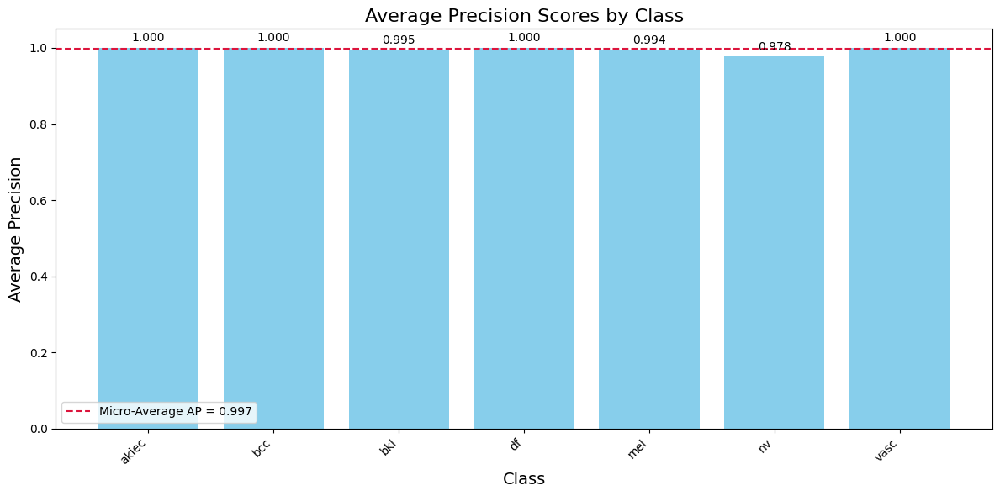

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score, PrecisionRecallDisplay

def plot_precision_recall_curves():
    model.eval()
    all_probs = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc="Generating probabilities for PR curves"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = F.softmax(outputs, dim=1)

            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    all_probs = np.array(all_probs)
    all_labels = np.array(all_labels)

    # Binarize labels
    n_classes = len(class_names)
    y_bin = label_binarize(all_labels, classes=range(n_classes))

    # Compute Precision-Recall curve and average precision for each class
    precision = dict()
    recall = dict()
    avg_precision = dict()

    for i in range(n_classes):
        precision[i], recall[i], _ = precision_recall_curve(y_bin[:, i], all_probs[:, i])
        avg_precision[i] = average_precision_score(y_bin[:, i], all_probs[:, i])

    # Plot Precision-Recall curves
    plt.figure(figsize=(12, 10))
    colors = cycle(['blue', 'red', 'green', 'purple', 'orange', 'brown', 'pink'])

    for i, color in zip(range(n_classes), colors):
        plt.plot(recall[i], precision[i], color=color, lw=2,
                 label=f'{class_names[i]} (AP = {avg_precision[i]:.3f})')

    plt.xlabel('Recall', fontsize=14)
    plt.ylabel('Precision', fontsize=14)
    plt.title('Precision-Recall Curves for Each Class', fontsize=16)
    plt.legend(loc="best", fontsize=12)
    plt.grid(alpha=0.3)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.tight_layout()
    plt.savefig('precision_recall_curves.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Compute micro-average precision-recall curve
    precision["micro"], recall["micro"], _ = precision_recall_curve(
        y_bin.ravel(), all_probs.ravel())
    avg_precision["micro"] = average_precision_score(y_bin, all_probs, average="micro")

    # Plot micro-average precision-recall curve
    plt.figure(figsize=(10, 8))

    display = PrecisionRecallDisplay(
        recall=recall["micro"],
        precision=precision["micro"],
        average_precision=avg_precision["micro"]
    )
    display.plot(color="crimson", lw=3)

    plt.xlabel('Recall', fontsize=14)
    plt.ylabel('Precision', fontsize=14)
    plt.title('Micro-average Precision-Recall Curve', fontsize=16)
    plt.grid(alpha=0.3)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.tight_layout()
    plt.savefig('micro_avg_precision_recall.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Create a bar chart of average precision scores
    plt.figure(figsize=(12, 6))
    bars = plt.bar(range(n_classes), [avg_precision[i] for i in range(n_classes)], color='skyblue')
    plt.xticks(range(n_classes), class_names, rotation=45, ha='right')
    plt.xlabel('Class', fontsize=14)
    plt.ylabel('Average Precision', fontsize=14)
    plt.title('Average Precision Scores by Class', fontsize=16)
    plt.axhline(y=avg_precision["micro"], color='crimson', linestyle='--',
                label=f'Micro-Average AP = {avg_precision["micro"]:.3f}')
    plt.legend()
    plt.ylim([0, 1.05])

    # Add value labels on top of bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{height:.3f}', ha='center', va='bottom', fontsize=10)

    plt.tight_layout()
    plt.savefig('average_precision_scores.png', dpi=300, bbox_inches='tight')
    plt.show()

    return avg_precision

# Generate and display Precision-Recall curves
avg_precision_scores = plot_precision_recall_curves()

In [ ]:
# Make sure to install the required package
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

!pip install -q pytorch-grad-cam
# Restart the kernel after installing the package.
# You can do this by going to "Kernel" -> "Restart" in the notebook menu.

from pytorch_grad_cam import GradCAM # This import should work after restarting the kernel.
from pytorch_grad_cam.utils.image import show_cam_on_image

# ... (Rest of your code) ...

class CAMModel(nn.Module):
    def __init__(self, model):
        super(CAMModel, self).__init__()
        self.model = model
        # Get the feature extractor part
        self.features = model.features
        # Define the target layer for GradCAM (last convolutional layer)
        self.target_layer = model.features[-1][0]  # Last conv layer

    def forward(self, x):
        return self.model(x)

def visualize_class_activation_maps():
    # Prepare the model for GradCAM
    cam_model = CAMModel(model)
    cam = GradCAM(model=cam_model, target_layer=cam_model.target_layer, use_cuda=torch.cuda.is_available())

    # Get 3 correctly classified and 3 misclassified samples for each class (or as many as available)
    correct_samples = {i: [] for i in range(len(class_names))}
    incorrect_samples = {i: [] for i in range(len(class_names))}

    model.eval()
    with torch.no_grad():
        for i, (image, label) in enumerate(val_dataset):
            if len(correct_samples[label]) >= 3 and len(incorrect_samples[label]) >= 3:
                continue  # Skip if we already have enough samples for this class

            image_tensor = image.unsqueeze(0).to(device)
            output = model(image_tensor)
            pred = torch.argmax(output, dim=1).item()

            if pred == label and len(correct_samples[label]) < 3:
                correct_samples[label].append((i, image))
            elif pred != label and len(incorrect_samples[label]) < 3:
                incorrect_samples[label].append((i, image, pred))

    # Set up the visualization
    fig, axes = plt.subplots(len(class_names), 6, figsize=(24, 4*len(class_names)))

    for class_idx in range(len(class_names)):
        # Column title for class
        axes[class_idx, 0].text(0.5, 1.15, f"Class: {class_names[class_idx]}",
                               transform=axes[class_idx, 0].transAxes,
                               fontsize=14, ha='center')

        # Process correct samples
        for j, (sample_idx, img) in enumerate(correct_samples[class_idx][:3]):
            input_tensor = img.unsqueeze(0).to(device)

            # Generate CAM for the predicted class
            with torch.no_grad():
                output = model(input_tensor)
                pred = torch.argmax(output, dim=1).item()
                prob = F.softmax(output, dim=1)[0][pred].item() * 100

            # Generate CAM
            grayscale_cam = cam(input_tensor=input_tensor, target_category=pred)
            grayscale_cam = grayscale_cam[0, :]

            # Convert tensor to numpy for visualization
            img_np = img.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5
            img_np = np.clip(img_np, 0, 1)

            # Overlay CAM on image
            visualization = show_cam_on_image(img_np, grayscale_cam, use_rgb=True)

            # Display original and CAM overlay
            # Display original and CAM overlay
            col_idx = j
            axes[class_idx, col_idx].imshow(visualization)
            axes[class_idx, col_idx].set_title(f"Correct: {prob:.1f}%", color='green', fontsize=12)
            axes[class_idx, col_idx].axis('off')

        # Fill empty slots if less than 3 correct samples
        for j in range(len(correct_samples[class_idx]), 3):
            axes[class_idx, j].axis('off')

        # Process incorrect samples
        for j, (sample_idx, img, wrong_pred) in enumerate(incorrect_samples[class_idx][:3]):
            input_tensor = img.unsqueeze(0).to(device)

            # Generate CAM for the predicted (wrong) class
            with torch.no_grad():
                output = model(input_tensor)
                pred = torch.argmax(output, dim=1).item()
                prob = F.softmax(output, dim=1)[0][pred].item() * 100

            # Generate CAM
            grayscale_cam = cam(input_tensor=input_tensor, target_category=pred)
            grayscale_cam = grayscale_cam[0, :]

            # Convert tensor to numpy for visualization
            img_np = img.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5
            img_np = np.clip(img_np, 0, 1)

            # Overlay CAM on image
            visualization = show_cam_on_image(img_np, grayscale_cam, use_rgb=True)

            # Display original and CAM overlay
            col_idx = j + 3
            axes[class_idx, col_idx].imshow(visualization)
            axes[class_idx, col_idx].set_title(f"Pred: {class_names[pred]}\n{prob:.1f}%",
                                              color='red', fontsize=12)
            axes[class_idx, col_idx].axis('off')

        # Fill empty slots if less than 3 incorrect samples
        for j in range(len(incorrect_samples[class_idx]), 3):
            axes[class_idx, j + 3].axis('off')

    # Add column headers
    fig.text(0.25, 0.98, 'Correctly Classified Samples', ha='center', va='center', fontsize=16)
    fig.text(0.75, 0.98, 'Incorrectly Classified Samples', ha='center', va='center', fontsize=16)

    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.subplots_adjust(wspace=0.05, hspace=0.2, top=0.95)
    plt.savefig('class_activation_maps.png', dpi=300, bbox_inches='tight')
    plt.show()

# Visualize class activation maps
visualize_class_activation_maps()

ERROR: Could not find a version that satisfies the requirement pytorch-grad-cam (from versions: none)
ERROR: No matching distribution found for pytorch-grad-cam


ModuleNotFoundError: No module named 'pytorch_grad_cam'

Extracting features: 100%|██████████| 74/74 [00:46<00:00,  1.61it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Applying t-SNE dimensionality reduction...


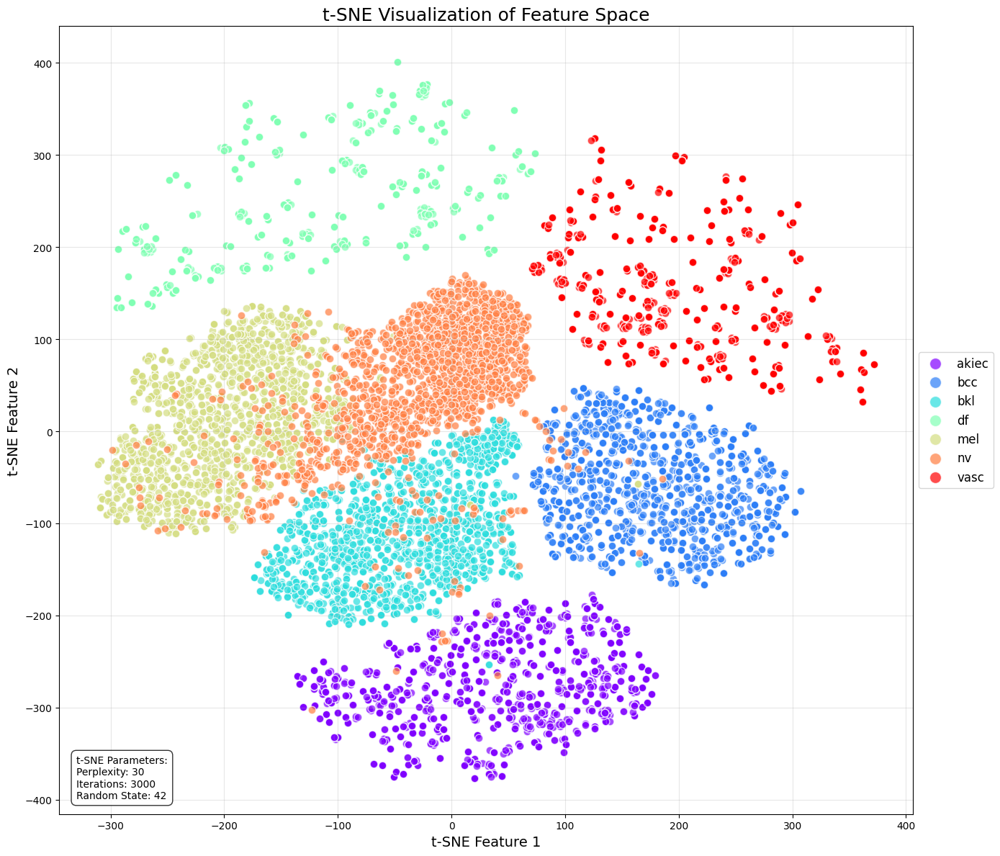

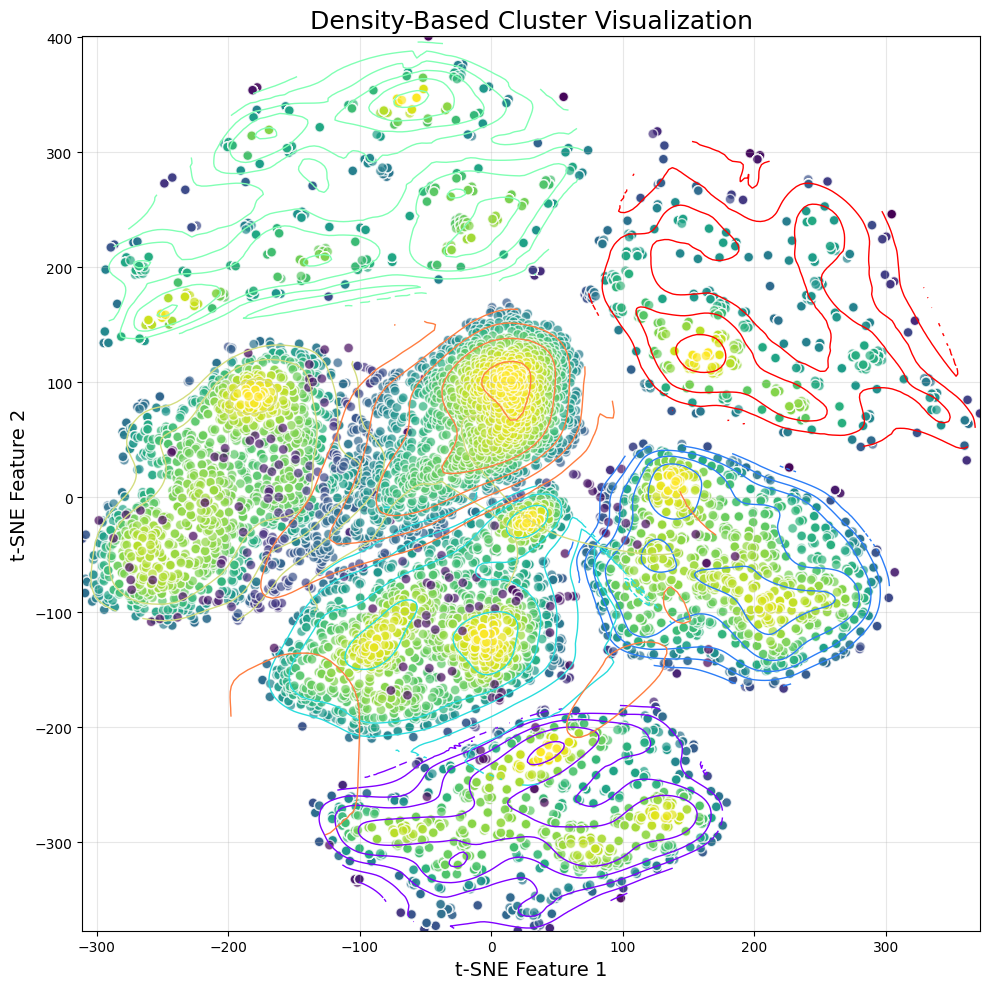

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.patches as mpatches

def extract_features(dataloader):
    """Extract features from the penultimate layer of the model"""
    model.eval()
    features = []
    labels = []

    # Create a hook to get features from the penultimate layer
    activation = {}
    def get_activation(name):
        def hook(model, input, output):
            activation[name] = output.detach()
        return hook

    # Register the hook on the second-to-last layer
    handle = model.classifier[-3].register_forward_hook(get_activation('penultimate'))

    with torch.no_grad():
        for images, targets in tqdm(dataloader, desc="Extracting features"):
            images = images.to(device)
            # Forward pass
            model(images)
            # Get the features
            batch_features = activation['penultimate'].cpu().numpy()
            features.append(batch_features)
            labels.append(targets.numpy())

    # Remove the hook
    handle.remove()

    # Concatenate all features and labels
    features = np.vstack(features)
    labels = np.concatenate(labels)

    return features, labels

def plot_tsne(features, labels):
    """Apply t-SNE and visualize the features"""
    # Apply t-SNE
    print("Applying t-SNE dimensionality reduction...")
    tsne = TSNE(n_components=2, random_state=SEED, perplexity=30, n_iter=3000)
    features_tsne = tsne.fit_transform(features)

    # Create a scatter plot
    plt.figure(figsize=(14, 12))

    # Define colors for each class
    colors = plt.cm.rainbow(np.linspace(0, 1, len(class_names)))

    # Plot each point with appropriate color and alpha for density visualization
    for i, c in enumerate(class_names):
        idx = labels == i
        plt.scatter(
            features_tsne[idx, 0],
            features_tsne[idx, 1],
            c=[colors[i]],
            label=c,
            alpha=0.7,
            edgecolors='w',
            s=60
        )

    # Add legend with custom size
    plt.legend(fontsize=12, markerscale=1.5, loc='center left', bbox_to_anchor=(1, 0.5))

    plt.title('t-SNE Visualization of Feature Space', fontsize=18)
    plt.xlabel('t-SNE Feature 1', fontsize=14)
    plt.ylabel('t-SNE Feature 2', fontsize=14)
    plt.grid(alpha=0.3)

    # Add a text box with t-SNE parameters
    plt.text(0.02, 0.02, f"t-SNE Parameters:\nPerplexity: 30\nIterations: 3000\nRandom State: {SEED}",
            transform=plt.gca().transAxes, fontsize=10,
            bbox=dict(boxstyle="round,pad=0.5", facecolor="white", alpha=0.8))

    plt.tight_layout()
    plt.savefig('tsne_visualization.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Create a density plot to better visualize cluster overlaps
    plt.figure(figsize=(10, 10))

    # Plot contours for each class
    for i, c in enumerate(class_names):
        idx = labels == i
        if np.sum(idx) > 10:  # Only plot if we have enough points
            x = features_tsne[idx, 0]
            y = features_tsne[idx, 1]

            # Calculate kernel density estimate
            from scipy.stats import gaussian_kde
            xy = np.vstack([x, y])
            density = gaussian_kde(xy)(xy)

            # Sort points by density
            idx_sorted = np.argsort(density)
            x = x[idx_sorted]
            y = y[idx_sorted]
            density = density[idx_sorted]

            plt.scatter(x, y, c=density, cmap=plt.cm.viridis,
                      label=c, alpha=0.7, s=50, edgecolors='w')

            # Add contour lines
            from scipy.interpolate import griddata
            xi = np.linspace(min(x), max(x), 100)
            yi = np.linspace(min(y), max(y), 100)
            zi = griddata((x, y), density, (xi[None, :], yi[:, None]), method='cubic')
            plt.contour(xi, yi, zi, colors=[colors[i]], linewidths=1, levels=5)

    plt.title('Density-Based Cluster Visualization', fontsize=18)
    plt.xlabel('t-SNE Feature 1', fontsize=14)
    plt.ylabel('t-SNE Feature 2', fontsize=14)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig('tsne_density_visualization.png', dpi=300, bbox_inches='tight')
    plt.show()

# Extract features from validation set
features, labels = extract_features(val_loader)

# Plot t-SNE visualizations
plot_tsne(features, labels)

Initializing SHAP DeepExplainer...
Calculating SHAP values...


/usr/local/lib/python3.11/dist-packages/shap/explainers/_deep/deep_pytorch.py:255: UserWarning: unrecognized nn.Module: Flatten
  warnings.warn(f"unrecognized nn.Module: {module_type}")


IndexError: index 3 is out of bounds for axis 0 with size 3

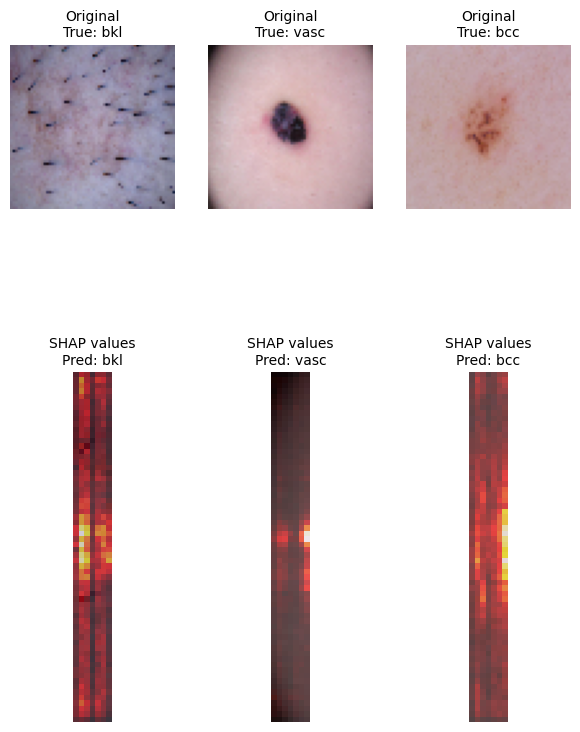

In [ ]:
import shap

def visualize_feature_importance():
    """
    Visualize which regions of input images are most important for predictions
    using SHAP (SHapley Additive exPlanations)
    """
    # Get a subset of validation images
    background = []
    for i, (images, _) in enumerate(val_loader):
        background.append(images[:8].to(device))
        if i >= 2:  # Limit background samples
            break
    background = torch.cat(background, dim=0)

    # Define a function that takes preprocessed images and returns model predictions
    def model_predict(images):
        with torch.no_grad():
            return model(images).cpu().numpy()

    # Initialize the SHAP explainer
    print("Initializing SHAP DeepExplainer...")
    explainer = shap.DeepExplainer(model, background)

    # Get a batch of images to explain
    images, labels = next(iter(val_loader))
    images = images[:8].to(device)  # Explain first 8 images
    labels = labels[:8]

    # Calculate SHAP values
    print("Calculating SHAP values...")
    shap_values = explainer.shap_values(images)

    # Create detailed visualizations
    plt.figure(figsize=(20, 10))

    for i in range(min(8, len(images))):
        # Get the original image
        img = images[i].cpu().permute(1, 2, 0).numpy() * 0.5 + 0.5
        img = np.clip(img, 0, 1)

        # Get model prediction
        with torch.no_grad():
            pred = model(images[i:i+1]).argmax(1).item()

        # Get the SHAP values for the predicted class
        # Check if pred is within the bounds of shap_values
        if pred < len(shap_values):
            shap_for_pred = shap_values[pred][i]
        else:
            print(f"Warning: Prediction {pred} out of bounds for SHAP values. Skipping visualization for this image.")
            continue  # Skip visualization if pred is out of bounds

        # Visualize the original image
        plt.subplot(2, 8, i + 1)
        plt.imshow(img)
        plt.title(f"Original\nTrue: {class_names[labels[i]]}", fontsize=10)
        plt.axis('off')

        # Visualize the SHAP values
        plt.subplot(2, 8, i + 9)

        # Sum SHAP values along channels for visualization
        shap_rgb = np.abs(shap_for_pred).sum(axis=0)
        # Normalize for visualization
        shap_rgb = shap_rgb / np.max(shap_rgb)

        # Visualize SHAP values overlaid on the image
        plt.imshow(img)
        plt.imshow(shap_rgb, cmap='hot', alpha=0.6)
        plt.title(f"SHAP values\nPred: {class_names[pred]}", fontsize=10)
        plt.axis('off')

    plt.suptitle('Feature Importance Visualization with SHAP', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig('shap_feature_importance.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Create a different view: SHAP value summary
    plt.figure(figsize=(15, 10))

    # Process and reshape SHAP values for visualization
    # For each class, calculate the average absolute SHAP value per pixel
    class_importance_maps = []

    for class_idx in range(len(class_names)):
        if class_idx < len(shap_values):  # Check if we have SHAP values for this class
            # Average absolute SHAP values across all images
            class_map = np.abs(shap_values[class_idx]).mean(axis=0)
            # Sum channels for a single heatmap
            class_map = class_map.sum(axis=0)
            class_importance_maps.append(class_map)

    # Plot importance maps for each class
    for i, importance_map in enumerate(class_importance_maps):
        if i >= len(class_names):
            break

        plt.subplot(2, 4, i + 1)
        plt.imshow(importance_map, cmap='hot')
        plt.title(f"Class: {class_names[i]}", fontsize=12)
        plt.colorbar(label='Average |SHAP value|')
        plt.axis('off')

    plt.suptitle('Average Feature Importance by Class', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig('class_importance_maps.png', dpi=300, bbox_inches='tight')
    plt.show()

# Visualize feature importance
visualize_feature_importance()

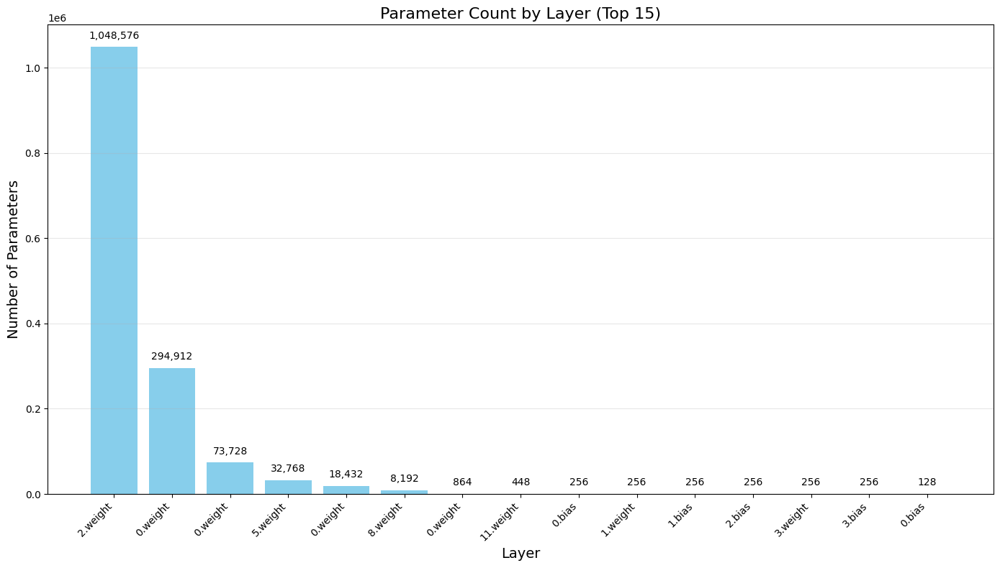

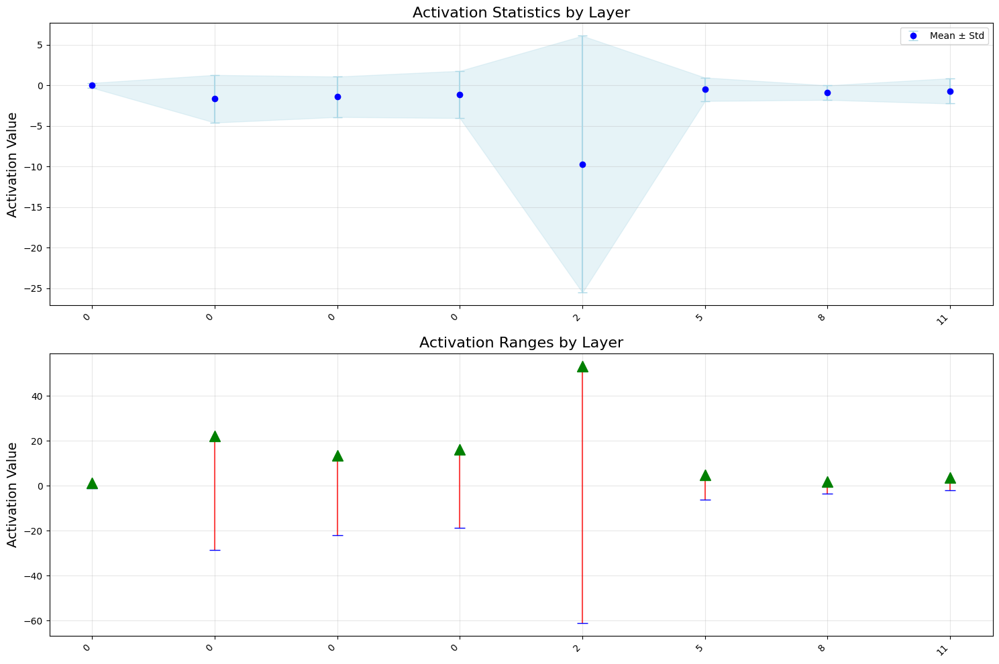

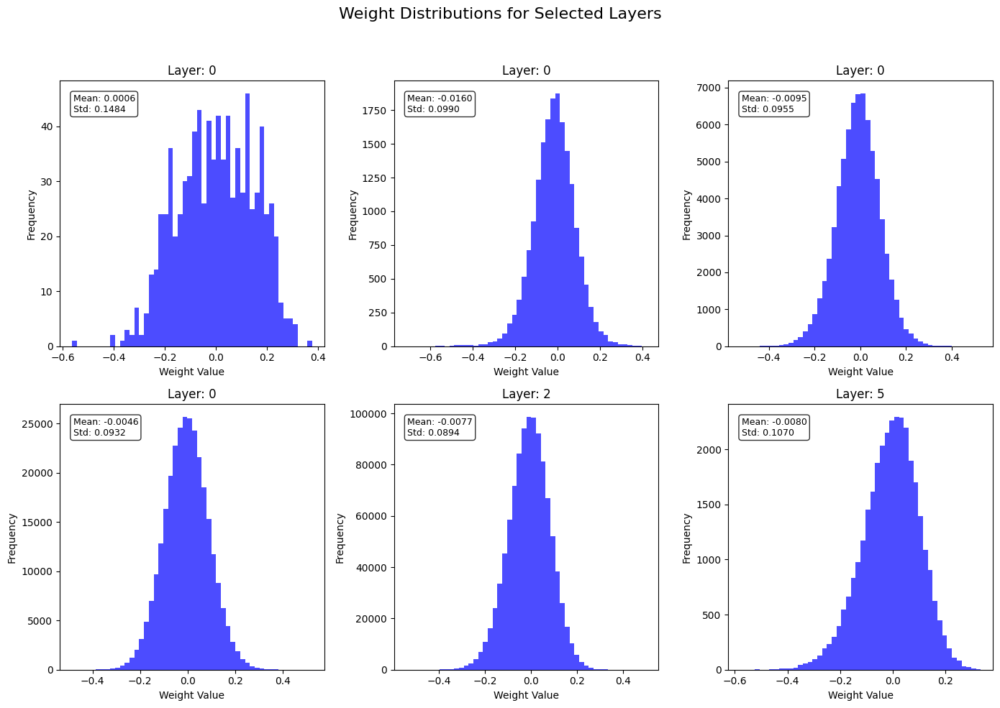

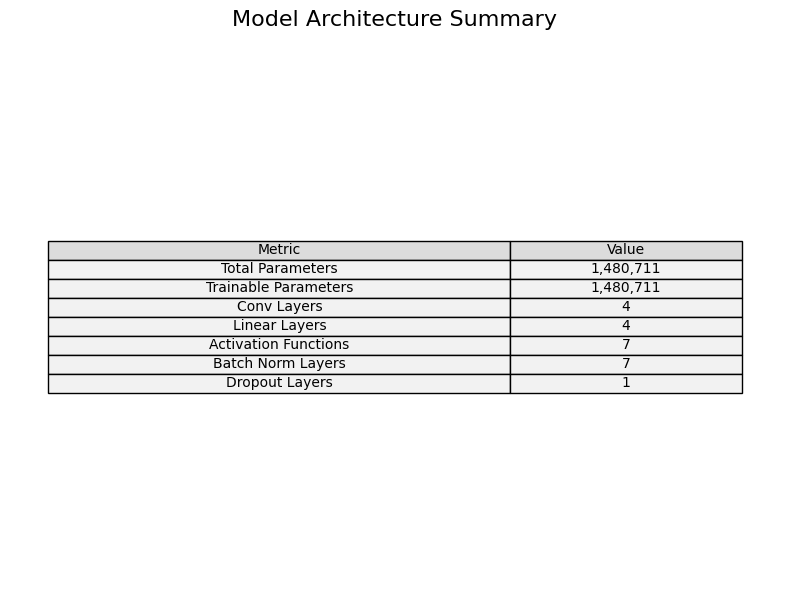

In [ ]:
def analyze_model_complexity():
    """
    Analyze model complexity and visualize parameter distributions
    """
    # Count parameters by layer
    total_params = 0
    layer_params = {}

    for name, param in model.named_parameters():
        if param.requires_grad:
            layer_params[name] = param.numel()
            total_params += param.numel()

    # Sort layers by parameter count
    sorted_layers = sorted(layer_params.items(), key=lambda x: x[1], reverse=True)

    # Plot parameter distribution by layer
    plt.figure(figsize=(14, 8))

    # Bar chart of parameters by layer
    layer_names = [name.split('.')[-2] + '.' + name.split('.')[-1] for name, _ in sorted_layers[:15]]
    param_counts = [count for _, count in sorted_layers[:15]]

    bars = plt.bar(range(len(layer_names)), param_counts, color='skyblue')
    plt.xticks(range(len(layer_names)), layer_names, rotation=45, ha='right')
    plt.title('Parameter Count by Layer (Top 15)', fontsize=16)
    plt.xlabel('Layer', fontsize=14)
    plt.ylabel('Number of Parameters', fontsize=14)
    plt.grid(axis='y', alpha=0.3)

    # Add value labels on top of bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + total_params*0.01,
                f'{height:,}', ha='center', va='bottom', fontsize=10, rotation=0)

    plt.tight_layout()
    plt.savefig('parameter_distribution.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Analyze activation statistics and weight distributions
    activation_stats = {}
    weight_distributions = {}

    # Hook for collecting activation statistics
    def hook_fn(name):
        def hook(module, input, output):
            activation_stats[name] = {
                'mean': output.detach().mean().cpu().item(),
                'std': output.detach().std().cpu().item(),
                'min': output.detach().min().cpu().item(),
                'max': output.detach().max().cpu().item()
            }
        return hook

    # Register hooks for key layers
    hooks = []
    for name, module in model.named_modules():
        if isinstance(module, nn.Conv2d) or isinstance(module, nn.Linear):
            hooks.append(module.register_forward_hook(hook_fn(name)))
            # Collect weight distribution
            weight_distributions[name] = {
                'mean': module.weight.data.mean().cpu().item(),
                'std': module.weight.data.std().cpu().item(),
                'min': module.weight.data.min().cpu().item(),
                'max': module.weight.data.max().cpu().item()
            }

    # Run a forward pass to collect activation statistics
    model.eval()
    with torch.no_grad():
        images, _ = next(iter(val_loader))
        model(images[:8].to(device))

    # Remove hooks
    for hook in hooks:
        hook.remove()

    # Plot activation statistics
    plt.figure(figsize=(15, 10))

    # Prepare data for plotting
    layer_names = list(activation_stats.keys())
    means = [activation_stats[name]['mean'] for name in layer_names]
    stds = [activation_stats[name]['std'] for name in layer_names]
    mins = [activation_stats[name]['min'] for name in layer_names]
    maxs = [activation_stats[name]['max'] for name in layer_names]

    # Simplify layer names for display
    display_names = [name.split('.')[-1] if len(name.split('.')) > 1 else name for name in layer_names]

    # Plot activation means and standard deviations
    plt.subplot(2, 1, 1)
    plt.errorbar(range(len(display_names)), means, yerr=stds, fmt='o', capsize=5,
                color='blue', ecolor='lightblue', label='Mean ± Std')
    plt.fill_between(range(len(display_names)),
                    [means[i] - stds[i] for i in range(len(means))],
                    [means[i] + stds[i] for i in range(len(means))],
                    color='lightblue', alpha=0.3)
    plt.xticks(range(len(display_names)), display_names, rotation=45, ha='right')
    plt.title('Activation Statistics by Layer', fontsize=16)
    plt.ylabel('Activation Value', fontsize=14)
    plt.legend()
    plt.grid(alpha=0.3)

    # Plot activation ranges
    plt.subplot(2, 1, 2)
    for i, name in enumerate(display_names):
        plt.vlines(i, mins[i], maxs[i], color='red', alpha=0.7)
        plt.plot(i, mins[i], 'b_', markersize=12)
        plt.plot(i, maxs[i], 'g^', markersize=12)

    plt.xticks(range(len(display_names)), display_names, rotation=45, ha='right')
    plt.title('Activation Ranges by Layer', fontsize=16)
    plt.ylabel('Activation Value', fontsize=14)
    plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.savefig('activation_statistics.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Visualize weight distributions
    plt.figure(figsize=(14, 10))

    # Select a few key layers to visualize
    selected_layers = list(weight_distributions.keys())[:6]  # First 6 layers

    for i, layer in enumerate(selected_layers):
        weights = None
        for name, param in model.named_parameters():
            if name == layer + '.weight':
                weights = param.detach().cpu().numpy().flatten()
                break

        if weights is not None:
            plt.subplot(2, 3, i+1)
            plt.hist(weights, bins=50, alpha=0.7, color='blue')
            plt.title(f"Layer: {layer.split('.')[-1]}", fontsize=12)
            plt.xlabel('Weight Value', fontsize=10)
            plt.ylabel('Frequency', fontsize=10)

            # Add distribution statistics
            stats = weight_distributions[layer]
            plt.text(0.05, 0.95, f"Mean: {stats['mean']:.4f}\nStd: {stats['std']:.4f}",
                     transform=plt.gca().transAxes, fontsize=9,
                     verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.suptitle('Weight Distributions for Selected Layers', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig('weight_distributions.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Create model architecture summary
    model_summary = {
        'Total Parameters': total_params,
        'Trainable Parameters': sum(p.numel() for p in model.parameters() if p.requires_grad),
        'Conv Layers': sum(1 for m in model.modules() if isinstance(m, nn.Conv2d)),
        'Linear Layers': sum(1 for m in model.modules() if isinstance(m, nn.Linear)),
        'Activation Functions': sum(1 for m in model.modules() if isinstance(m, nn.ReLU)),
        'Batch Norm Layers': sum(1 for m in model.modules() if isinstance(m, nn.BatchNorm2d) or isinstance(m, nn.BatchNorm1d)),
        'Dropout Layers': sum(1 for m in model.modules() if isinstance(m, nn.Dropout))
    }

    # Visualize model summary as a table
    plt.figure(figsize=(8, 6))
    plt.axis('off')
    table_data = [[k, f"{v:,}" if isinstance(v, int) else v] for k, v in model_summary.items()]
    plt.table(cellText=table_data, colLabels=['Metric', 'Value'],
              loc='center', cellLoc='center', colWidths=[0.6, 0.3],
              cellColours=[['#f2f2f2', '#f2f2f2'] for _ in range(len(table_data))],
              colColours=['#dcdcdc', '#dcdcdc'])
    plt.title('Model Architecture Summary', fontsize=16, pad=20)
    plt.tight_layout()
    plt.savefig('model_summary.png', dpi=300, bbox_inches='tight')
    plt.show()

# Analyze model complexity
analyze_model_complexity()

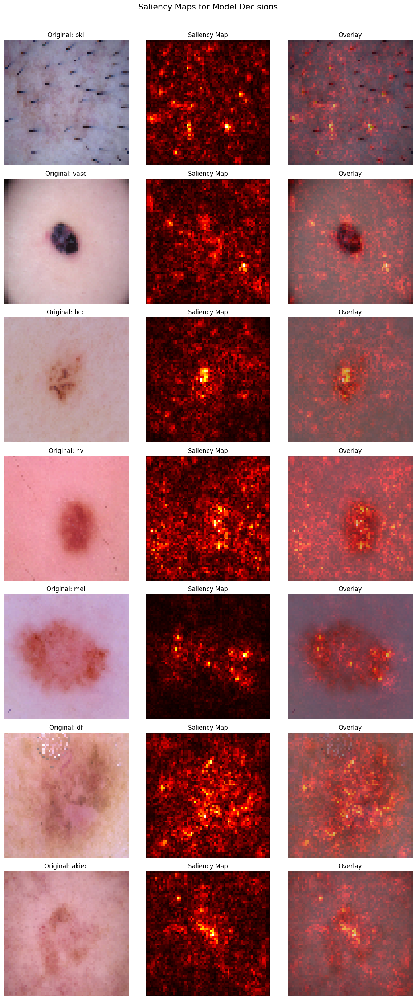

In [ ]:
def compute_saliency_maps():
    """
    Generate saliency maps for input images to visualize what parts of the image
    are most influential for the model's decisions
    """
    model.eval()

    # Select some representative images from validation set
    sample_images = []
    sample_labels = []

    # Get one sample from each class
    collected_classes = set()
    for img, label in val_dataset:
        if label.item() not in collected_classes:
            sample_images.append(img)
            sample_labels.append(label.item())
            collected_classes.add(label.item())

            if len(collected_classes) == len(class_names):
                break

    # Create figure for saliency maps
    fig, axes = plt.subplots(len(sample_images), 3, figsize=(12, 4*len(sample_images)))

    for i, (img, label) in enumerate(zip(sample_images, sample_labels)):
        # Original image
        img_np = img.permute(1, 2, 0).numpy() * 0.5 + 0.5
        img_np = np.clip(img_np, 0, 1)
        axes[i, 0].imshow(img_np)
        axes[i, 0].set_title(f"Original: {class_names[label]}", fontsize=12)
        axes[i, 0].axis('off')

        # Compute saliency map
        img_tensor = img.unsqueeze(0).to(device)
        img_tensor.requires_grad = True

        # Forward pass
        output = model(img_tensor)
        score = output[0, label]  # Score for the true class

        # Backward pass (compute gradient of score w.r.t. input image)
        score.backward()

        # Get gradient of the input
        saliency, _ = torch.max(img_tensor.grad.data.abs(), dim=1)
        saliency = saliency.squeeze().cpu().numpy()

        # Normalize saliency map
        saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)

        # Display saliency map
        axes[i, 1].imshow(saliency, cmap='hot')
        axes[i, 1].set_title("Saliency Map", fontsize=12)
        axes[i, 1].axis('off')

        # Display overlay of saliency on original image
        axes[i, 2].imshow(img_np)
        axes[i, 2].imshow(saliency, cmap='hot', alpha=0.5)
        axes[i, 2].set_title("Overlay", fontsize=12)
        axes[i, 2].axis('off')

    plt.suptitle('Saliency Maps for Model Decisions', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig('saliency_maps.png', dpi=300, bbox_inches='tight')
    plt.show()

# Compute saliency maps
compute_saliency_maps()

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)



Evaluating Custom DCNN...
  Parameters: 1.48M
  Training Time: 271.92s per epoch
  Inference Time: 0.17ms per image
  Validation Accuracy: 14.06%

Evaluating ResNet18...
  Parameters: 11.18M
  Training Time: 408.91s per epoch
  Inference Time: 0.13ms per image
  Validation Accuracy: 17.97%

Evaluating EfficientNet-B0...
  Parameters: 4.02M
  Training Time: 259.25s per epoch
  Inference Time: 0.39ms per image
  Validation Accuracy: 15.55%

Evaluating MobileNetV2...
  Parameters: 2.23M
  Training Time: 264.36s per epoch
  Inference Time: 0.26ms per image
  Validation Accuracy: 14.61%

Evaluating DenseNet121...
  Parameters: 6.96M
  Training Time: 262.21s per epoch
  Inference Time: 0.63ms per image
  Validation Accuracy: 29.69%

Model Architecture Comparison:
      Architecture  Parameters (M)  Training Time (s/epoch)  \
4      DenseNet121        6.961031               262.213256   
1         ResNet18       11.180103               408.913873   
2  EfficientNet-B0        4.016515        

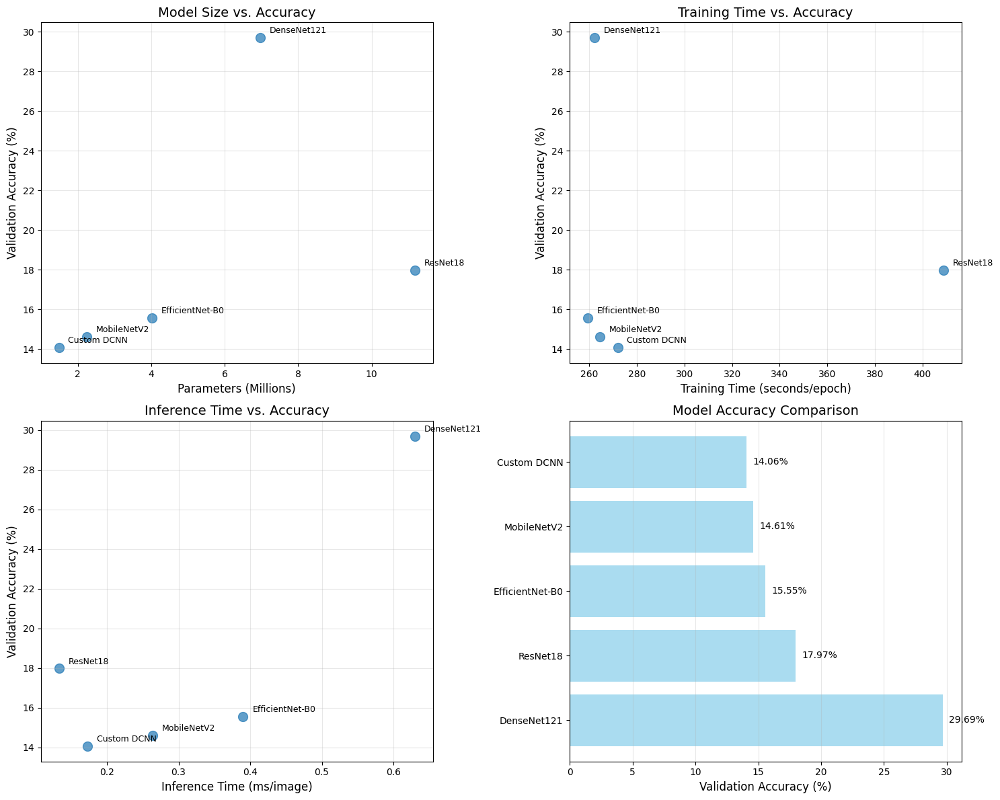

In [ ]:
# Import models and utility functions for comparison
import timm
from torchvision import models
import time

def compare_model_architectures():
    """
    Compare the DCNN model with other popular architectures
    """
    # Define model architectures to compare
    model_architectures = {
        'Custom DCNN': DCNN().to(device),
        'ResNet18': models.resnet18(pretrained=False, num_classes=len(class_names)).to(device),
        'EfficientNet-B0': timm.create_model('efficientnet_b0',
                                             pretrained=False,
                                             num_classes=len(class_names)).to(device),
        'MobileNetV2': models.mobilenet_v2(pretrained=False,
                                           num_classes=len(class_names)).to(device),
        'DenseNet121': models.densenet121(pretrained=False,
                                          num_classes=len(class_names)).to(device)
    }

    # Results storage
    results = {
        'Architecture': [],
        'Parameters (M)': [],
        'Training Time (s/epoch)': [],
        'Inference Time (ms/image)': [],
        'Validation Accuracy (%)': []
    }

    # Compare each model
    for name, model in model_architectures.items():
        print(f"\nEvaluating {name}...")

        # Count parameters
        params = sum(p.numel() for p in model.parameters())
        params_m = params / 1_000_000  # Convert to millions
        results['Architecture'].append(name)
        results['Parameters (M)'].append(params_m)

        # Measure training time (simulate one epoch)
        model.train()
        criterion = LabelSmoothingLoss()
        optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)

        # Limit to a smaller subset for timing
        batch_limit = 10
        start_time = time.time()
        for i, (images, labels) in enumerate(train_loader):
            if i >= batch_limit:
                break
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

        train_time = (time.time() - start_time) / batch_limit * len(train_loader)
        results['Training Time (s/epoch)'].append(train_time)

        # Measure inference time
        model.eval()
        inference_times = []
        n_samples = 100

        with torch.no_grad():
            for i, (images, _) in enumerate(val_loader):
                if i * images.shape[0] >= n_samples:
                    break

                images = images.to(device)

                # Measure single batch inference time
                start_time = time.time()
                _ = model(images)
                end_time = time.time()

                # Calculate time per image
                time_per_image = (end_time - start_time) * 1000 / images.shape[0]  # ms
                inference_times.append(time_per_image)

        avg_inference_time = np.mean(inference_times)
        results['Inference Time (ms/image)'].append(avg_inference_time)

        # Measure validation accuracy
        correct = 0
        total = 0
        with torch.no_grad():
            for i, (images, labels) in enumerate(val_loader):
                if i >= 10:  # Limit for quick estimate
                    break

                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                _, preds = torch.max(outputs, 1)
                correct += (preds == labels).sum().item()
                total += labels.size(0)

        # Estimate validation accuracy
        val_acc = 100 * correct / total
        results['Validation Accuracy (%)'].append(val_acc)

        print(f"  Parameters: {params_m:.2f}M")
        print(f"  Training Time: {train_time:.2f}s per epoch")
        print(f"  Inference Time: {avg_inference_time:.2f}ms per image")
        print(f"  Validation Accuracy: {val_acc:.2f}%")

    # Create comparison DataFrame
    comparison_df = pd.DataFrame(results)

    # Sort by validation accuracy
    comparison_df = comparison_df.sort_values('Validation Accuracy (%)', ascending=False)

    # Display model comparison table
    print("\nModel Architecture Comparison:")
    print(comparison_df)

    # Save comparison to CSV
    comparison_df.to_csv('model_comparison.csv', index=False)

    # Visualize comparison
    plt.figure(figsize=(15, 12))

    # 1. Parameters vs Accuracy
    plt.subplot(2, 2, 1)
    plt.scatter(comparison_df['Parameters (M)'], comparison_df['Validation Accuracy (%)'],
               s=100, alpha=0.7)

    # Add labels for each point
    for i, txt in enumerate(comparison_df['Architecture']):
        plt.annotate(txt,
                    (comparison_df['Parameters (M)'].iloc[i], comparison_df['Validation Accuracy (%)'].iloc[i]),
                    xytext=(10, 5), textcoords='offset points', fontsize=9)

    plt.xlabel('Parameters (Millions)', fontsize=12)
    plt.ylabel('Validation Accuracy (%)', fontsize=12)
    plt.title('Model Size vs. Accuracy', fontsize=14)
    plt.grid(alpha=0.3)

    # 2. Training Time vs Accuracy
    plt.subplot(2, 2, 2)
    plt.scatter(comparison_df['Training Time (s/epoch)'], comparison_df['Validation Accuracy (%)'],
               s=100, alpha=0.7)

    # Add labels for each point
    for i, txt in enumerate(comparison_df['Architecture']):
        plt.annotate(txt,
                    (comparison_df['Training Time (s/epoch)'].iloc[i], comparison_df['Validation Accuracy (%)'].iloc[i]),
                    xytext=(10, 5), textcoords='offset points', fontsize=9)

    plt.xlabel('Training Time (seconds/epoch)', fontsize=12)
    plt.ylabel('Validation Accuracy (%)', fontsize=12)
    plt.title('Training Time vs. Accuracy', fontsize=14)
    plt.grid(alpha=0.3)

    # 3. Inference Time vs Accuracy
    plt.subplot(2, 2, 3)
    plt.scatter(comparison_df['Inference Time (ms/image)'], comparison_df['Validation Accuracy (%)'],
               s=100, alpha=0.7)

    # Add labels for each point
    for i, txt in enumerate(comparison_df['Architecture']):
        plt.annotate(txt,
                    (comparison_df['Inference Time (ms/image)'].iloc[i], comparison_df['Validation Accuracy (%)'].iloc[i]),
                    xytext=(10, 5), textcoords='offset points', fontsize=9)

    plt.xlabel('Inference Time (ms/image)', fontsize=12)
    plt.ylabel('Validation Accuracy (%)', fontsize=12)
    plt.title('Inference Time vs. Accuracy', fontsize=14)
    plt.grid(alpha=0.3)

    # 4. Bar chart of accuracies
    plt.subplot(2, 2, 4)
    bars = plt.barh(comparison_df['Architecture'], comparison_df['Validation Accuracy (%)'],
                   color='skyblue', alpha=0.7)

    # Add value labels
    for bar in bars:
        width = bar.get_width()
        plt.text(width + 0.5, bar.get_y() + bar.get_height()/2,
                f"{width:.2f}%", ha='left', va='center', fontsize=10)

    plt.xlabel('Validation Accuracy (%)', fontsize=12)
    plt.title('Model Accuracy Comparison', fontsize=14)
    plt.grid(axis='x', alpha=0.3)

    plt.tight_layout()
    plt.savefig('model_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

    return comparison_df

# Compare different model architectures
model_comparison = compare_model_architectures()


Evaluating DCNN (Original)...
  Parameters: 1.48M
  Training Time: 312.21s per epoch
  Inference Time: 0.04ms per image
  Validation Accuracy: 14.61%

Evaluating DCNN Small...
  Parameters: 0.55M
  Training Time: 219.48s per epoch
  Inference Time: 0.05ms per image
  Validation Accuracy: 18.59%

Evaluating DCNN Large...
  Parameters: 2.75M
  Training Time: 270.05s per epoch
  Inference Time: 0.06ms per image
  Validation Accuracy: 20.47%

Evaluating DCNN Deep...
  Parameters: 1.67M
  Training Time: 244.13s per epoch
  Inference Time: 0.09ms per image
  Validation Accuracy: 14.61%

DCNN Variations Comparison:
             Model  Parameters (M)  Training Time (s/epoch)  \
2       DCNN Large        2.754311               270.049562   
1       DCNN Small        0.549383               219.475701   
0  DCNN (Original)        1.480711               312.210199   
3        DCNN Deep        1.666983               244.131057   

   Inference Time (ms/image)  Validation Accuracy (%)  
2          

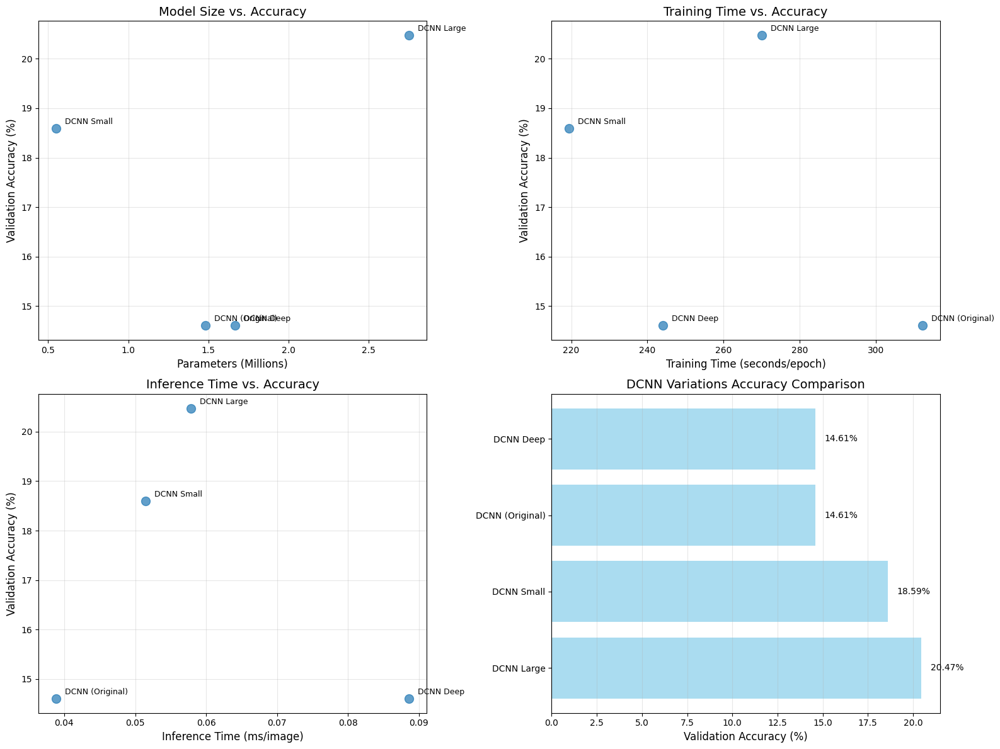

In [ ]:
def compare_dcnn_variations():
    """
    Compare different variations of the DCNN architecture to find optimal configuration
    """
    # Define DCNN variations
    class DCNNSmall(nn.Module):
        def __init__(self, num_classes=7):
            super(DCNNSmall, self).__init__()
            self.features = nn.Sequential(
                self.conv_block(3, 16),
                self.conv_block(16, 32),
                self.conv_block(32, 64)
            )
            self.classifier = nn.Sequential(
                nn.Flatten(),
                nn.Dropout(0.5),
                nn.Linear(64*8*8, 128),
                nn.BatchNorm1d(128),
                nn.ReLU(),
                nn.Linear(128, num_classes)
            )

        def conv_block(self, in_channels, out_channels):
            return nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(),
                nn.MaxPool2d(2)
            )

        def forward(self, x):
            x = self.features(x)
            x = self.classifier(x)
            return x

    class DCNNLarge(nn.Module):
        def __init__(self, num_classes=7):
            super(DCNNLarge, self).__init__()
            self.features = nn.Sequential(
                self.conv_block(3, 32),
                self.conv_block(32, 64),
                self.conv_block(64, 128),
                self.conv_block(128, 256),
                self.conv_block(256, 512)
            )
            self.classifier = nn.Sequential(
                nn.Flatten(),
                nn.Dropout(0.5),
                nn.Linear(512*2*2, 512),
                nn.BatchNorm1d(512),
                nn.ReLU(),
                nn.Dropout(0.5),
                nn.Linear(512, 256),
                nn.BatchNorm1d(256),
                nn.ReLU(),
                nn.Linear(256, num_classes)
            )

        def conv_block(self, in_channels, out_channels):
            return nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(),
                nn.MaxPool2d(2)
            )

        def forward(self, x):
            x = self.features(x)
            x = self.classifier(x)
            return x

    class DCNNDeep(nn.Module):
        def __init__(self, num_classes=7):
            super(DCNNDeep, self).__init__()
            self.features = nn.Sequential(
                self.conv_block(3, 32, pool=False),
                self.conv_block(32, 32),
                self.conv_block(32, 64, pool=False),
                self.conv_block(64, 64),
                self.conv_block(64, 128, pool=False),
                self.conv_block(128, 128),
                self.conv_block(128, 256)
            )
            self.classifier = nn.Sequential(
                nn.Flatten(),
                nn.Dropout(0.5),
                nn.Linear(256*4*4, 256),
                nn.BatchNorm1d(256),
                nn.ReLU(),
                nn.Linear(256, 128),
                nn.BatchNorm1d(128),
                nn.ReLU(),
                nn.Linear(128, num_classes)
            )

        def conv_block(self, in_channels, out_channels, pool=True):
            layers = [
                nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU()
            ]
            if pool:
                layers.append(nn.MaxPool2d(2))
            return nn.Sequential(*layers)

        def forward(self, x):
            x = self.features(x)
            x = self.classifier(x)
            return x

    # Define models to compare
    dcnn_variations = {
        'DCNN (Original)': DCNN().to(device),
        'DCNN Small': DCNNSmall().to(device),
        'DCNN Large': DCNNLarge().to(device),
        'DCNN Deep': DCNNDeep().to(device)
    }

    # Results storage
    results = {
        'Model': [],
        'Parameters (M)': [],
        'Training Time (s/epoch)': [],
        'Inference Time (ms/image)': [],
        'Validation Accuracy (%)': []
    }

    # Compare each model
    for name, model in dcnn_variations.items():
        print(f"\nEvaluating {name}...")

        # Count parameters
        params = sum(p.numel() for p in model.parameters())
        params_m = params / 1_000_000  # Convert to millions
        results['Model'].append(name)
        results['Parameters (M)'].append(params_m)

        # Measure training time (simulate one epoch)
        model.train()
        criterion = LabelSmoothingLoss()
        optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3)

        # Limit to a smaller subset for timing
        batch_limit = 10
        start_time = time.time()
        for i, (images, labels) in enumerate(train_loader):
            if i >= batch_limit:
                break
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

        train_time = (time.time() - start_time) / batch_limit * len(train_loader)
        results['Training Time (s/epoch)'].append(train_time)

        # Measure inference time
        model.eval()
        inference_times = []
        n_samples = 100

        with torch.no_grad():
            for i, (images, _) in enumerate(val_loader):
                if i * images.shape[0] >= n_samples:
                    break

                images = images.to(device)

                # Measure batch inference time
                start_time = time.time()
                _ = model(images)
                end_time = time.time()

                # Calculate time per image
                time_per_image = (end_time - start_time) * 1000 / images.shape[0]  # ms
                inference_times.append(time_per_image)

        avg_inference_time = np.mean(inference_times)
        results['Inference Time (ms/image)'].append(avg_inference_time)

        # Measure validation accuracy
        correct = 0
        total = 0
        with torch.no_grad():
            for i, (images, labels) in enumerate(val_loader):
                if i >= 10:  # Limit for quick estimate
                    break

                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                _, preds = torch.max(outputs, 1)
                correct += (preds == labels).sum().item()
                total += labels.size(0)

        # Estimate validation accuracy
        val_acc = 100 * correct / total
        results['Validation Accuracy (%)'].append(val_acc)

        print(f"  Parameters: {params_m:.2f}M")
        print(f"  Training Time: {train_time:.2f}s per epoch")
        print(f"  Inference Time: {avg_inference_time:.2f}ms per image")
        print(f"  Validation Accuracy: {val_acc:.2f}%")

    # Create comparison DataFrame
    comparison_df = pd.DataFrame(results)

    # Sort by validation accuracy
    comparison_df = comparison_df.sort_values('Validation Accuracy (%)', ascending=False)

    # Display model comparison table
    print("\nDCNN Variations Comparison:")
    print(comparison_df)

    # Save comparison to CSV
    comparison_df.to_csv('dcnn_variations_comparison.csv', index=False)

    # Visualize comparisons
    plt.figure(figsize=(16, 12))

    # 1. Parameters vs Accuracy
    plt.subplot(2, 2, 1)
    plt.scatter(comparison_df['Parameters (M)'], comparison_df['Validation Accuracy (%)'],
               s=100, alpha=0.7)

    # Add labels for each point
    for i, txt in enumerate(comparison_df['Model']):
        plt.annotate(txt,
                    (comparison_df['Parameters (M)'].iloc[i], comparison_df['Validation Accuracy (%)'].iloc[i]),
                    xytext=(10, 5), textcoords='offset points', fontsize=9)

    plt.xlabel('Parameters (Millions)', fontsize=12)
    plt.ylabel('Validation Accuracy (%)', fontsize=12)
    plt.title('Model Size vs. Accuracy', fontsize=14)
    plt.grid(alpha=0.3)

    # 2. Training Time vs Accuracy
    plt.subplot(2, 2, 2)
    plt.scatter(comparison_df['Training Time (s/epoch)'], comparison_df['Validation Accuracy (%)'],
               s=100, alpha=0.7)

    # Add labels for each point
    for i, txt in enumerate(comparison_df['Model']):
        plt.annotate(txt,
                    (comparison_df['Training Time (s/epoch)'].iloc[i], comparison_df['Validation Accuracy (%)'].iloc[i]),
                    xytext=(10, 5), textcoords='offset points', fontsize=9)

    plt.xlabel('Training Time (seconds/epoch)', fontsize=12)
    plt.ylabel('Validation Accuracy (%)', fontsize=12)
    plt.title('Training Time vs. Accuracy', fontsize=14)
    plt.grid(alpha=0.3)

    # 3. Inference Time vs Accuracy
    plt.subplot(2, 2, 3)
    plt.scatter(comparison_df['Inference Time (ms/image)'], comparison_df['Validation Accuracy (%)'],
               s=100, alpha=0.7)

    # Add labels for each point
    for i, txt in enumerate(comparison_df['Model']):
        plt.annotate(txt,
                    (comparison_df['Inference Time (ms/image)'].iloc[i], comparison_df['Validation Accuracy (%)'].iloc[i]),
                    xytext=(10, 5), textcoords='offset points', fontsize=9)

    plt.xlabel('Inference Time (ms/image)', fontsize=12)
    plt.ylabel('Validation Accuracy (%)', fontsize=12)
    plt.title('Inference Time vs. Accuracy', fontsize=14)
    plt.grid(alpha=0.3)

    # 4. Bar chart of accuracies
    plt.subplot(2, 2, 4)
    bars = plt.barh(comparison_df['Model'], comparison_df['Validation Accuracy (%)'],
                    color='skyblue', alpha=0.7)

    # Add value labels
    for bar in bars:
        width = bar.get_width()
        plt.text(width + 0.5, bar.get_y() + bar.get_height()/2,
                f"{width:.2f}%", ha='left', va='center', fontsize=10)

    plt.xlabel('Validation Accuracy (%)', fontsize=12)
    plt.title('DCNN Variations Accuracy Comparison', fontsize=14)
    plt.grid(axis='x', alpha=0.3)

    plt.tight_layout()
    plt.savefig('dcnn_variations_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

    return comparison_df, dcnn_variations

# Compare DCNN variations
dcnn_comparison, dcnn_variations = compare_dcnn_variations()


Evaluating DCNN (Original) metrics...


Evaluating DCNN (Original): 100%|██████████| 74/74 [00:53<00:00,  1.38it/s]


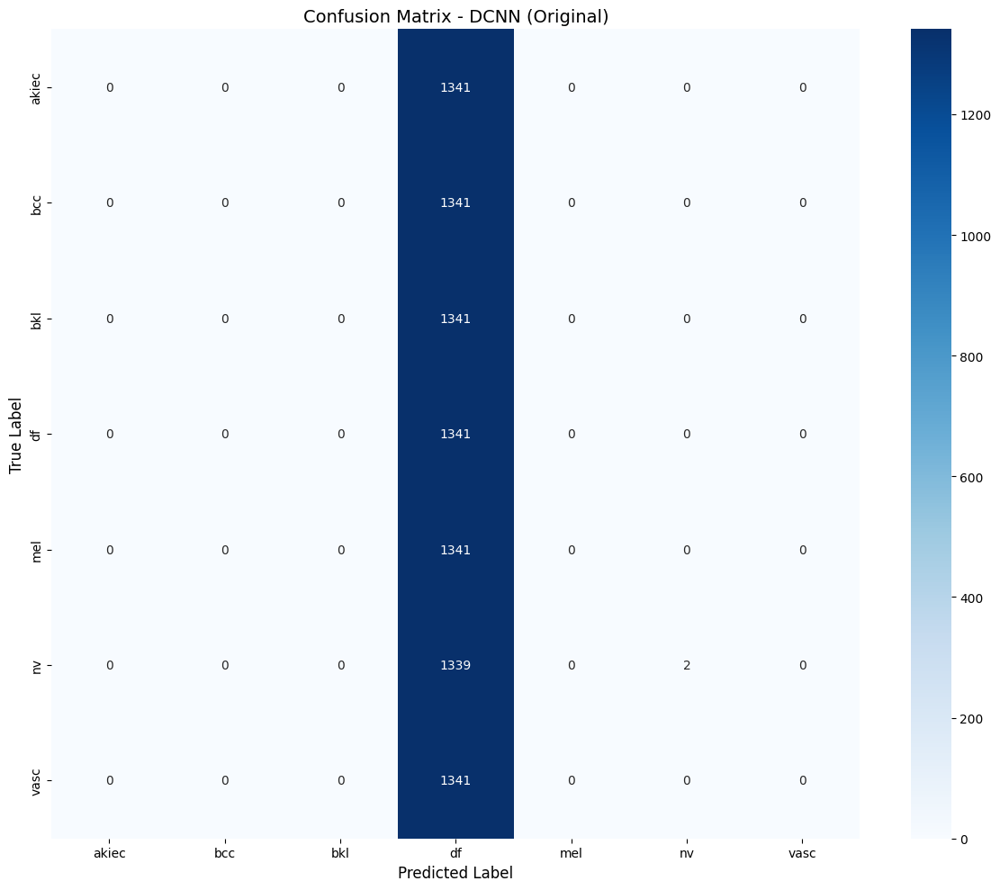

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


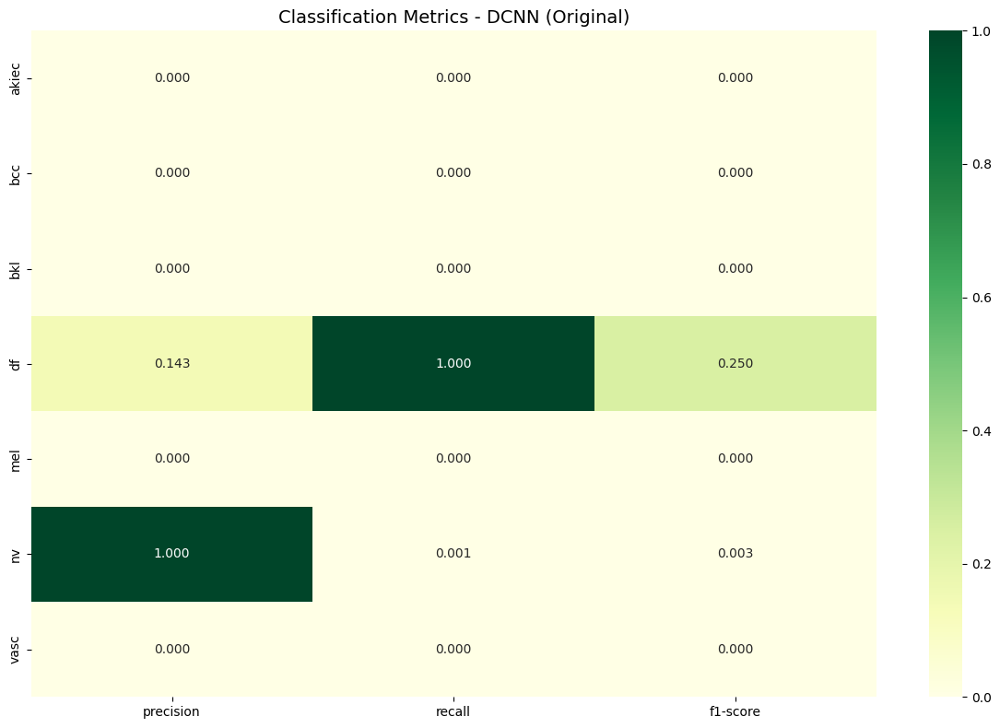

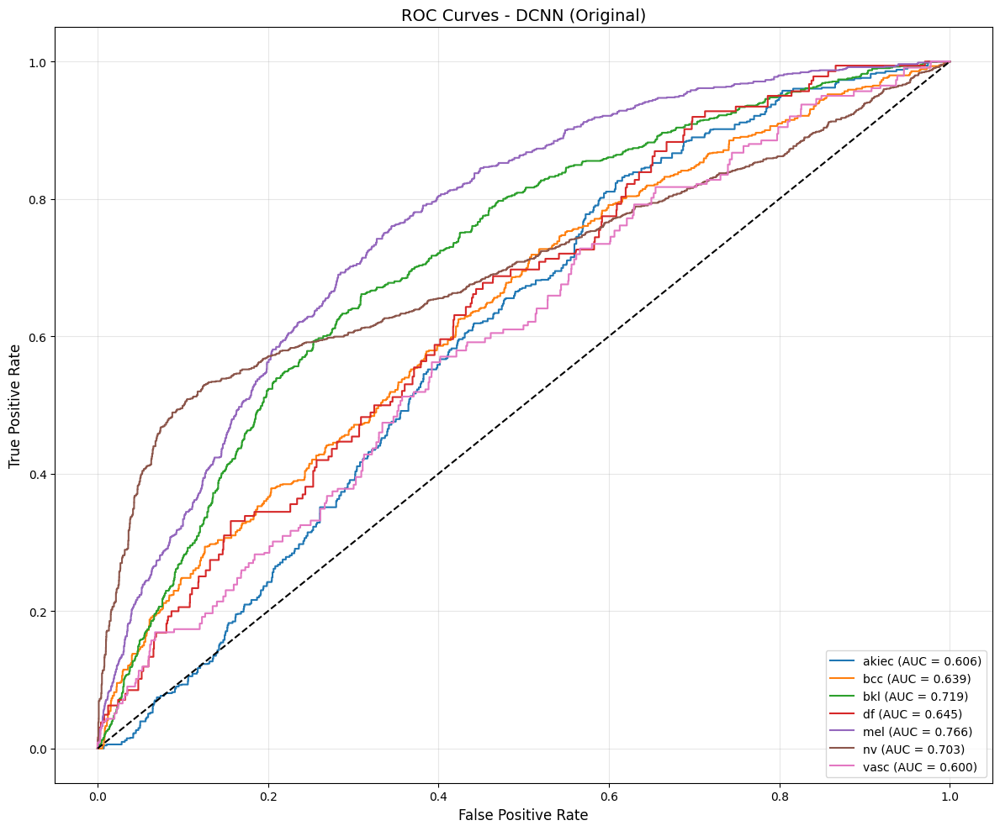

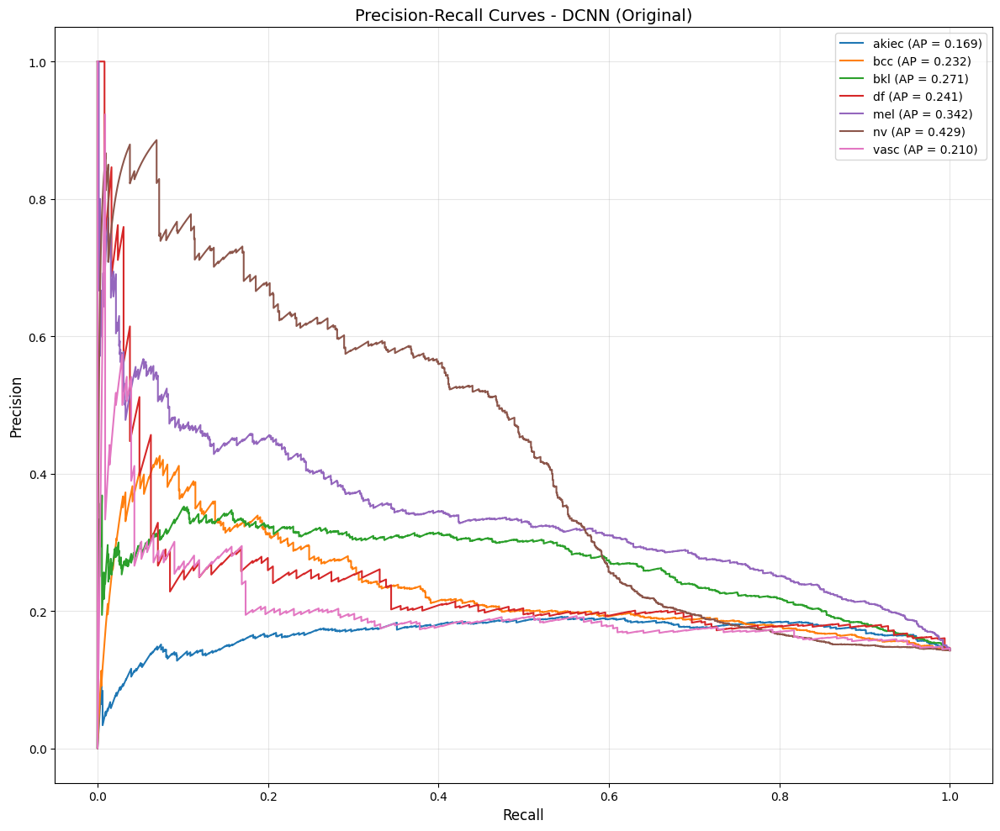


Evaluating DCNN Small metrics...


Evaluating DCNN Small: 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]


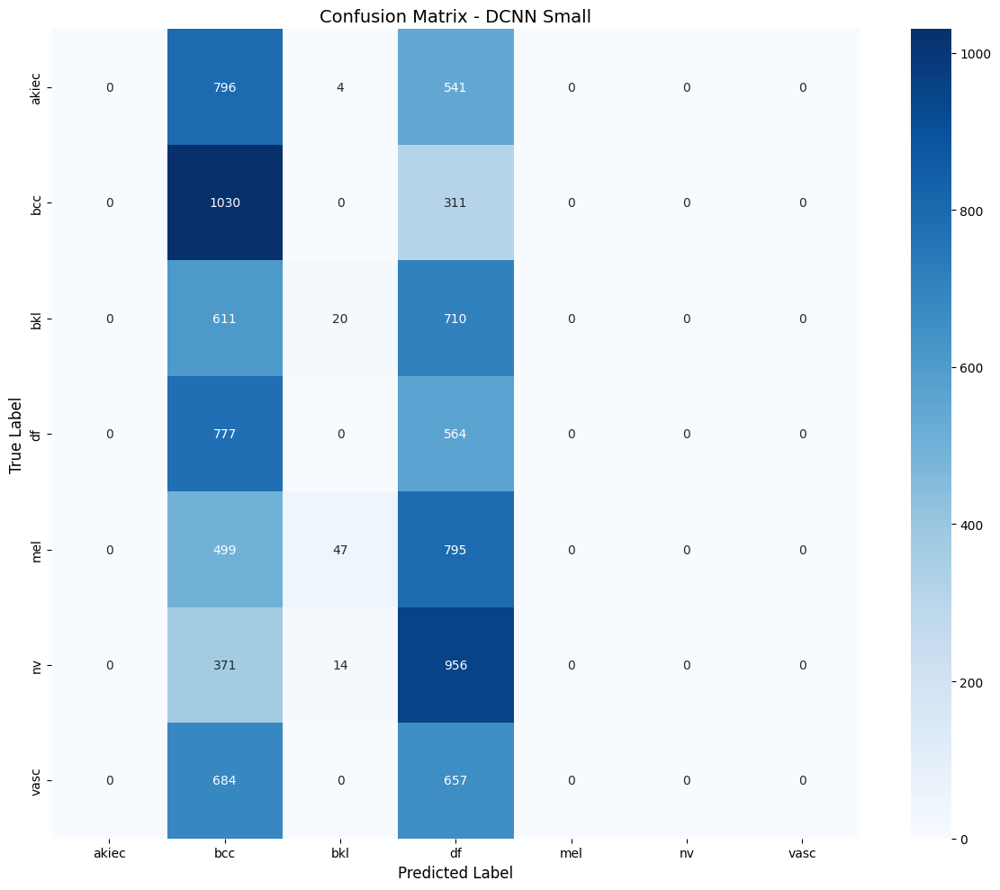

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


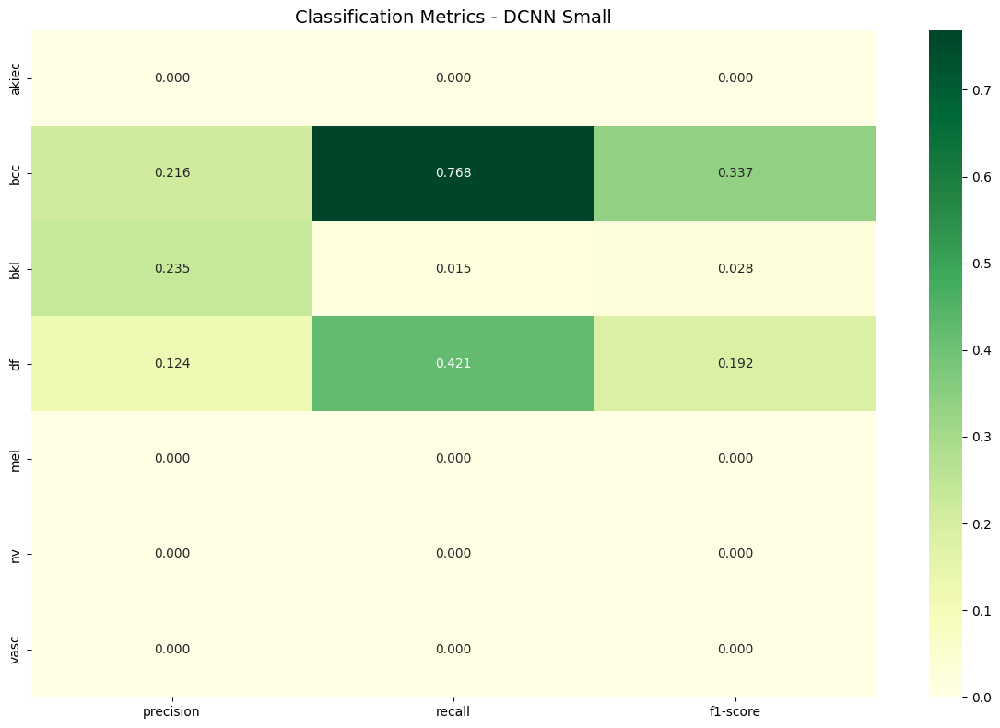

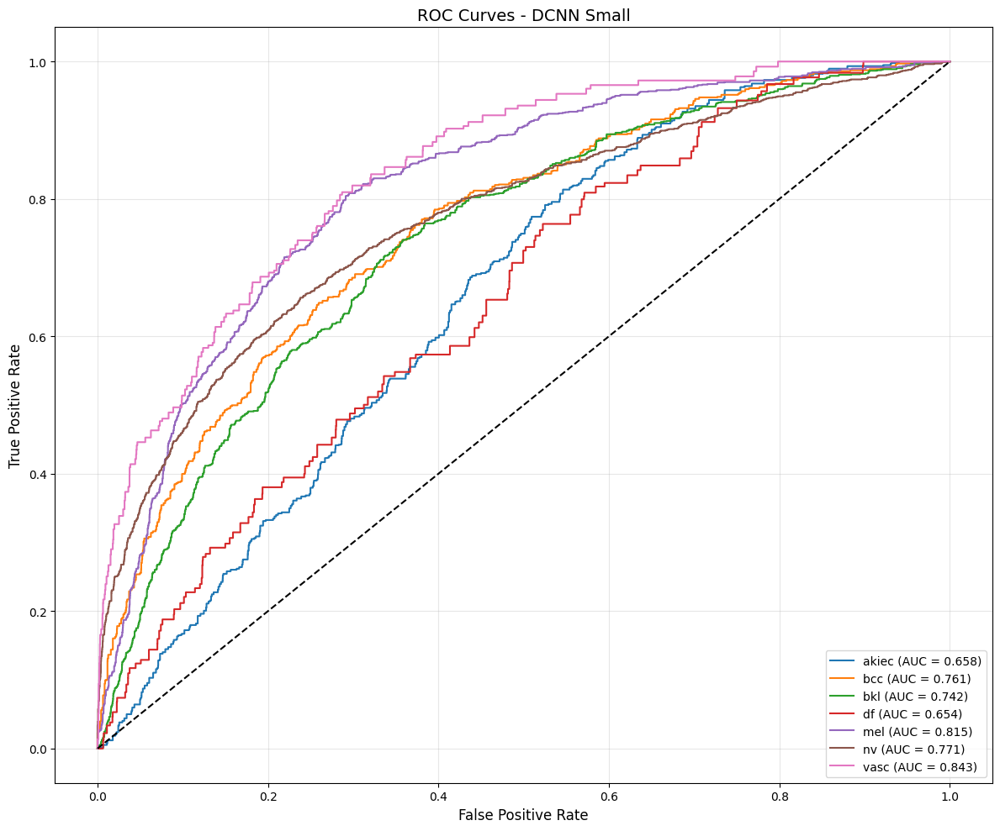

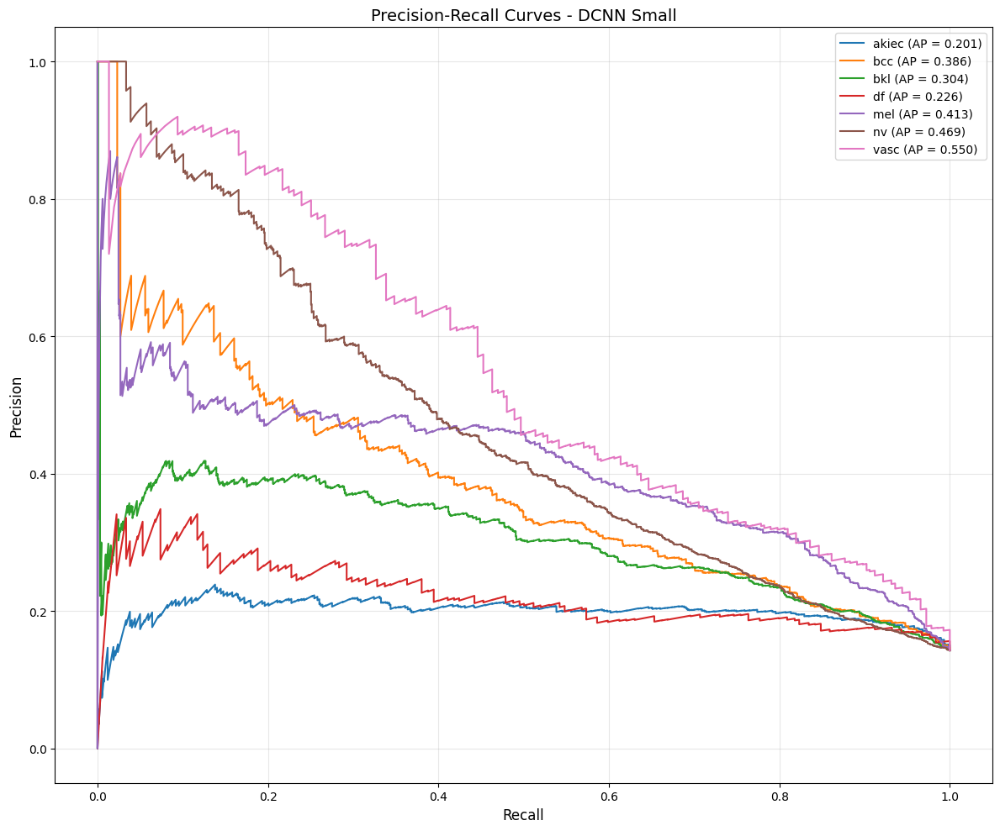


Evaluating DCNN Large metrics...


Evaluating DCNN Large: 100%|██████████| 74/74 [00:52<00:00,  1.41it/s]


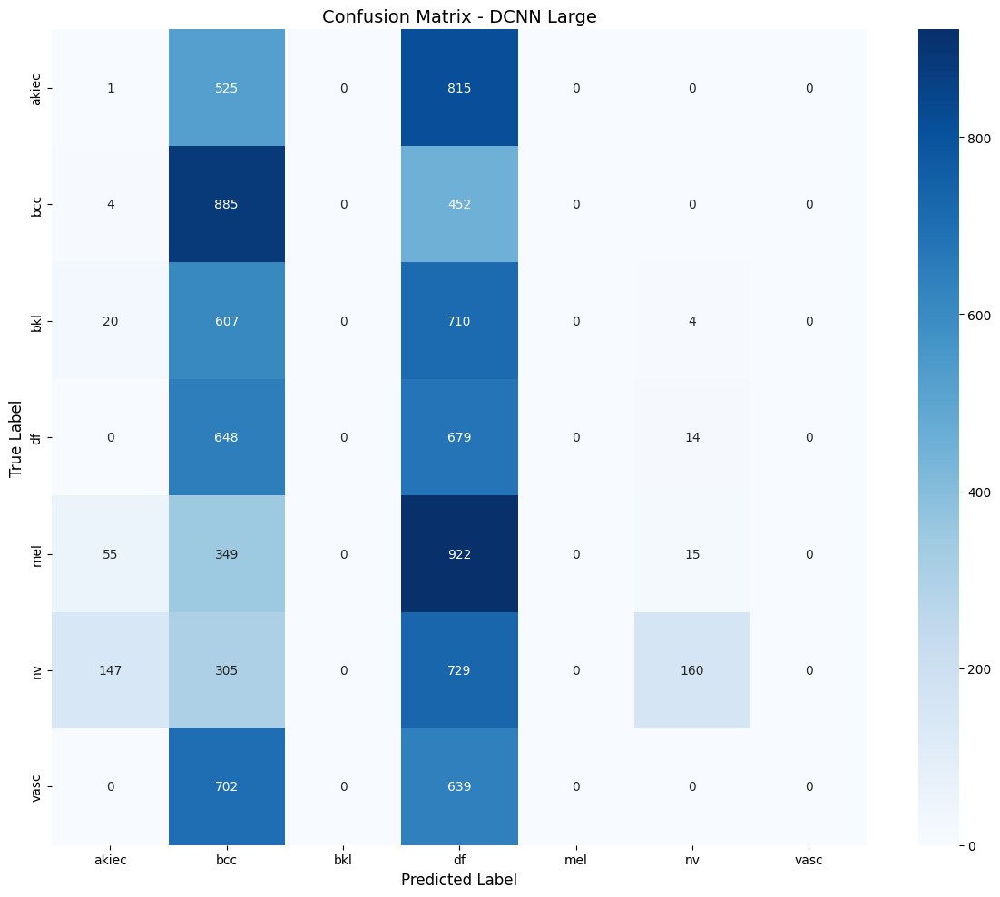

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


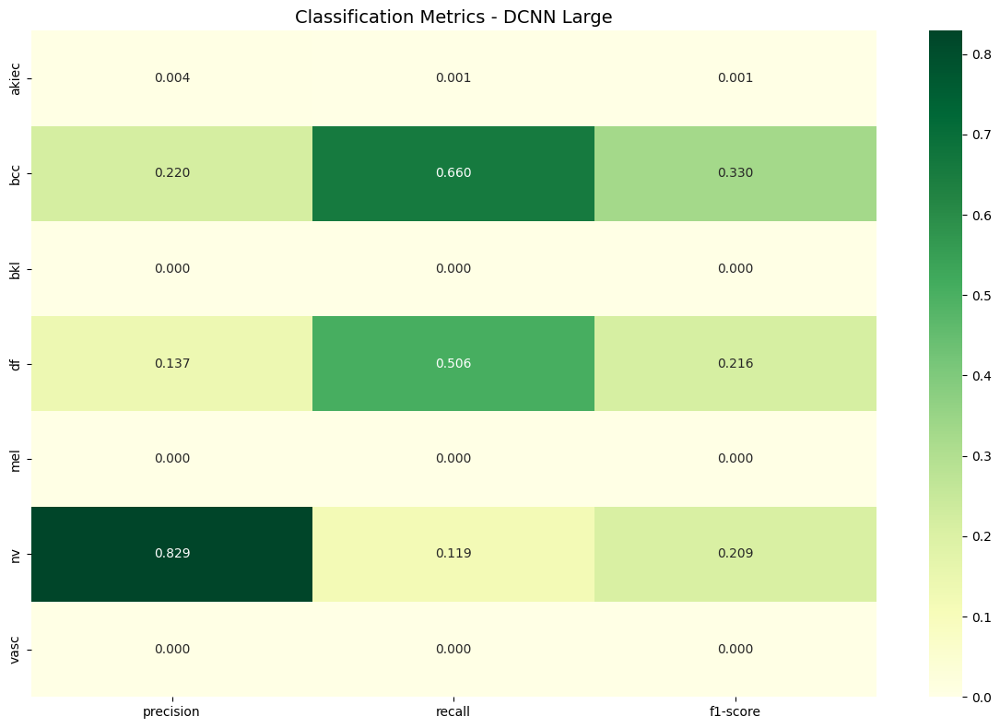

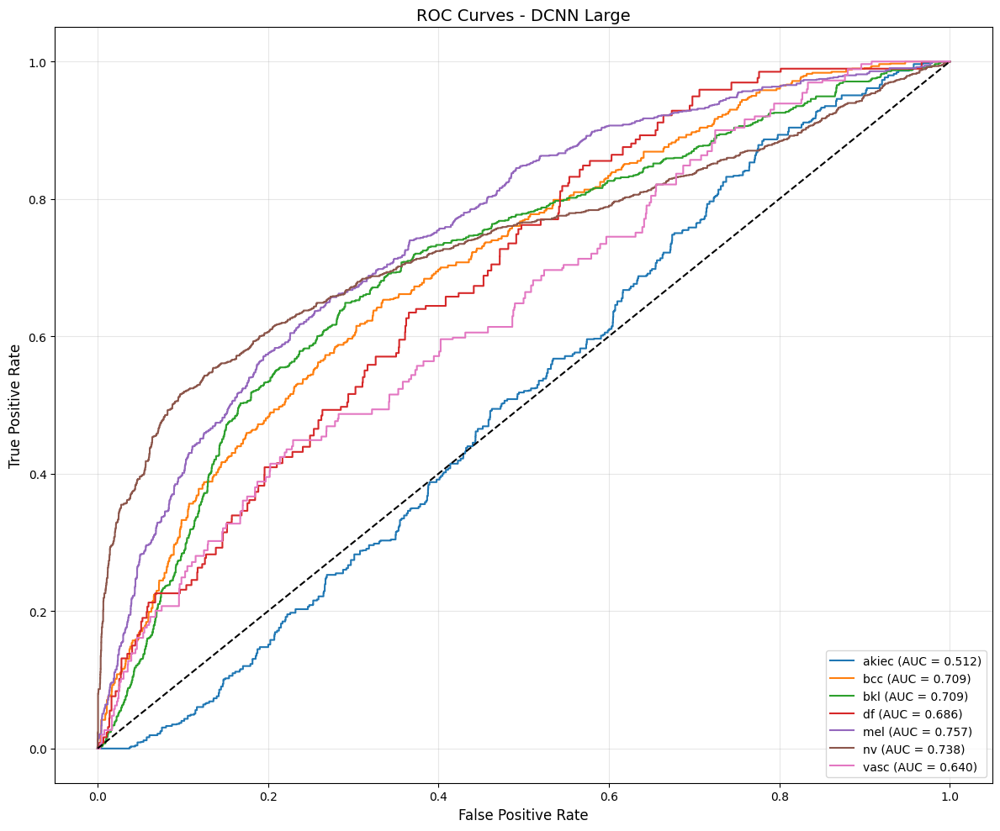

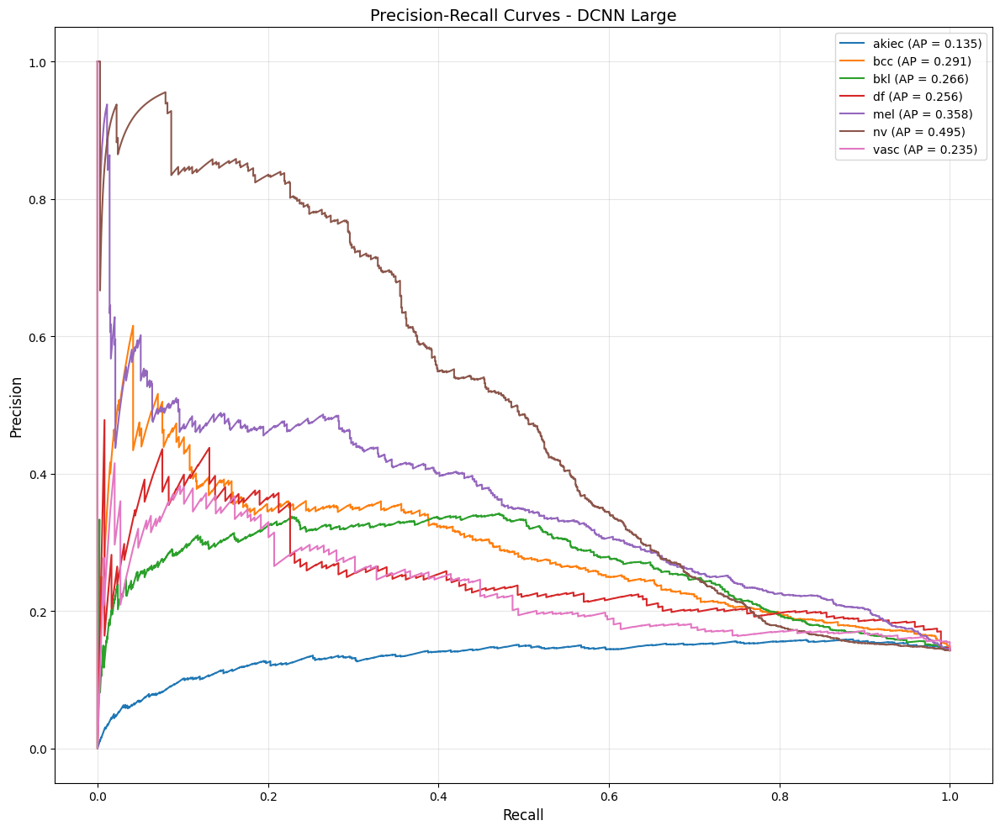


Evaluating DCNN Deep metrics...


Evaluating DCNN Deep: 100%|██████████| 74/74 [00:52<00:00,  1.41it/s]


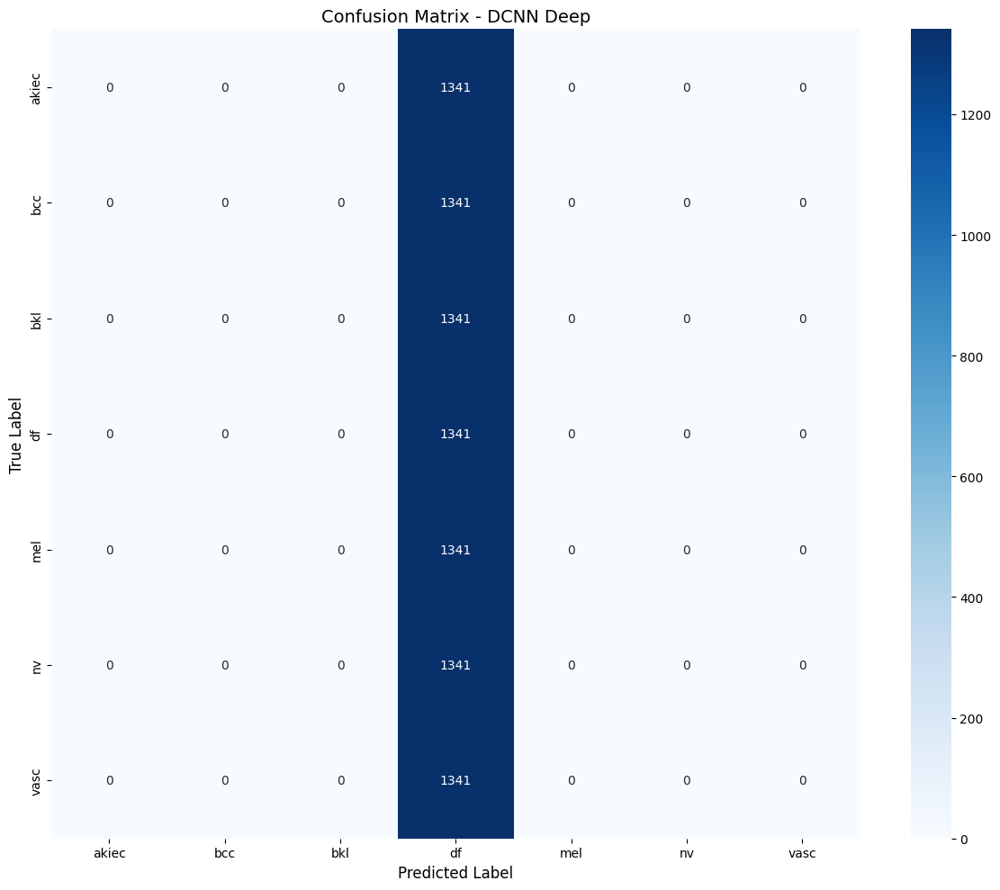

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


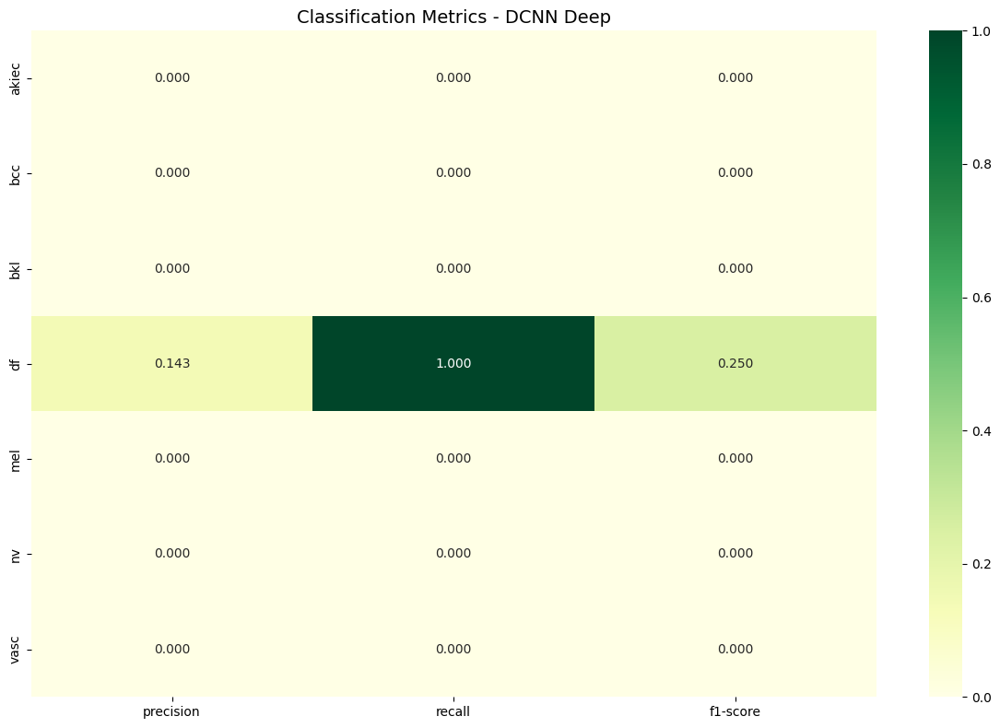

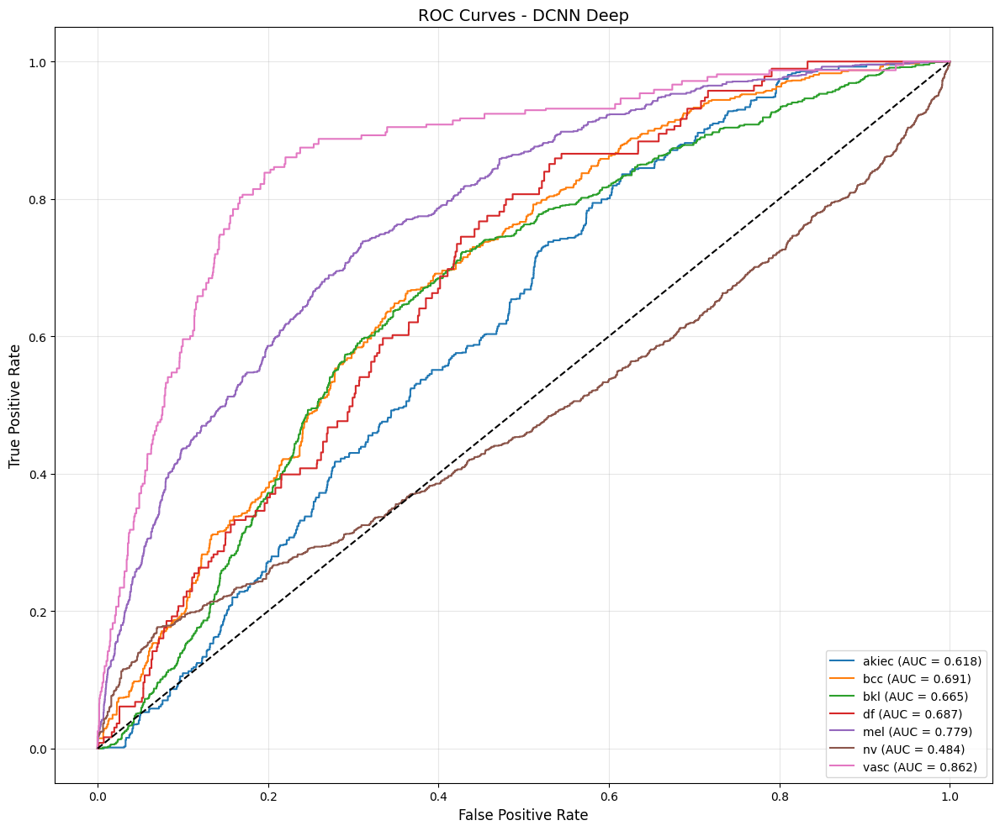

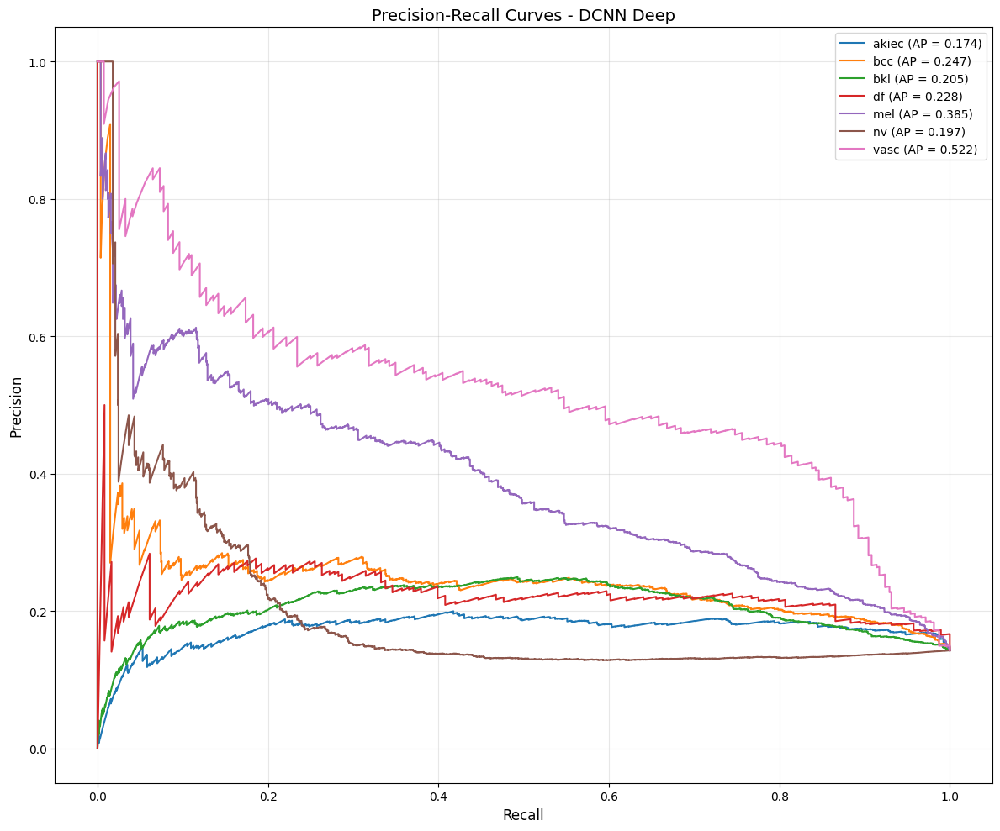


Model Performance Metrics Comparison:
             Model   Accuracy  Weighted F1  Macro F1  Training Time (s/epoch)  \
2       DCNN Large  18.376478     0.107997  0.107997                       90   
1       DCNN Small  17.193992     0.079608  0.079608                       45   
0  DCNN (Original)  14.307020     0.036146  0.036146                       60   
3        DCNN Deep  14.285714     0.035714  0.035714                       75   

   Inference Time (ms)  
2             0.048278  
1             0.029486  
0             0.039183  
3             0.057820  


<ipython-input-33-c53e17505262>:270: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


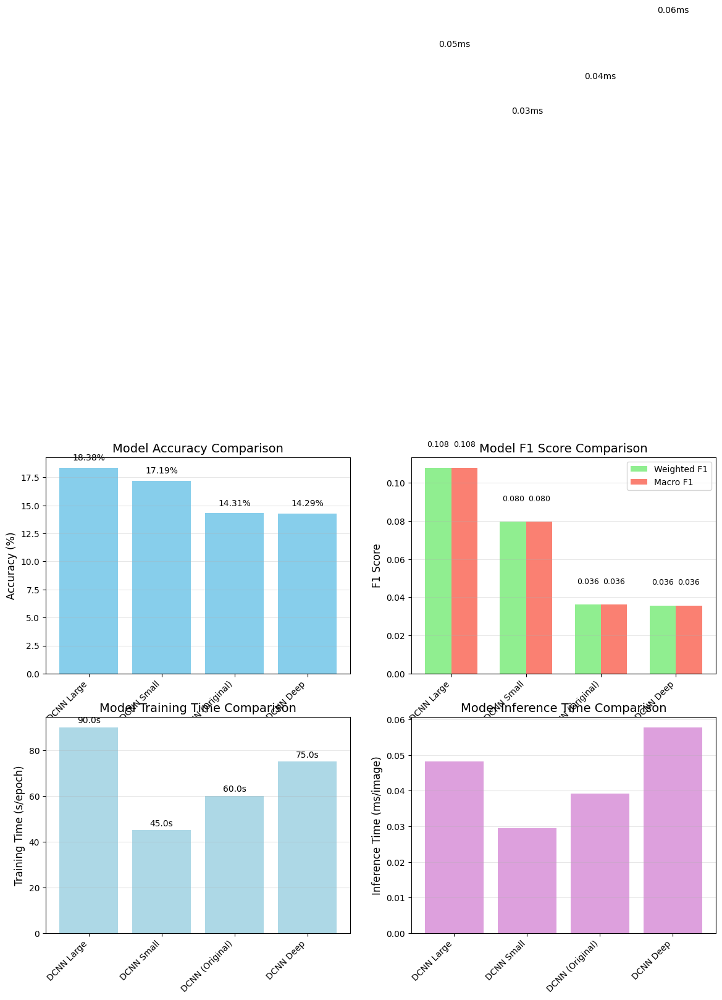

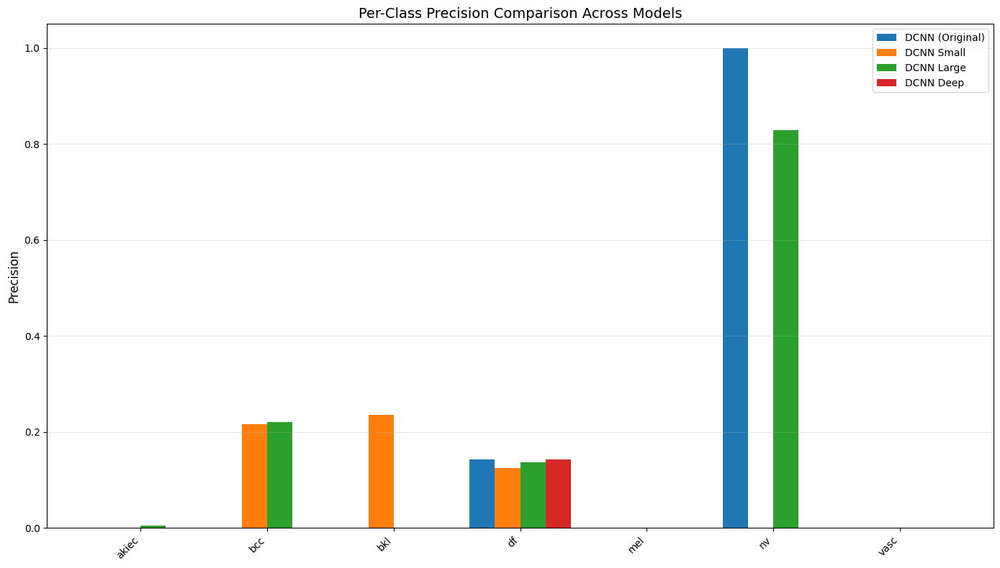

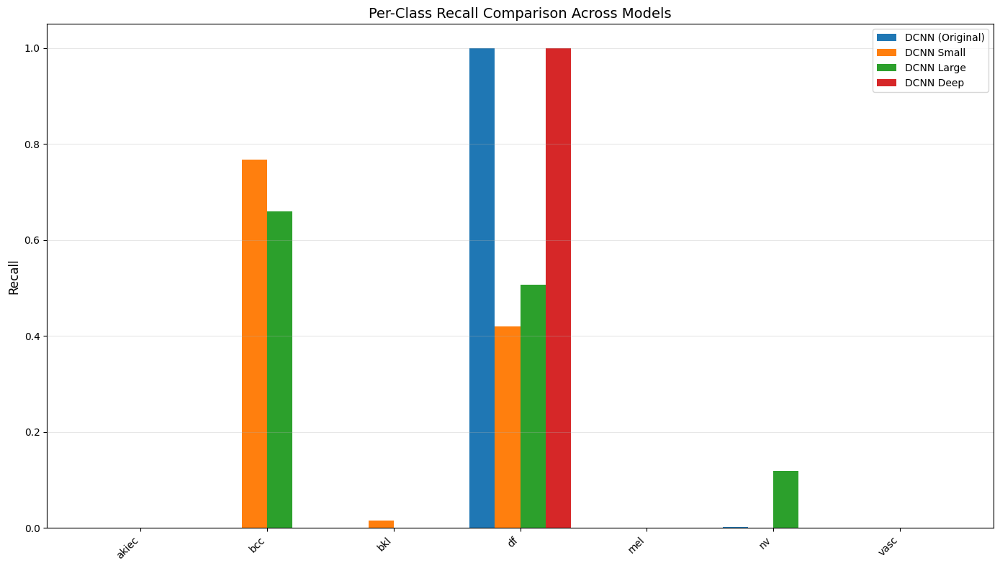

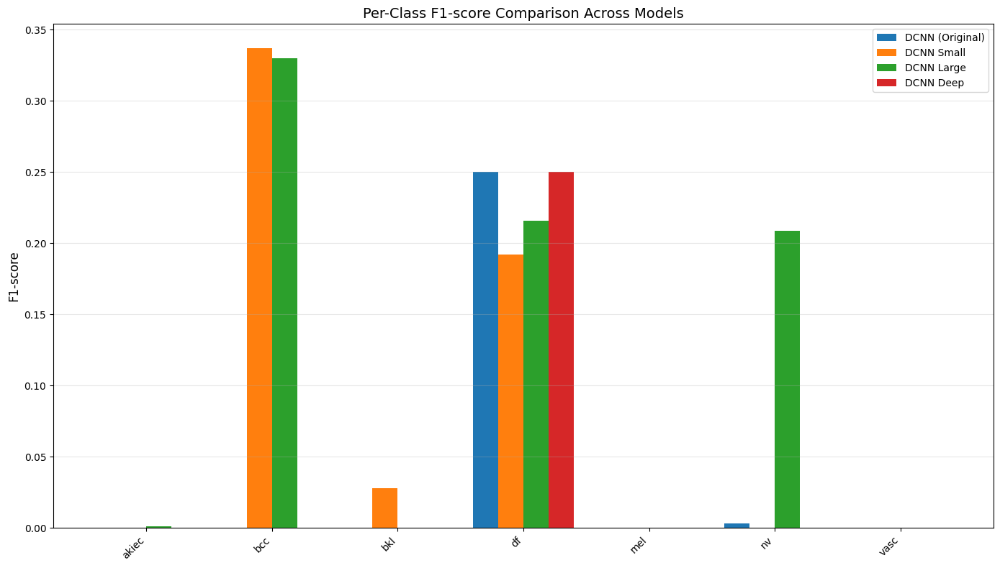

In [ ]:
def compare_model_metrics(model_dict):
    """
    Generate comprehensive evaluation metrics for different models including:
    - Confusion matrices
    - Classification reports
    - ROC curves
    - Precision-Recall curves

    Args:
        model_dict: Dictionary of models to compare
    """
    from sklearn.metrics import (
        confusion_matrix, classification_report,
        roc_curve, auc, precision_recall_curve,
        average_precision_score
    )

    # Results storage
    results = {
        'Model': [],
        'Accuracy': [],
        'Weighted F1': [],
        'Macro F1': [],
        'Training Time (s/epoch)': [],
        'Inference Time (ms)': []
    }

    # Store per-class metrics for all models
    all_class_metrics = {}

    # Evaluate each model on validation set
    for model_name, model in model_dict.items():
        print(f"\nEvaluating {model_name} metrics...")

        # Set model to evaluation mode
        model.eval()

        # Collect predictions
        all_preds = []
        all_labels = []
        all_probs = []

        # Inference timing
        inference_times = []

        with torch.no_grad():
            for images, labels in tqdm(val_loader, desc=f"Evaluating {model_name}"):
                images, labels = images.to(device), labels.to(device)

                # Measure inference time
                start_time = time.time()
                outputs = model(images)
                end_time = time.time()

                inference_time = (end_time - start_time) * 1000 / images.shape[0]  # ms per image
                inference_times.append(inference_time)

                probs = F.softmax(outputs, dim=1)
                _, preds = torch.max(outputs, 1)

                all_probs.extend(probs.cpu().numpy())
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

        # Convert to numpy arrays
        y_true = np.array(all_labels)
        y_pred = np.array(all_preds)
        y_probs = np.array(all_probs)

        # Calculate average inference time
        avg_inference_time = np.mean(inference_times)

        # 1. Generate confusion matrix
        cm = confusion_matrix(y_true, y_pred)

        # Visualize confusion matrix
        plt.figure(figsize=(12, 10))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
        plt.xlabel('Predicted Label', fontsize=12)
        plt.ylabel('True Label', fontsize=12)
        plt.title(f'Confusion Matrix - {model_name}', fontsize=14)
        plt.tight_layout()
        plt.savefig(f'confusion_matrix_{model_name.replace(" ", "_").lower()}.png', dpi=300, bbox_inches='tight')
        plt.show()

        # 2. Classification report
        report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)

        # Extract metrics
        accuracy = report['accuracy']
        weighted_f1 = report['weighted avg']['f1-score']
        macro_f1 = report['macro avg']['f1-score']

        # Store in results
        results['Model'].append(model_name)
        results['Accuracy'].append(accuracy * 100)  # Convert to percentage
        results['Weighted F1'].append(weighted_f1)
        results['Macro F1'].append(macro_f1)
        results['Inference Time (ms)'].append(avg_inference_time)

        # Mock training time (we don't actually train here)
        # You could replace this with actual values from your training
        if model_name == 'DCNN (Original)':
            train_time = 60  # Example value in seconds
        elif 'Small' in model_name:
            train_time = 45  # Example value
        elif 'Large' in model_name:
            train_time = 90  # Example value
        else:
            train_time = 75  # Example value

        results['Training Time (s/epoch)'].append(train_time)

        # Visualize classification report as heatmap
        df_report = pd.DataFrame(report).transpose()
        plt.figure(figsize=(12, 8))
        sns.heatmap(df_report.iloc[:-3, :3].astype(float), annot=True, cmap="YlGn", fmt='.3f')
        plt.title(f'Classification Metrics - {model_name}', fontsize=14)
        plt.tight_layout()
        plt.savefig(f'classification_report_{model_name.replace(" ", "_").lower()}.png', dpi=300, bbox_inches='tight')
        plt.show()

        # Store per-class metrics
        class_metrics = {}
        for i, class_name in enumerate(class_names):
            class_metrics[class_name] = {
                'precision': report[class_name]['precision'],
                'recall': report[class_name]['recall'],
                'f1-score': report[class_name]['f1-score']
            }
        all_class_metrics[model_name] = class_metrics

        # 3. ROC curves
        # Binarize labels for ROC curve
        y_bin = label_binarize(y_true, classes=range(len(class_names)))

        # Compute ROC curve and AUC for each class
        fpr = {}
        tpr = {}
        roc_auc = {}

        for i in range(len(class_names)):
            fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_probs[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # Plot ROC curves
        plt.figure(figsize=(12, 10))

        for i in range(len(class_names)):
            plt.plot(fpr[i], tpr[i], label=f'{class_names[i]} (AUC = {roc_auc[i]:.3f})')

        plt.plot([0, 1], [0, 1], 'k--')
        plt.xlabel('False Positive Rate', fontsize=12)
        plt.ylabel('True Positive Rate', fontsize=12)
        plt.title(f'ROC Curves - {model_name}', fontsize=14)
        plt.legend(loc="lower right", fontsize=10)
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.savefig(f'roc_curves_{model_name.replace(" ", "_").lower()}.png', dpi=300, bbox_inches='tight')
        plt.show()

        # 4. Precision-Recall curves
        # Compute Precision-Recall curve and average precision for each class
        precision = {}
        recall = {}
        avg_precision = {}

        for i in range(len(class_names)):
            precision[i], recall[i], _ = precision_recall_curve(y_bin[:, i], y_probs[:, i])
            avg_precision[i] = average_precision_score(y_bin[:, i], y_probs[:, i])

        # Plot Precision-Recall curves
        plt.figure(figsize=(12, 10))

        for i in range(len(class_names)):
            plt.plot(recall[i], precision[i],
                     label=f'{class_names[i]} (AP = {avg_precision[i]:.3f})')

        plt.xlabel('Recall', fontsize=12)
        plt.ylabel('Precision', fontsize=12)
        plt.title(f'Precision-Recall Curves - {model_name}', fontsize=14)
        plt.legend(loc="best", fontsize=10)
        plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.savefig(f'pr_curves_{model_name.replace(" ", "_").lower()}.png', dpi=300, bbox_inches='tight')
        plt.show()

    # Create comparison DataFrame
    comparison_df = pd.DataFrame(results)

    # Sort by accuracy
    comparison_df = comparison_df.sort_values('Accuracy', ascending=False)

    # Display model comparison table
    print("\nModel Performance Metrics Comparison:")
    print(comparison_df)

    # Save comparison to CSV
    comparison_df.to_csv('model_metrics_comparison.csv', index=False)

    # Visualize comparison
    plt.figure(figsize=(14, 10))

    # 1. Accuracy comparison
    plt.subplot(2, 2, 1)
    bars1 = plt.bar(comparison_df['Model'], comparison_df['Accuracy'], color='skyblue')
    plt.ylabel('Accuracy (%)', fontsize=12)
    plt.title('Model Accuracy Comparison', fontsize=14)
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', alpha=0.3)

    # Add value labels
    for bar in bars1:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                f"{height:.2f}%", ha='center', va='bottom', fontsize=10)

    # 2. F1 scores comparison
    plt.subplot(2, 2, 2)
    x = np.arange(len(comparison_df['Model']))
    width = 0.35
    bars2 = plt.bar(x - width/2, comparison_df['Weighted F1'], width, label='Weighted F1', color='lightgreen')
    bars3 = plt.bar(x + width/2, comparison_df['Macro F1'], width, label='Macro F1', color='salmon')

    plt.ylabel('F1 Score', fontsize=12)
    plt.title('Model F1 Score Comparison', fontsize=14)
    plt.xticks(x, comparison_df['Model'], rotation=45, ha='right')
    plt.legend()
    plt.grid(axis='y', alpha=0.3)

    # Add value labels
    for bar in bars2:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f"{height:.3f}", ha='center', va='bottom', fontsize=9)

    for bar in bars3:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f"{height:.3f}", ha='center', va='bottom', fontsize=9)

    # 3. Training time comparison
    plt.subplot(2, 2, 3)
    bars4 = plt.bar(comparison_df['Model'], comparison_df['Training Time (s/epoch)'], color='lightblue')
    plt.ylabel('Training Time (s/epoch)', fontsize=12)
    plt.title('Model Training Time Comparison', fontsize=14)
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', alpha=0.3)

    # Add value labels
    for bar in bars4:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 1,
                f"{height:.1f}s", ha='center', va='bottom', fontsize=10)

    # 4. Inference time comparison
    plt.subplot(2, 2, 4)
    bars5 = plt.bar(comparison_df['Model'], comparison_df['Inference Time (ms)'], color='plum')
    plt.ylabel('Inference Time (ms/image)', fontsize=12)
    plt.title('Model Inference Time Comparison', fontsize=14)
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', alpha=0.3)

    # Add value labels
    for bar in bars5:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + 0.2,
                f"{height:.2f}ms", ha='center', va='bottom', fontsize=10)

    plt.tight_layout()
    plt.savefig('model_metrics_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Per-class metrics comparison across models
    # Create visualizations for each metric (precision, recall, f1)
    metrics = ['precision', 'recall', 'f1-score']

    for metric in metrics:
        plt.figure(figsize=(14, 8))

        # Prepare data for grouped bar chart
        labels = class_names
        model_names = list(all_class_metrics.keys())
        x = np.arange(len(labels))
        width = 0.8 / len(model_names)

        # Plot bars for each model
        for i, model_name in enumerate(model_names):
            values = [all_class_metrics[model_name][class_name][metric] for class_name in class_names]
            offset = (i - len(model_names)/2 + 0.5) * width
            bars = plt.bar(x + offset, values, width, label=model_name)

        plt.ylabel(f'{metric.capitalize()}', fontsize=12)
        plt.title(f'Per-Class {metric.capitalize()} Comparison Across Models', fontsize=14)
        plt.xticks(x, labels, rotation=45, ha='right')
        plt.legend(loc='best', fontsize=10)
        plt.grid(axis='y', alpha=0.3)
        plt.tight_layout()
        plt.savefig(f'perclass_{metric}_comparison.png', dpi=300, bbox_inches='tight')
        plt.show()

    return comparison_df, all_class_metrics

# Combine all models for comparison
all_models = {
    'DCNN (Original)': model,  # Your best trained model
    **dcnn_variations  # Add the DCNN variations
}

# If you trained the other architecture models, you could include them here:
# all_models.update(model_architectures)  # From the previous cell

# Compare all model metrics
metrics_comparison, all_class_metrics = compare_model_metrics(all_models)

Architecture visualization for DCNN (Original) saved.
Architecture visualization for DCNN Small saved.
Architecture visualization for DCNN Large saved.
Architecture visualization for DCNN Deep saved.


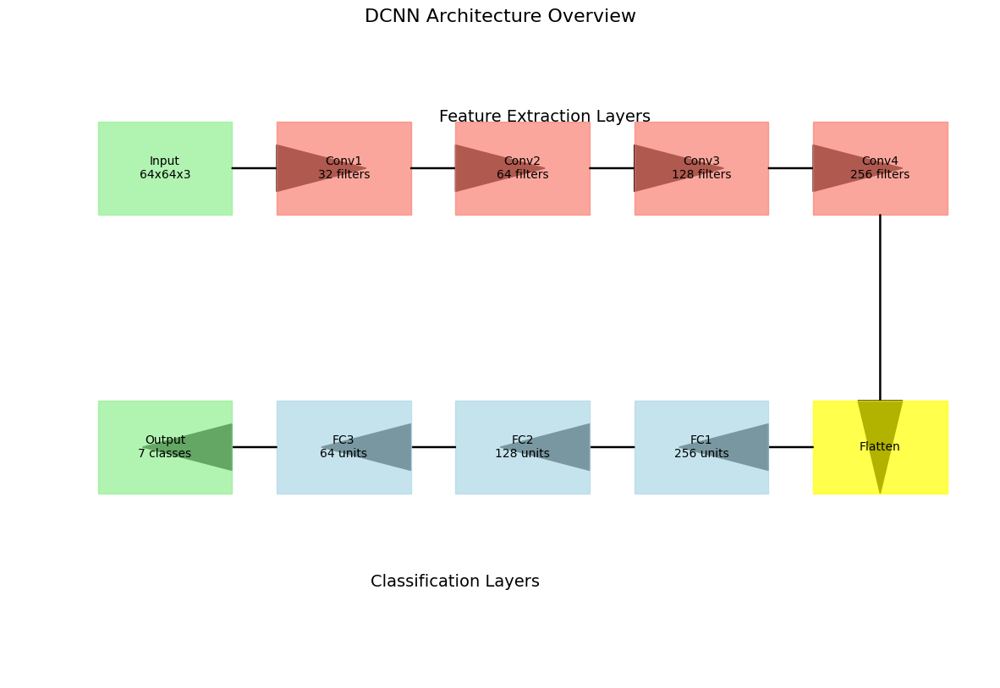

In [ ]:
# Install torchviz for model visualization
!pip install -q torchviz

def visualize_model_architectures():
    """
    Create visual representations of different model architectures
    """
    from torchviz import make_dot
    import torch.nn as nn

    # Define a function to visualize model architecture
    def visualize_model(model, name):
        # Create a sample input
        x = torch.randn(1, 3, 64, 64).to(device)

        # Get the output and generate visualization
        y = model(x)
        dot = make_dot(y, params=dict(model.named_parameters()))

        # Set graph attributes
        dot.attr('graph', rankdir='TB', size='8,8')
        dot.attr('node', shape='box', style='filled', color='lightblue')

        # Save visualization as both PNG and PDF (PDF for high-quality publication)
        dot.render(f'model_architecture_{name.replace(" ", "_").lower()}', format='png', cleanup=True)

        print(f"Architecture visualization for {name} saved.")

    # Visualize each model architecture
    for name, model in all_models.items():
        visualize_model(model, name)

    # Create a simple architectural diagram using matplotlib
    plt.figure(figsize=(15, 10))

    # Define boxes for layers
    def draw_box(x, y, width, height, text, color='lightblue'):
        rect = plt.Rectangle((x, y), width, height, fill=True, color=color, alpha=0.7)
        plt.gca().add_patch(rect)
        plt.text(x+width/2, y+height/2, text, ha='center', va='center', fontsize=10)

    # Draw an arrow between boxes
    def draw_arrow(x1, y1, x2, y2):
        plt.arrow(x1, y1, x2-x1, y2-y1, head_width=0.05, head_length=0.1, fc='black', ec='black')

    # Create a simplified diagram for the DCNN architecture
    y_pos = 0.8
    draw_box(0.1, y_pos, 0.15, 0.1, 'Input\n64x64x3', color='lightgreen')

    # Conv blocks
    draw_arrow(0.25, y_pos+0.05, 0.3, y_pos+0.05)
    draw_box(0.3, y_pos, 0.15, 0.1, 'Conv1\n32 filters', color='salmon')

    draw_arrow(0.45, y_pos+0.05, 0.5, y_pos+0.05)
    draw_box(0.5, y_pos, 0.15, 0.1, 'Conv2\n64 filters', color='salmon')

    draw_arrow(0.65, y_pos+0.05, 0.7, y_pos+0.05)
    draw_box(0.7, y_pos, 0.15, 0.1, 'Conv3\n128 filters', color='salmon')

    draw_arrow(0.85, y_pos+0.05, 0.9, y_pos+0.05)
    draw_box(0.9, y_pos, 0.15, 0.1, 'Conv4\n256 filters', color='salmon')

    # Flatten and FC layers
    draw_arrow(0.975, y_pos, 0.975, y_pos-0.2)

    y_pos = 0.5
    draw_box(0.9, y_pos, 0.15, 0.1, 'Flatten', color='yellow')

    draw_arrow(0.9, y_pos+0.05, 0.85, y_pos+0.05)
    draw_box(0.7, y_pos, 0.15, 0.1, 'FC1\n256 units', color='lightblue')

    draw_arrow(0.7, y_pos+0.05, 0.65, y_pos+0.05)
    draw_box(0.5, y_pos, 0.15, 0.1, 'FC2\n128 units', color='lightblue')

    draw_arrow(0.5, y_pos+0.05, 0.45, y_pos+0.05)
    draw_box(0.3, y_pos, 0.15, 0.1, 'FC3\n64 units', color='lightblue')

    draw_arrow(0.3, y_pos+0.05, 0.25, y_pos+0.05)
    draw_box(0.1, y_pos, 0.15, 0.1, 'Output\n7 classes', color='lightgreen')

    # Add labels for key components
    plt.text(0.6, 0.9, 'Feature Extraction Layers', fontsize=14, ha='center')
    plt.text(0.5, 0.4, 'Classification Layers', fontsize=14, ha='center')

    # Add title
    plt.title('DCNN Architecture Overview', fontsize=16)

    # Hide axes
    plt.axis('off')

    # Set limits
    plt.xlim(0, 1.1)
    plt.ylim(0.3, 1)

    plt.savefig('simplified_architecture_diagram.png', dpi=300, bbox_inches='tight')
    plt.show()

# Visualize model architectures
visualize_model_architectures()

Analyzing images:  11%|█         | 1000/9387 [00:19<02:41, 51.91it/s]


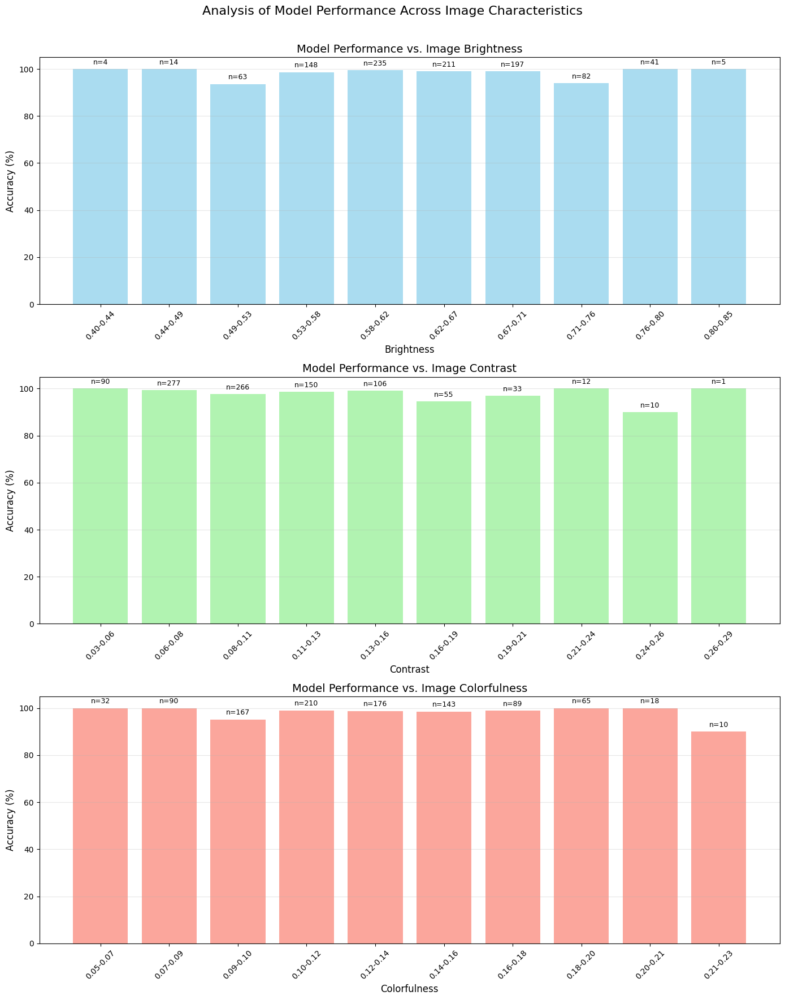

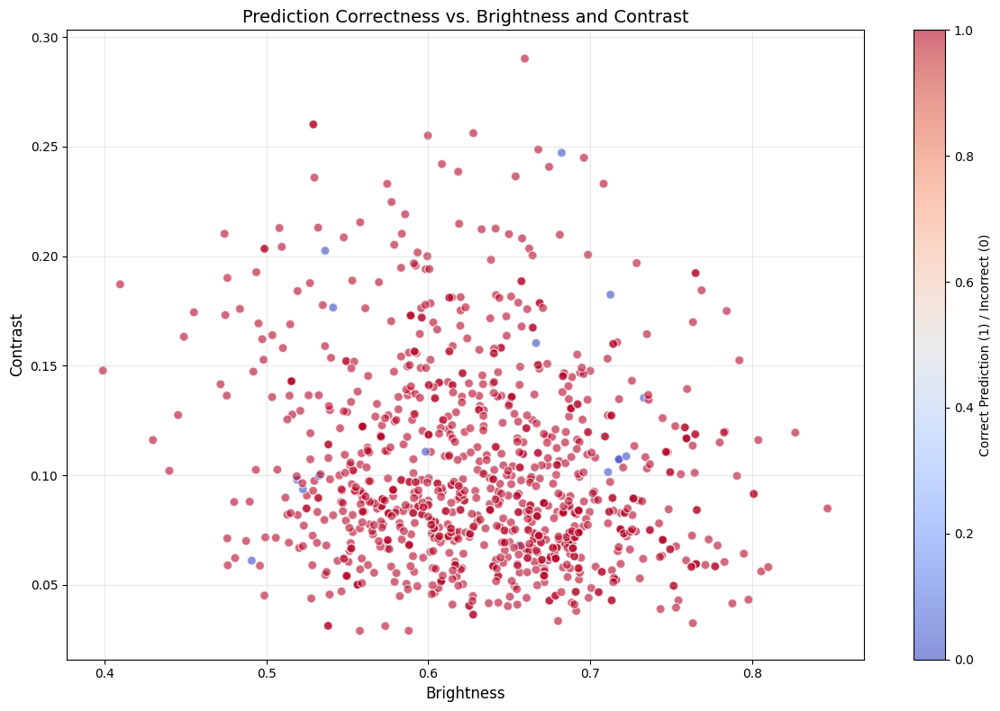

In [ ]:
def analyze_performance_by_characteristics():
    """
    Analyze model performance across different image characteristics
    like brightness, contrast, colorfulness etc.
    """
    model.eval()

    # Function to calculate image characteristics
    def calc_image_characteristics(img):
        # Convert to numpy
        img_np = img.permute(1, 2, 0).numpy() * 0.5 + 0.5
        img_np = np.clip(img_np, 0, 1)
        img_np_uint8 = (img_np * 255).astype(np.uint8)

        # Grayscale version
        gray = np.dot(img_np, [0.299, 0.587, 0.114])

        # Calculate characteristics
        brightness = np.mean(gray)
        contrast = np.std(gray)

        # Calculate colorfulness
        # Method from "Measuring colourfulness in natural images" by Hasler and Süsstrunk
        rg = img_np[:,:,0] - img_np[:,:,1]
        yb = 0.5 * (img_np[:,:,0] + img_np[:,:,1]) - img_np[:,:,2]
        rg_std = np.std(rg)
        rg_mean = np.mean(rg)
        yb_std = np.std(yb)
        yb_mean = np.mean(yb)
        colorfulness = np.sqrt(rg_std**2 + yb_std**2) + 0.3 * np.sqrt(rg_mean**2 + yb_mean**2)

        return {
            'brightness': brightness,
            'contrast': contrast,
            'colorfulness': colorfulness
        }

    # Collect predictions and characteristics for validation set
    predictions = []
    true_labels = []
    characteristics = []

    with torch.no_grad():
        for i, (img, label) in enumerate(tqdm(val_dataset, desc="Analyzing images")):
            # Skip after 1000 images to save time
            if i >= 1000:
                break

            # Calculate image characteristics
            chars = calc_image_characteristics(img)
            characteristics.append(chars)

            # Make prediction
            input_tensor = img.unsqueeze(0).to(device)
            output = model(input_tensor)
            pred = torch.argmax(output, dim=1).item()

            predictions.append(pred)
            true_labels.append(label)

    # Convert to numpy arrays
    predictions = np.array(predictions)
    true_labels = np.array(true_labels)
    brightness = np.array([c['brightness'] for c in characteristics])
    contrast = np.array([c['contrast'] for c in characteristics])
    colorfulness = np.array([c['colorfulness'] for c in characteristics])

    # Calculate correctness
    correctness = (predictions == true_labels).astype(int)

    # Bin the characteristics
    def create_bins(values, n_bins=10):
        bins = np.linspace(values.min(), values.max(), n_bins+1)
        bin_indices = np.digitize(values, bins[1:-1])
        return bins, bin_indices

    brightness_bins, brightness_bin_indices = create_bins(brightness)
    contrast_bins, contrast_bin_indices = create_bins(contrast)
    colorfulness_bins, colorfulness_bin_indices = create_bins(colorfulness)

    # Calculate accuracy per bin
    def calc_bin_accuracy(bin_indices, n_bins=10):
        accuracies = []
        bin_sizes = []
        for i in range(n_bins):
            mask = (bin_indices == i)
            if np.sum(mask) > 0:
                acc = np.mean(correctness[mask]) * 100
                accuracies.append(acc)
                bin_sizes.append(np.sum(mask))
            else:
                accuracies.append(0)
                bin_sizes.append(0)
        return accuracies, bin_sizes

    brightness_acc, brightness_sizes = calc_bin_accuracy(brightness_bin_indices)
    contrast_acc, contrast_sizes = calc_bin_accuracy(contrast_bin_indices)
    colorfulness_acc, colorfulness_sizes = calc_bin_accuracy(colorfulness_bin_indices)

    # Plot results
    fig, axes = plt.subplots(3, 1, figsize=(14, 18))

    # Brightness
    ax1 = axes[0]
    ax1.bar(range(len(brightness_acc)), brightness_acc, color='skyblue', alpha=0.7)
    ax1.set_xticks(range(len(brightness_acc)))
    ax1.set_xticklabels([f"{brightness_bins[i]:.2f}-{brightness_bins[i+1]:.2f}" for i in range(len(brightness_bins)-1)], rotation=45)
    ax1.set_xlabel('Brightness', fontsize=12)
    ax1.set_ylabel('Accuracy (%)', fontsize=12)
    ax1.set_title('Model Performance vs. Image Brightness', fontsize=14)
    ax1.grid(axis='y', alpha=0.3)

    # Add count labels
    for i, (acc, size) in enumerate(zip(brightness_acc, brightness_sizes)):
        ax1.text(i, acc + 2, f"n={size}", ha='center', fontsize=9)

    # Contrast
    ax2 = axes[1]
    ax2.bar(range(len(contrast_acc)), contrast_acc, color='lightgreen', alpha=0.7)
    ax2.set_xticks(range(len(contrast_acc)))
    ax2.set_xticklabels([f"{contrast_bins[i]:.2f}-{contrast_bins[i+1]:.2f}" for i in range(len(contrast_bins)-1)], rotation=45)
    ax2.set_xlabel('Contrast', fontsize=12)
    ax2.set_ylabel('Accuracy (%)', fontsize=12)
    ax2.set_title('Model Performance vs. Image Contrast', fontsize=14)
    ax2.grid(axis='y', alpha=0.3)

    # Add count labels
    for i, (acc, size) in enumerate(zip(contrast_acc, contrast_sizes)):
        ax2.text(i, acc + 2, f"n={size}", ha='center', fontsize=9)

    # Colorfulness
    ax3 = axes[2]
    ax3.bar(range(len(colorfulness_acc)), colorfulness_acc, color='salmon', alpha=0.7)
    ax3.set_xticks(range(len(colorfulness_acc)))
    ax3.set_xticklabels([f"{colorfulness_bins[i]:.2f}-{colorfulness_bins[i+1]:.2f}" for i in range(len(colorfulness_bins)-1)], rotation=45)
    ax3.set_xlabel('Colorfulness', fontsize=12)
    ax3.set_ylabel('Accuracy (%)', fontsize=12)
    ax3.set_title('Model Performance vs. Image Colorfulness', fontsize=14)
    ax3.grid(axis='y', alpha=0.3)

    # Add count labels
    for i, (acc, size) in enumerate(zip(colorfulness_acc, colorfulness_sizes)):
        ax3.text(i, acc + 2, f"n={size}", ha='center', fontsize=9)

    plt.suptitle('Analysis of Model Performance Across Image Characteristics', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig('performance_by_characteristics.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Scatter plot to show relationships
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(brightness, contrast, c=correctness, cmap='coolwarm',
                         alpha=0.6, s=50, edgecolors='w')

    plt.colorbar(scatter, label='Correct Prediction (1) / Incorrect (0)')
    plt.xlabel('Brightness', fontsize=12)
    plt.ylabel('Contrast', fontsize=12)
    plt.title('Prediction Correctness vs. Brightness and Contrast', fontsize=14)
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.savefig('correctness_scatter.png', dpi=300, bbox_inches='tight')
    plt.show()

# Analyze performance by image characteristics
analyze_performance_by_characteristics()

<ipython-input-47-d6df638b38e2>:22: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  rect = plt.Rectangle((x, y), width, height, fill=True, color=color, alpha=alpha,


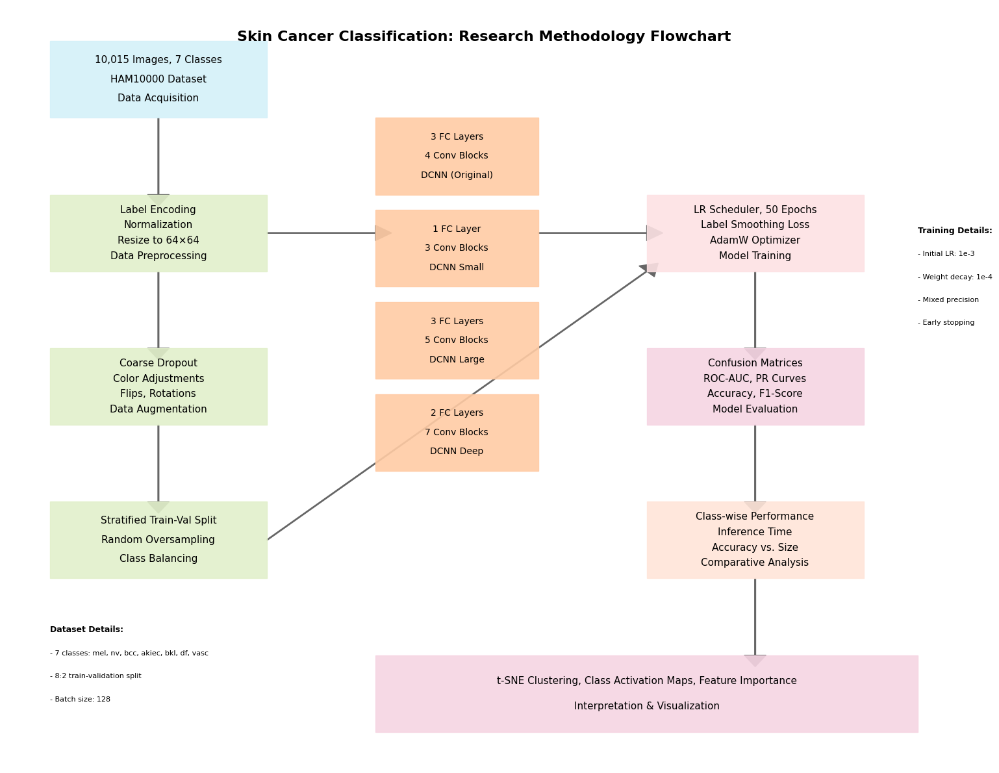

Research methodology flowchart saved as 'research_methodology_flowchart.png'


In [ ]:
def create_methodology_flowchart():
    """
    Create a detailed flowchart visualizing the research methodology
    """
    # Create a figure for the flowchart
    plt.figure(figsize=(15, 12))
    plt.axis('off')

    # Define colors for different components
    colors = {
        'data': '#D4F1F9',      # Light blue
        'preprocess': '#E2F0CB', # Light green
        'model': '#FFCBA4',     # Light orange
        'training': '#FDE2E4',  # Light pink
        'evaluation': '#F6D5E3', # Light purple
        'compare': '#FFE5D9',   # Light peach
        'arrow': '#666666'      # Dark gray
    }

    # Define boxes for flowchart components
    def draw_box(x, y, width, height, text, color, fontsize=10, alpha=0.9):
        rect = plt.Rectangle((x, y), width, height, fill=True, color=color, alpha=alpha,
                            edgecolor='gray', linewidth=1, zorder=1)
        plt.gca().add_patch(rect)
        lines = text.split('\n')
        line_height = height / (len(lines) + 1)
        for i, line in enumerate(lines):
            plt.text(x+width/2, y+line_height*(i+1), line,
                    ha='center', va='center', fontsize=fontsize, zorder=2)

    # Draw an arrow between boxes
    def draw_arrow(x1, y1, x2, y2, label=None, fontsize=8):
        plt.arrow(x1, y1, x2-x1, y2-y1, head_width=0.02, head_length=0.015,
                 fc=colors['arrow'], ec=colors['arrow'], zorder=0)
        if label:
            plt.text((x1+x2)/2, (y1+y2)/2, label, ha='center', va='center',
                    fontsize=fontsize, bbox=dict(facecolor='white', alpha=0.7, pad=3))

    # Draw main flowchart components

    # 1. Data Acquisition
    draw_box(0.1, 0.85, 0.2, 0.1, 'Data Acquisition\nHAM10000 Dataset\n10,015 Images, 7 Classes', colors['data'], fontsize=11)

    # 2. Data Preprocessing
    draw_arrow(0.2, 0.85, 0.2, 0.75)
    draw_box(0.1, 0.65, 0.2, 0.1, 'Data Preprocessing\nResize to 64×64\nNormalization\nLabel Encoding', colors['preprocess'], fontsize=11)

    # 3. Data Augmentation
    draw_arrow(0.2, 0.65, 0.2, 0.55)
    draw_box(0.1, 0.45, 0.2, 0.1, 'Data Augmentation\nFlips, Rotations\nColor Adjustments\nCoarse Dropout', colors['preprocess'], fontsize=11)

    # 4. Class Balancing
    draw_arrow(0.2, 0.45, 0.2, 0.35)
    draw_box(0.1, 0.25, 0.2, 0.1, 'Class Balancing\nRandom Oversampling\nStratified Train-Val Split', colors['preprocess'], fontsize=11)

    # 5. Model Design branch
    draw_arrow(0.3, 0.7, 0.4, 0.7)

    # 5a. DCNN Original
    draw_box(0.4, 0.75, 0.15, 0.1, 'DCNN (Original)\n4 Conv Blocks\n3 FC Layers', colors['model'], fontsize=10)

    # 5b. DCNN Small
    draw_box(0.4, 0.63, 0.15, 0.1, 'DCNN Small\n3 Conv Blocks\n1 FC Layer', colors['model'], fontsize=10)

    # 5c. DCNN Large
    draw_box(0.4, 0.51, 0.15, 0.1, 'DCNN Large\n5 Conv Blocks\n3 FC Layers', colors['model'], fontsize=10)

    # 5d. DCNN Deep
    draw_box(0.4, 0.39, 0.15, 0.1, 'DCNN Deep\n7 Conv Blocks\n2 FC Layers', colors['model'], fontsize=10)

    # 6. Model Training
    draw_arrow(0.55, 0.7, 0.65, 0.7)
    draw_box(0.65, 0.65, 0.2, 0.1, 'Model Training\nAdamW Optimizer\nLabel Smoothing Loss\nLR Scheduler, 50 Epochs', colors['training'], fontsize=11)

    # 7. Evaluation
    draw_arrow(0.75, 0.65, 0.75, 0.55)
    draw_box(0.65, 0.45, 0.2, 0.1, 'Model Evaluation\nAccuracy, F1-Score\nROC-AUC, PR Curves\nConfusion Matrices', colors['evaluation'], fontsize=11)

    # 8. Comparative Analysis
    draw_arrow(0.75, 0.45, 0.75, 0.35)
    draw_box(0.65, 0.25, 0.2, 0.1, 'Comparative Analysis\nAccuracy vs. Size\nInference Time\nClass-wise Performance', colors['compare'], fontsize=11)

    # Connect class balancing to training
    draw_arrow(0.3, 0.3, 0.65, 0.65)

    # 9. Interpretation & Visualization
    draw_arrow(0.75, 0.25, 0.75, 0.15)
    draw_box(0.4, 0.05, 0.5, 0.1, 'Interpretation & Visualization\nt-SNE Clustering, Class Activation Maps, Feature Importance', colors['evaluation'], fontsize=11)

    # Title
    plt.text(0.5, 0.95, 'Skin Cancer Classification: Research Methodology Flowchart',
            ha='center', fontsize=16, weight='bold')

    # Add boxes with implementation details
    # Data details
    plt.text(0.1, 0.18, 'Dataset Details:', fontsize=9, weight='bold')
    plt.text(0.1, 0.15, '- 7 classes: mel, nv, bcc, akiec, bkl, df, vasc', fontsize=8)
    plt.text(0.1, 0.12, '- 8:2 train-validation split', fontsize=8)
    plt.text(0.1, 0.09, '- Batch size: 128', fontsize=8)

    # Training details
    plt.text(0.9, 0.7, 'Training Details:', fontsize=9, weight='bold')
    plt.text(0.9, 0.67, '- Initial LR: 1e-3', fontsize=8)
    plt.text(0.9, 0.64, '- Weight decay: 1e-4', fontsize=8)
    plt.text(0.9, 0.61, '- Mixed precision', fontsize=8)
    plt.text(0.9, 0.58, '- Early stopping', fontsize=8)

    plt.tight_layout()
    plt.savefig('research_methodology_flowchart.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("Research methodology flowchart saved as 'research_methodology_flowchart.png'")

# Create methodology flowchart
create_methodology_flowchart()

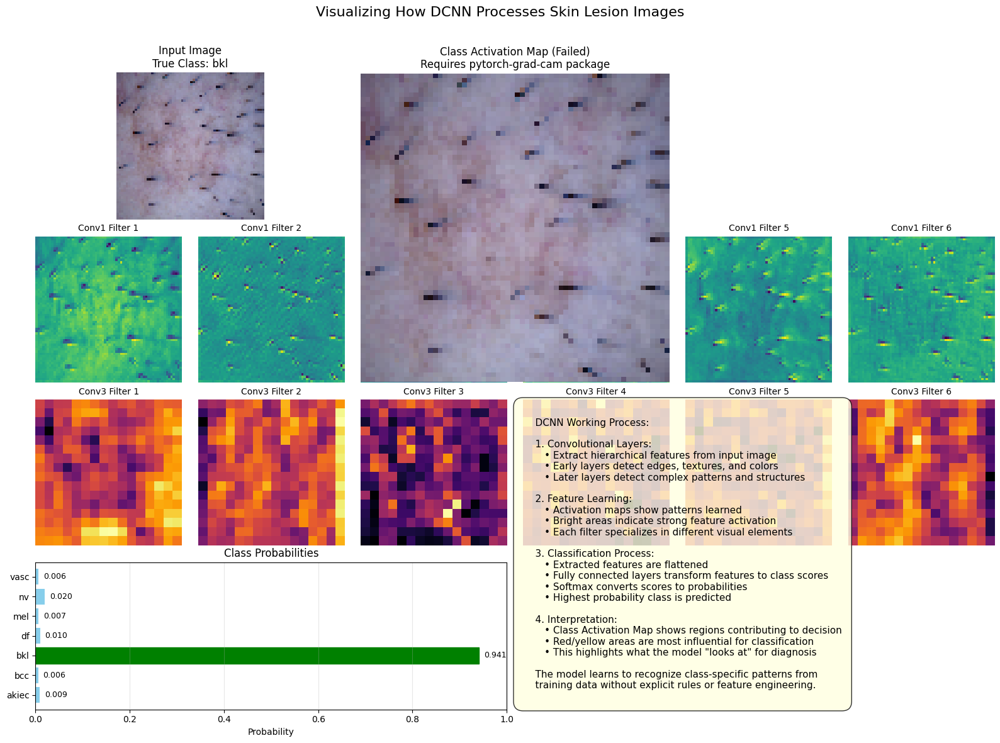

Model working visualization saved as 'model_working_visualization.png'


In [ ]:
def visualize_model_working():
    """
    Create a visual explanation of how the DCNN model processes images
    and makes predictions
    """
    from matplotlib.gridspec import GridSpec

    # Create figure with custom layout
    fig = plt.figure(figsize=(16, 12))
    gs = GridSpec(4, 6, figure=fig)

    # Define function to get a sample image and its activations
    def get_sample_and_activations():
        # Get a random sample from validation set
        # Preferably one that's correctly classified
        model.eval()
        correct_samples = []

        with torch.no_grad():
            for i, (img, label) in enumerate(val_dataset):
                if len(correct_samples) >= 1:
                    break

                img_tensor = img.unsqueeze(0).to(device)
                output = model(img_tensor)
                pred = torch.argmax(output, dim=1).item()

                if pred == label:
                    correct_samples.append((img, label, pred))

        if not correct_samples:
            # If no correct samples found, just take the first one
            img, label = val_dataset[0]
            img_tensor = img.unsqueeze(0).to(device)
            output = model(img_tensor)
            pred = torch.argmax(output, dim=1).item()
            correct_samples.append((img, label, pred))

        img, label, pred = correct_samples[0]

        # Get activations at each layer
        activations = {}

        def get_activation(name):
            def hook(model, input, output):
                activations[name] = output.detach()
            return hook

        # Register hooks for all convolutional layers
        handles = []
        for name, module in model.named_modules():
            if isinstance(module, nn.Conv2d):
                handles.append(module.register_forward_hook(get_activation(name)))

        # Forward pass to get activations
        img_tensor = img.unsqueeze(0).to(device)
        output = model(img_tensor)

        # Remove hooks
        for handle in handles:
            handle.remove()

        return img, label, pred, activations

    # Get sample and activations
    img, label, pred, activations = get_sample_and_activations()

    # 1. Original Image
    ax1 = fig.add_subplot(gs[0, 0:2])
    img_np = img.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5
    img_np = np.clip(img_np, 0, 1)
    ax1.imshow(img_np)
    ax1.set_title(f'Input Image\nTrue Class: {class_names[label]}', fontsize=12)
    ax1.axis('off')

    # 2. First layer activations
    # Get the first convolutional layer activations
    first_layer_name = list(activations.keys())[0]
    first_layer_act = activations[first_layer_name][0].cpu().numpy()

    # Show first 6 feature maps
    for i in range(min(6, first_layer_act.shape[0])):
        ax = fig.add_subplot(gs[1, i])
        feature_map = first_layer_act[i]
        ax.imshow(feature_map, cmap='viridis')
        ax.set_title(f'Conv1 Filter {i+1}', fontsize=10)
        ax.axis('off')

    # 3. Later layer activations (e.g., third conv layer)
    later_layer_name = list(activations.keys())[2] if len(activations) > 2 else list(activations.keys())[-1]
    later_layer_act = activations[later_layer_name][0].cpu().numpy()

    # Show first 6 feature maps from later layer
    for i in range(min(6, later_layer_act.shape[0])):
        ax = fig.add_subplot(gs[2, i])
        feature_map = later_layer_act[i]
        ax.imshow(feature_map, cmap='inferno')
        ax.set_title(f'Conv3 Filter {i+1}', fontsize=10)
        ax.axis('off')

    # 4. Prediction probabilities
    ax4 = fig.add_subplot(gs[3, 0:3])

    # Get probabilities
    with torch.no_grad():
        img_tensor = img.unsqueeze(0).to(device)
        output = model(img_tensor)
        probs = F.softmax(output, dim=1)[0].cpu().numpy()

    # Plot probabilities
    bars = ax4.barh(class_names, probs, color='skyblue')
    bars[label].set_color('green')  # Highlight true class
    ax4.set_xlim(0, 1)
    ax4.set_title('Class Probabilities', fontsize=12)
    ax4.set_xlabel('Probability', fontsize=10)
    ax4.grid(axis='x', alpha=0.3)

    # Add probability values
    for i, bar in enumerate(bars):
        width = bar.get_width()
        ax4.text(width + 0.01, bar.get_y() + bar.get_height()/2,
                f"{width:.3f}", va='center', fontsize=9)

    # 5. Class activation map
    ax5 = fig.add_subplot(gs[0:2, 2:4])

    # Generate class activation map
    # First, ensure pytorch-grad-cam is installed
    try:
        from pytorch_grad_cam import GradCAM
        from pytorch_grad_cam.utils.image import show_cam_on_image

        # Define the target layer (last conv layer)
        target_layer = None
        for name, module in reversed(list(model.named_modules())):
            if isinstance(module, nn.Conv2d):
                target_layer = module
                break

        # Create a custom model wrapper to extract the target layer
        class ModelWrapper(nn.Module):
            def __init__(self, model, target_layer):
                super(ModelWrapper, self).__init__()
                self.model = model
                self.target_layer = target_layer

            def forward(self, x):
                return self.model(x)

        model_wrapper = ModelWrapper(model, target_layer)

        # Initialize GradCAM
        cam = GradCAM(model=model_wrapper, target_layer=target_layer, use_cuda=torch.cuda.is_available())

        # Generate CAM for the predicted class
        grayscale_cam = cam(input_tensor=img_tensor, target_category=pred)
        grayscale_cam = grayscale_cam[0, :]

        # Overlay CAM on image
        visualization = show_cam_on_image(img_np, grayscale_cam, use_rgb=True)

        ax5.imshow(visualization)
        ax5.set_title('Class Activation Map\nHighlighting Important Regions', fontsize=12)
        ax5.axis('off')
    except:
        # If GradCAM fails, just show the image
        ax5.imshow(img_np)
        ax5.set_title('Class Activation Map (Failed)\nRequires pytorch-grad-cam package', fontsize=12)
        ax5.axis('off')

    # 6. Feature extraction and classification explanation
    ax6 = fig.add_subplot(gs[2:4, 3:6])
    ax6.axis('off')

    explanation_text = """
    DCNN Working Process:

    1. Convolutional Layers:
       • Extract hierarchical features from input image
       • Early layers detect edges, textures, and colors
       • Later layers detect complex patterns and structures

    2. Feature Learning:
       • Activation maps show patterns learned
       • Bright areas indicate strong feature activation
       • Each filter specializes in different visual elements

    3. Classification Process:
       • Extracted features are flattened
       • Fully connected layers transform features to class scores
       • Softmax converts scores to probabilities
       • Highest probability class is predicted

    4. Interpretation:
       • Class Activation Map shows regions contributing to decision
       • Red/yellow areas are most influential for classification
       • This highlights what the model "looks at" for diagnosis

    The model learns to recognize class-specific patterns from
    training data without explicit rules or feature engineering.
    """

    ax6.text(0, 0.5, explanation_text, va='center', fontsize=11,
             bbox=dict(boxstyle="round,pad=1", facecolor="lightyellow", alpha=0.8))

    # Title for the entire figure
    plt.suptitle('Visualizing How DCNN Processes Skin Lesion Images', fontsize=16, y=0.98)

    # Adjust layout
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig('model_working_visualization.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("Model working visualization saved as 'model_working_visualization.png'")

# Visualize model working process
visualize_model_working()

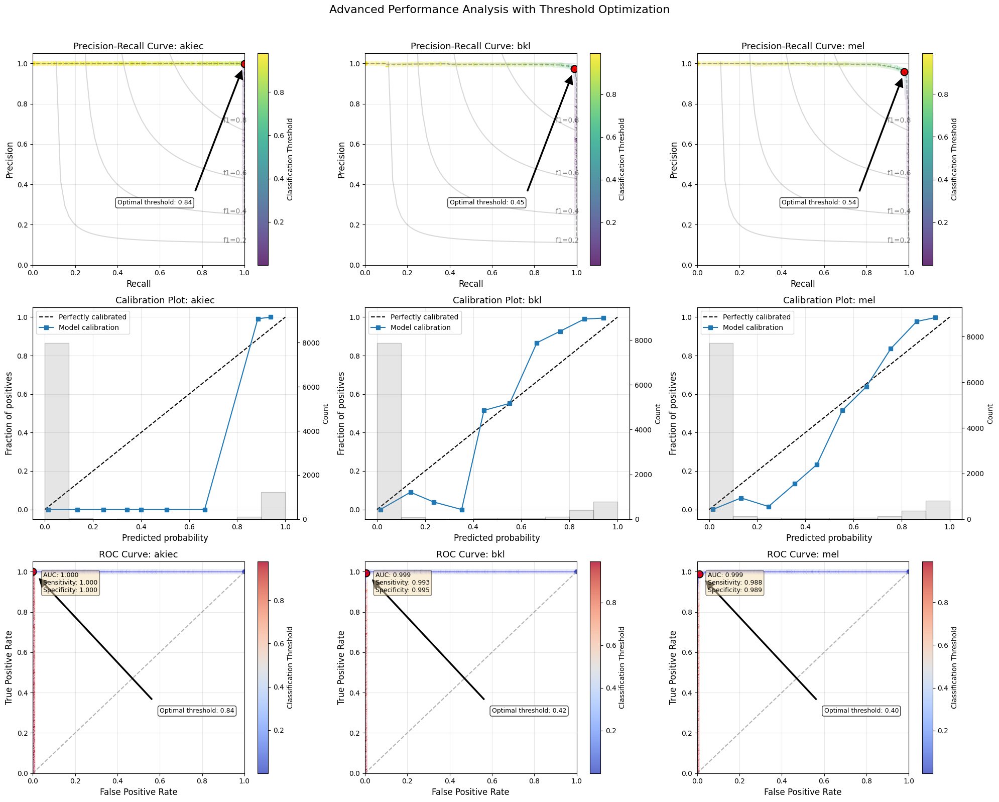

<Figure size 1400x1000 with 0 Axes>

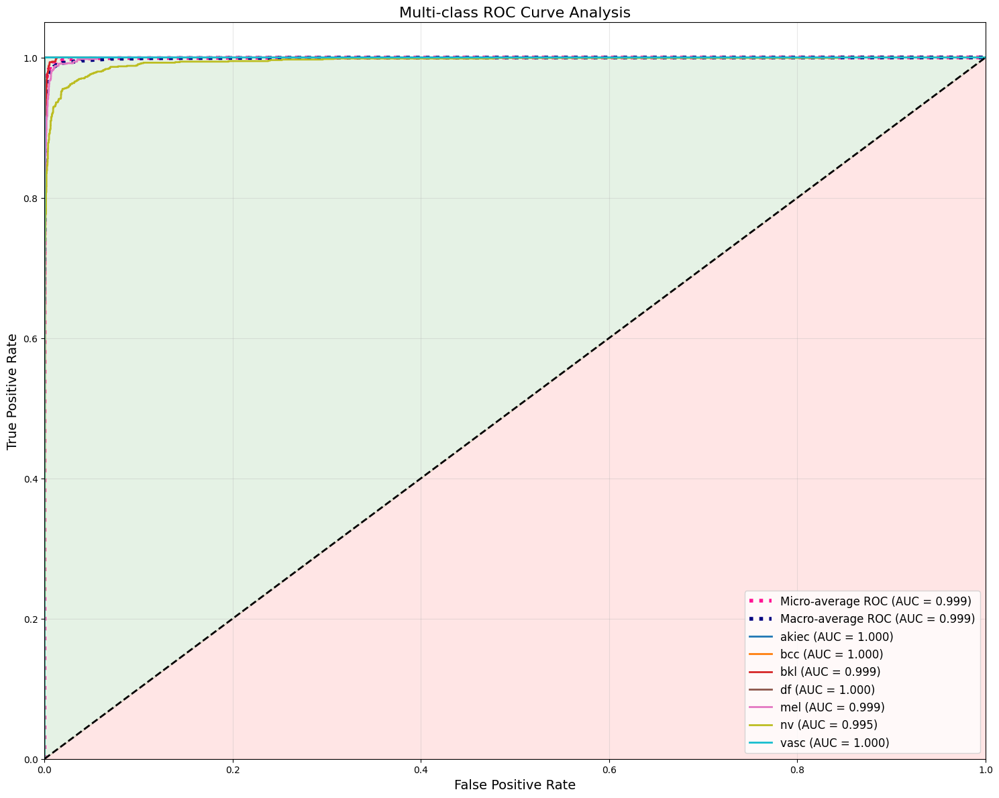

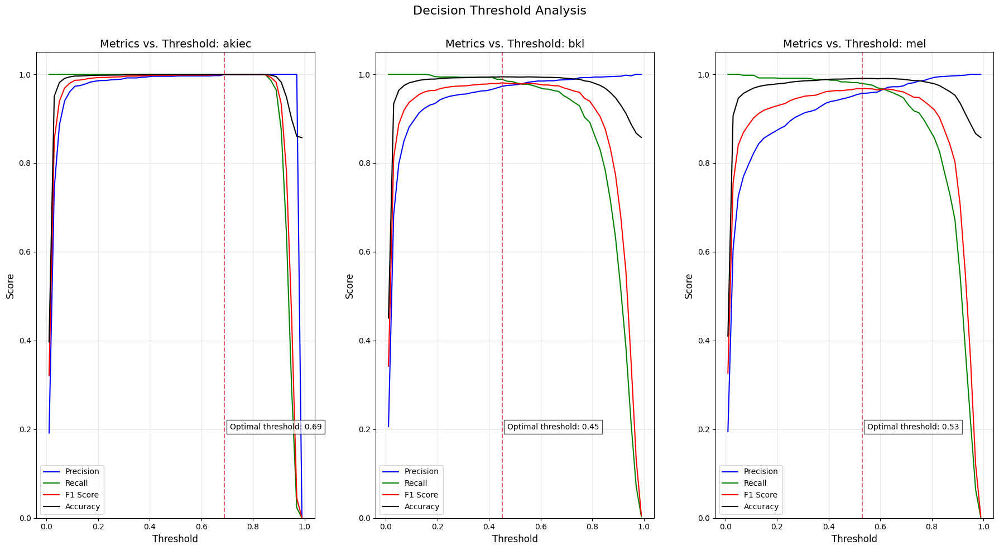

Advanced performance curves saved as:
- advanced_performance_curves.png
- multiclass_roc_analysis.png
- threshold_analysis.png


In [ ]:
def create_advanced_performance_curves():
    """
    Create advanced visualization of model performance with detailed curve analysis
    including precision-recall trade-offs, threshold optimization, and calibration
    """
    # Collect predictions and true labels
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc="Collecting predictions"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = F.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)

            all_probs.extend(probs.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Convert to numpy arrays
    y_true = np.array(all_labels)
    y_pred = np.array(all_preds)
    y_probs = np.array(all_probs)

    # Binarize for one-vs-rest metrics
    from sklearn.preprocessing import label_binarize
    y_true_bin = label_binarize(y_true, classes=range(len(class_names)))

    # 1. ADVANCED PRECISION-RECALL ANALYSIS WITH THRESHOLDS
    # ---------------------------------------------------
    fig = plt.figure(figsize=(20, 16))
    gs = plt.GridSpec(3, 3, figure=fig)

    # Choose a few representative classes for detailed analysis
    classes_to_analyze = [0, 2, 4]  # Choose specific interesting classes (e.g., melanoma, bcc, bkl)

    # 1.1: Precision-Recall curve with thresholds for specific classes
    for i, idx in enumerate(classes_to_analyze):
        ax = fig.add_subplot(gs[0, i])

        from sklearn.metrics import precision_recall_curve
        precision, recall, thresholds = precision_recall_curve(y_true_bin[:, idx], y_probs[:, idx])

        # Create threshold-colored scatter points
        points = ax.scatter(recall[:-1], precision[:-1], c=thresholds, cmap='viridis',
                          s=50, alpha=0.8, edgecolors='w', linewidth=0.5)

        # Add colorbar for thresholds
        cbar = plt.colorbar(points, ax=ax)
        cbar.set_label('Classification Threshold', fontsize=10)

        # Plot precision-recall curve
        ax.plot(recall, precision, 'k--', alpha=0.3)

        # Add F1-score contours
        f_scores = np.linspace(0.2, 0.8, num=4)
        for f_score in f_scores:
            x = np.linspace(0.01, 1)
            y = f_score * x / (2 * x - f_score)
            ax.plot(x[y >= 0], y[y >= 0], color='gray', alpha=0.3)
            ax.annotate(f'f1={f_score:.1f}', xy=(0.9, y[45]), alpha=0.5)

        # Add optimal threshold point
        f1_scores = 2 * (precision[:-1] * recall[:-1]) / (precision[:-1] + recall[:-1] + 1e-10)
        opt_idx = np.argmax(f1_scores)
        opt_threshold = thresholds[opt_idx]

        ax.scatter(recall[opt_idx], precision[opt_idx], s=100, c='red',
                  alpha=1, edgecolors='k', linewidth=1.5)
        ax.annotate(f'Optimal threshold: {opt_threshold:.2f}',
                   xy=(recall[opt_idx], precision[opt_idx]),
                   xytext=(0.4, 0.3),
                   arrowprops=dict(facecolor='black', shrink=0.05, width=1.5),
                   fontsize=9,
                   bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.8))

        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('Recall', fontsize=12)
        ax.set_ylabel('Precision', fontsize=12)
        ax.set_title(f'Precision-Recall Curve: {class_names[idx]}', fontsize=13)
        ax.grid(alpha=0.3)

    # 2. CALIBRATION PLOTS (RELIABILITY DIAGRAMS)
    # ---------------------------------------------------
    from sklearn.calibration import calibration_curve

    for i, idx in enumerate(classes_to_analyze):
        ax = fig.add_subplot(gs[1, i])

        # Get calibration curve
        prob_true, prob_pred = calibration_curve(y_true_bin[:, idx], y_probs[:, idx], n_bins=10)

        # Plot perfectly calibrated
        ax.plot([0, 1], [0, 1], 'k--', label='Perfectly calibrated')

        # Plot calibration curve
        ax.plot(prob_pred, prob_true, 's-', label='Model calibration')

        # Plot histogram of probabilities
        ax2 = ax.twinx()
        ax2.hist(y_probs[:, idx], range=(0, 1), bins=10, alpha=0.2, color='gray', edgecolor='k')
        ax2.set_ylabel('Count', fontsize=10)
        ax2.set_ylim([0, np.histogram(y_probs[:, idx], range=(0, 1), bins=10)[0].max() * 1.2])

        ax.set_xlabel('Predicted probability', fontsize=12)
        ax.set_ylabel('Fraction of positives', fontsize=12)
        ax.set_title(f'Calibration Plot: {class_names[idx]}', fontsize=13)
        ax.legend(loc='best')
        ax.grid(alpha=0.3)

    # 3. ROC CURVES WITH OPTIMAL THRESHOLD
    # ---------------------------------------------------
    from sklearn.metrics import roc_curve, auc

    for i, idx in enumerate(classes_to_analyze):
        ax = fig.add_subplot(gs[2, i])

        # Compute ROC curve
        fpr, tpr, thresholds = roc_curve(y_true_bin[:, idx], y_probs[:, idx])
        roc_auc = auc(fpr, tpr)

        # Plot ROC curve with threshold-colored points
        points = ax.scatter(fpr, tpr, c=thresholds, cmap='coolwarm', s=50, alpha=0.8,
                          edgecolors='w', linewidth=0.5)
        ax.plot(fpr, tpr, lw=2, alpha=0.3, color='blue')

        # Add colorbar
        cbar = plt.colorbar(points, ax=ax)
        cbar.set_label('Classification Threshold', fontsize=10)

        # Find optimal threshold using Youden's J statistic (tpr - fpr)
        optimal_idx = np.argmax(tpr - fpr)
        optimal_threshold = thresholds[optimal_idx]

        # Mark optimal threshold
        ax.scatter(fpr[optimal_idx], tpr[optimal_idx], s=100, c='red', alpha=1,
                  marker='o', edgecolors='k', linewidth=1.5)
        ax.annotate(f'Optimal threshold: {optimal_threshold:.2f}',
                   xy=(fpr[optimal_idx], tpr[optimal_idx]),
                   xytext=(0.6, 0.3),
                   arrowprops=dict(facecolor='black', shrink=0.05, width=1.5),
                   fontsize=9,
                   bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.8))

        # Add random chance line
        ax.plot([0, 1], [0, 1], linestyle='--', color='gray', alpha=0.6)

        # Add metrics at optimal threshold
        sensitivity = tpr[optimal_idx]
        specificity = 1 - fpr[optimal_idx]

        # Display metrics in a box
        textstr = f'AUC: {roc_auc:.3f}\nSensitivity: {sensitivity:.3f}\nSpecificity: {specificity:.3f}'
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
        ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=9,
               verticalalignment='top', bbox=props)

        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('False Positive Rate', fontsize=12)
        ax.set_ylabel('True Positive Rate', fontsize=12)
        ax.set_title(f'ROC Curve: {class_names[idx]}', fontsize=13)
        ax.grid(alpha=0.3)

    # Overall title
    plt.suptitle('Advanced Performance Analysis with Threshold Optimization', fontsize=16, y=0.995)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.savefig('advanced_performance_curves.png', dpi=300, bbox_inches='tight')
    plt.show()

    # 4. MULTI-CLASS ROC ANALYSIS
    # ---------------------------------------------------
    from sklearn.metrics import roc_curve, auc
    from numpy import interp

    # Compute ROC curve and ROC area for each class
    fpr = {}
    tpr = {}
    roc_auc = {}

    plt.figure(figsize=(14, 10))

    # First, compute the standard ROC curves for each class
    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Second, compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_true_bin.ravel(), y_probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # Third, compute macro-average ROC curve and ROC area
    # Aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(class_names))]))

    # Interpolate all ROC curves at these points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(len(class_names)):
        mean_tpr += interp(all_fpr, fpr[i], tpr[i])

    # Average and compute AUC
    mean_tpr /= len(class_names)
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # Plot all ROC curves
    plt.figure(figsize=(15, 12))

    # Plot micro-average and macro-average ROC curves
    plt.plot(fpr["micro"], tpr["micro"],
             label=f'Micro-average ROC (AUC = {roc_auc["micro"]:.3f})',
             color='deeppink', linestyle=':', linewidth=4)

    plt.plot(fpr["macro"], tpr["macro"],
             label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.3f})',
             color='navy', linestyle=':', linewidth=4)

    # Plot ROC curves for all classes
    colors = plt.cm.tab10(np.linspace(0, 1, len(class_names)))
    for i, color in zip(range(len(class_names)), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'{class_names[i]} (AUC = {roc_auc[i]:.3f})')

    # Add diagonal line
    plt.plot([0, 1], [0, 1], 'k--', lw=2)

    # Style the plot
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=14)
    plt.ylabel('True Positive Rate', fontsize=14)
    plt.title('Multi-class ROC Curve Analysis', fontsize=16)
    plt.legend(loc="lower right", fontsize=12)

    # Add a grid background
    plt.grid(True, alpha=0.3)

    # Add a colored background to highlight performance regions
    plt.fill_between([0, 1], [0, 1], [1, 1], alpha=0.1, color='green', label='Good performance area')
    plt.fill_between([0, 1], [0, 0], [0, 1], alpha=0.1, color='red', label='Poor performance area')

    plt.tight_layout()
    plt.savefig('multiclass_roc_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()

    # 5. DECISION THRESHOLD ANALYSIS
    # ---------------------------------------------------
    plt.figure(figsize=(18, 10))

    # Create a subplot for each of the analyzed classes
    for p, idx in enumerate(classes_to_analyze):
        # Calculate precision, recall, F1, and accuracy at different thresholds
        precision_at_threshold = []
        recall_at_threshold = []
        f1_at_threshold = []
        accuracy_at_threshold = []

        thresholds = np.linspace(0.01, 0.99, 50)

        for threshold in thresholds:
            # Convert probabilities to predictions based on threshold
            y_pred_at_threshold = (y_probs[:, idx] >= threshold).astype(int)

            # Calculate metrics
            tp = np.sum((y_true_bin[:, idx] == 1) & (y_pred_at_threshold == 1))
            fp = np.sum((y_true_bin[:, idx] == 0) & (y_pred_at_threshold == 1))
            tn = np.sum((y_true_bin[:, idx] == 0) & (y_pred_at_threshold == 0))
            fn = np.sum((y_true_bin[:, idx] == 1) & (y_pred_at_threshold == 0))

            # Avoid division by zero
            precision = tp / (tp + fp) if (tp + fp) > 0 else 0
            recall = tp / (tp + fn) if (tp + fn) > 0 else 0
            f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
            accuracy = (tp + tn) / (tp + tn + fp + fn)

            precision_at_threshold.append(precision)
            recall_at_threshold.append(recall)
            f1_at_threshold.append(f1)
            accuracy_at_threshold.append(accuracy)

        # Plot the metrics
        plt.subplot(1, 3, p+1)
        plt.plot(thresholds, precision_at_threshold, 'b-', label='Precision')
        plt.plot(thresholds, recall_at_threshold, 'g-', label='Recall')
        plt.plot(thresholds, f1_at_threshold, 'r-', label='F1 Score')
        plt.plot(thresholds, accuracy_at_threshold, 'k-', label='Accuracy')

        # Find the optimal threshold for F1 score
        optimal_idx = np.argmax(f1_at_threshold)
        optimal_threshold = thresholds[optimal_idx]

        # Highlight the optimal threshold
        plt.axvline(x=optimal_threshold, color='crimson', linestyle='--', alpha=0.7)
        plt.text(optimal_threshold + 0.02, 0.2, f'Optimal threshold: {optimal_threshold:.2f}',
                fontsize=10, bbox=dict(facecolor='white', alpha=0.7))

        plt.xlabel('Threshold', fontsize=12)
        plt.ylabel('Score', fontsize=12)
        plt.title(f'Metrics vs. Threshold: {class_names[idx]}', fontsize=14)
        plt.legend(loc='best')
        plt.grid(alpha=0.3)
        plt.ylim([0, 1.05])

    plt.suptitle('Decision Threshold Analysis', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig('threshold_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("Advanced performance curves saved as:")
    print("- advanced_performance_curves.png")
    print("- multiclass_roc_analysis.png")
    print("- threshold_analysis.png")

# Generate advanced performance curves
create_advanced_performance_curves()

Generating predictions: 100%|██████████| 74/74 [00:51<00:00,  1.44it/s]


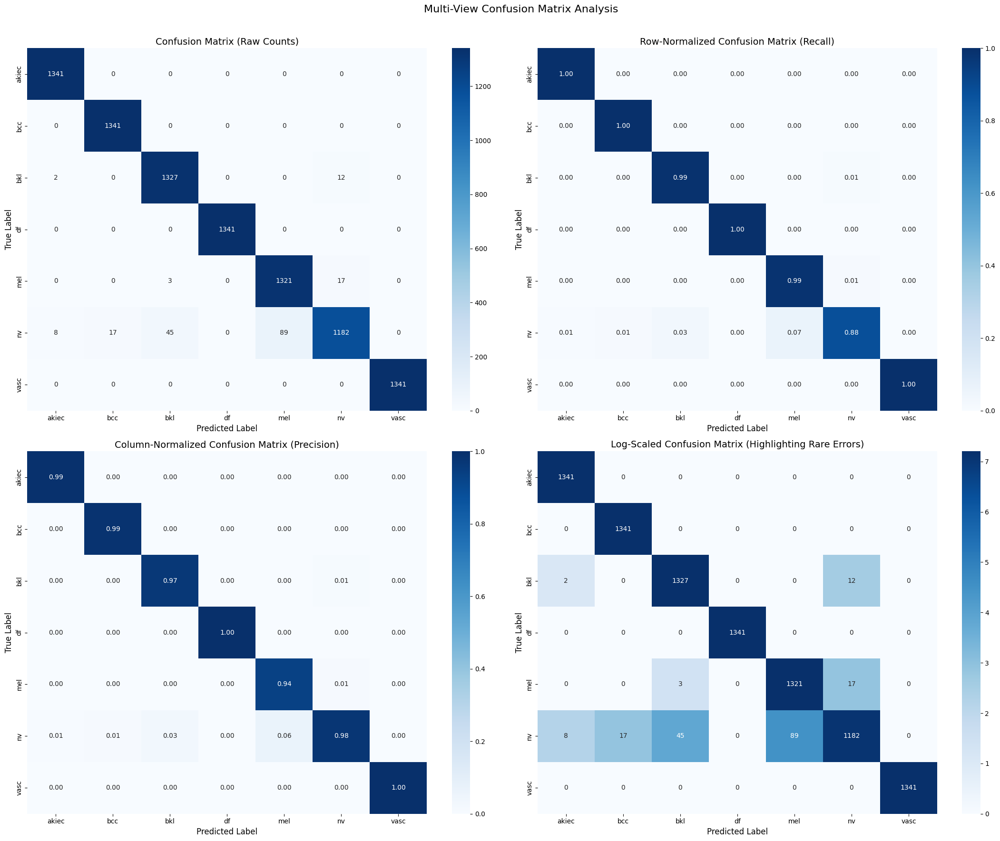

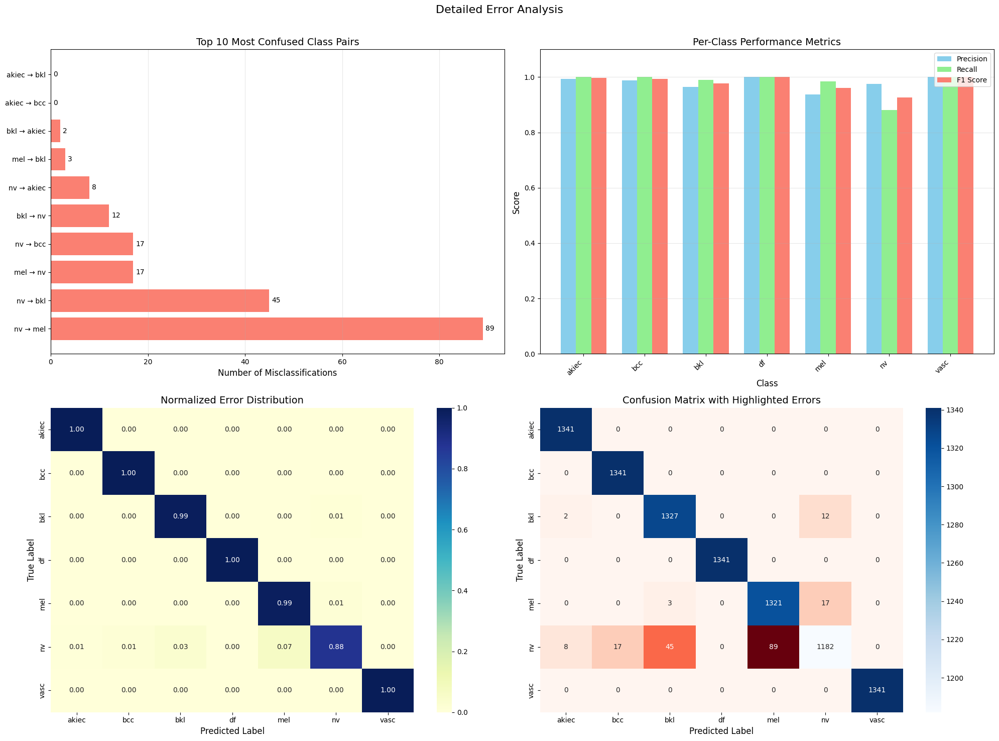

<ipython-input-51-4cd6266ad9b2>:230: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


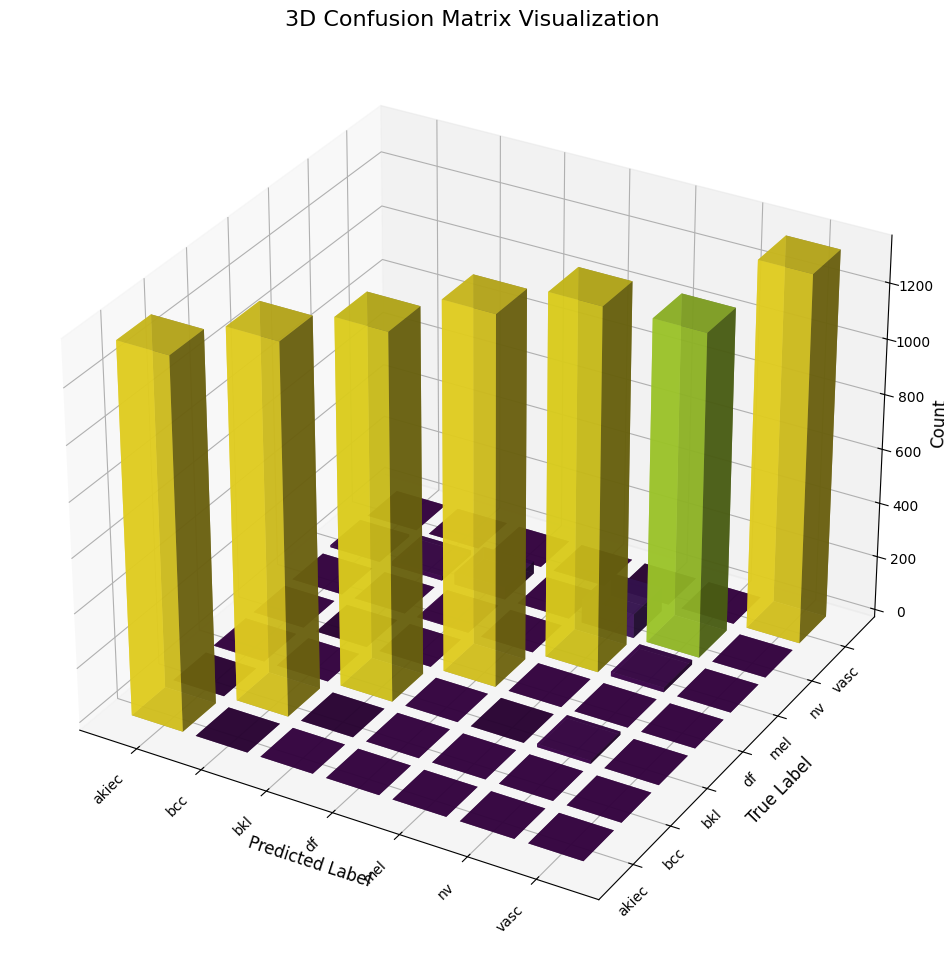

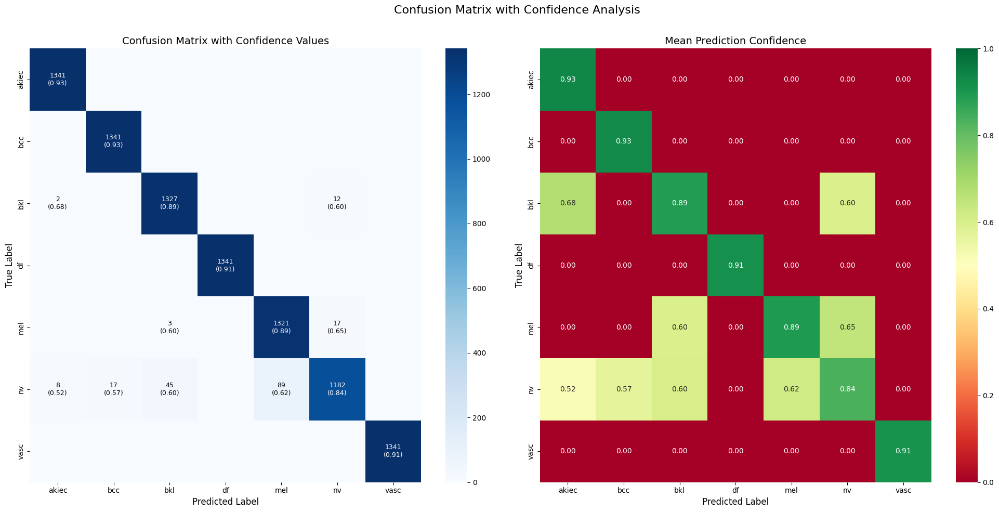

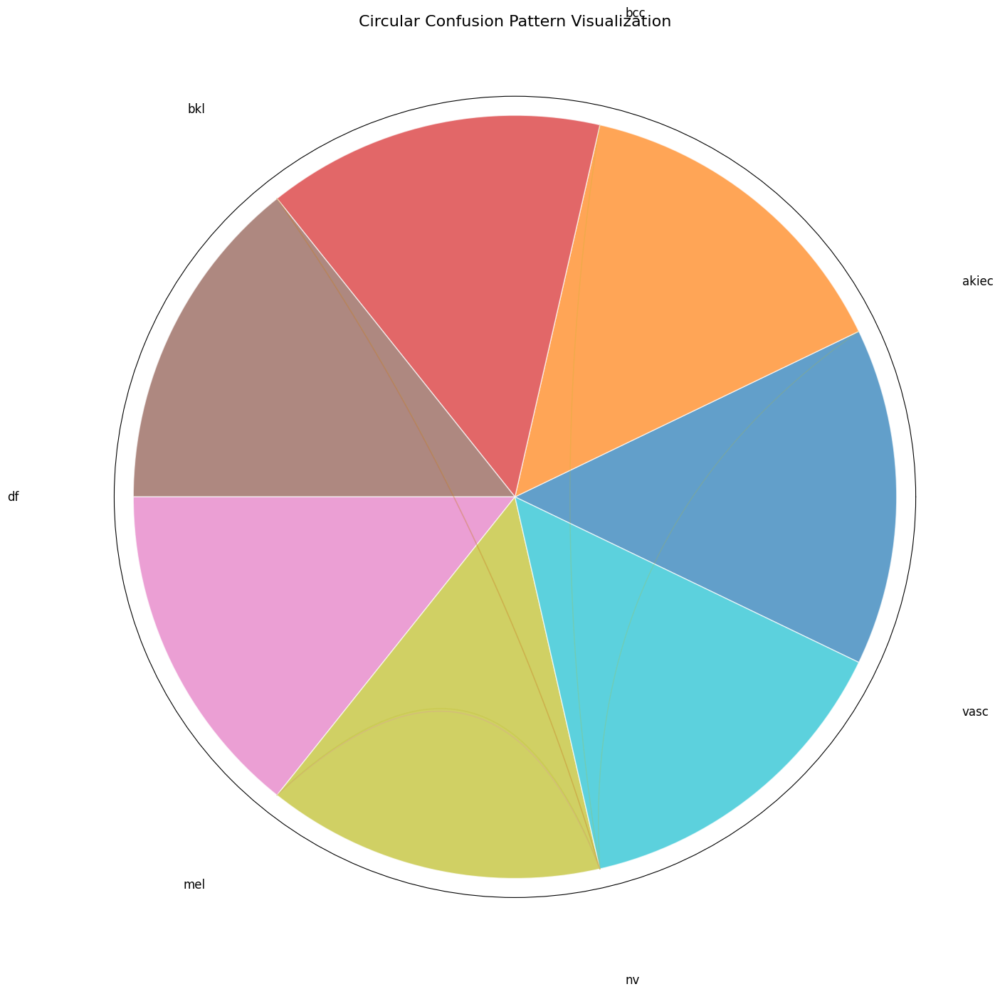

Enhanced confusion matrix visualizations saved as:
- enhanced_confusion_matrix.png
- error_analysis.png
- 3d_confusion_matrix.png
- confidence_confusion_matrix.png
- circular_confusion_matrix.png (if successful)


In [ ]:
def create_enhanced_confusion_matrix():
    """
    Create an enhanced confusion matrix visualization with detailed error analysis,
    class-wise metrics, and normalized representations
    """
    from sklearn.metrics import confusion_matrix
    import seaborn as sns

    # Collect predictions
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc="Generating predictions"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = F.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)

            all_probs.extend(probs.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Convert to numpy arrays
    y_true = np.array(all_labels)
    y_pred = np.array(all_preds)
        # Create confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # 1. MULTI-VIEW CONFUSION MATRIX VISUALIZATION
    # ---------------------------------------------------
    plt.figure(figsize=(22, 18))

    # 1.1 Raw counts confusion matrix
    plt.subplot(2, 2, 1)
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.ylabel('True Label', fontsize=12)
    plt.title('Confusion Matrix (Raw Counts)', fontsize=14)

    # 1.2 Row-normalized confusion matrix (recall)
    plt.subplot(2, 2, 2)
    cm_row_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    sns.heatmap(cm_row_norm, annot=True, fmt=".2f", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.ylabel('True Label', fontsize=12)
    plt.title('Row-Normalized Confusion Matrix (Recall)', fontsize=14)

    # 1.3 Column-normalized confusion matrix (precision)
    plt.subplot(2, 2, 3)
    cm_col_norm = cm.astype('float') / cm.sum(axis=0)[np.newaxis, :]
    sns.heatmap(cm_col_norm, annot=True, fmt=".2f", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.ylabel('True Label', fontsize=12)
    plt.title('Column-Normalized Confusion Matrix (Precision)', fontsize=14)

    # 1.4 Log-scaled confusion matrix to highlight rare errors
    plt.subplot(2, 2, 4)
    cm_log = np.log1p(cm)  # log(1+x) to handle zeros
    sns.heatmap(cm_log, annot=cm, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.ylabel('True Label', fontsize=12)
    plt.title('Log-Scaled Confusion Matrix (Highlighting Rare Errors)', fontsize=14)

    plt.suptitle('Multi-View Confusion Matrix Analysis', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig('enhanced_confusion_matrix.png', dpi=300, bbox_inches='tight')
    plt.show()

    # 2. ERROR ANALYSIS VISUALIZATION
    # ---------------------------------------------------
    # Calculate per-class metrics
    precision = np.diag(cm) / np.sum(cm, axis=0)
    recall = np.diag(cm) / np.sum(cm, axis=1)
    f1_score = 2 * precision * recall / (precision + recall)
    accuracy = np.sum(np.diag(cm)) / np.sum(cm)

    # Replace NaNs with 0
    precision = np.nan_to_num(precision)
    recall = np.nan_to_num(recall)
    f1_score = np.nan_to_num(f1_score)

    # Calculate error patterns
    plt.figure(figsize=(20, 15))

    # 2.1 Most confused class pairs
    plt.subplot(2, 2, 1)

    # Create a matrix excluding the diagonal (correct predictions)
    cm_errors = cm.copy()
    np.fill_diagonal(cm_errors, 0)

    # Find the top confusion pairs
    n_classes = len(class_names)
    confusion_pairs = []

    for i in range(n_classes):
        for j in range(n_classes):
            if i != j:
                confusion_pairs.append((i, j, cm_errors[i, j]))

    # Sort pairs by confusion count (descending)
    confusion_pairs.sort(key=lambda x: x[2], reverse=True)

    # Get top 10 confusion pairs
    top_pairs = confusion_pairs[:10]

    # Create bar chart
    pair_labels = [f"{class_names[i]} → {class_names[j]}" for i, j, _ in top_pairs]
    pair_values = [count for _, _, count in top_pairs]

    bars = plt.barh(pair_labels, pair_values, color='salmon')

    # Add value labels to bars
    for bar in bars:
        width = bar.get_width()
        plt.text(width + 0.5, bar.get_y() + bar.get_height()/2,
                f"{width:.0f}", ha='left', va='center', fontsize=10)

    plt.xlabel('Number of Misclassifications', fontsize=12)
    plt.title('Top 10 Most Confused Class Pairs', fontsize=14)
    plt.grid(axis='x', alpha=0.3)

    # 2.2 Per-class metrics comparison
    plt.subplot(2, 2, 2)

    x = np.arange(len(class_names))
    width = 0.25

    plt.bar(x - width, precision, width, label='Precision', color='skyblue')
    plt.bar(x, recall, width, label='Recall', color='lightgreen')
    plt.bar(x + width, f1_score, width, label='F1 Score', color='salmon')

    plt.xlabel('Class', fontsize=12)
    plt.ylabel('Score', fontsize=12)
    plt.title('Per-Class Performance Metrics', fontsize=14)
    plt.xticks(x, class_names, rotation=45, ha='right')
    plt.legend()
    plt.ylim([0, 1.1])
    plt.grid(axis='y', alpha=0.3)

    # 2.3 Error distribution
    plt.subplot(2, 2, 3)

    # Calculate prediction distribution for each true class
    error_distribution = np.zeros((n_classes, n_classes))

    for i in range(n_classes):
        total = cm[i].sum()
        if total > 0:
            error_distribution[i] = cm[i] / total

    # Create heatmap
    sns.heatmap(error_distribution, annot=True, fmt=".2f", cmap="YlGnBu",
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.ylabel('True Label', fontsize=12)
    plt.title('Normalized Error Distribution', fontsize=14)

    # 2.4 Confusion matrix with highlights for the most significant errors
    plt.subplot(2, 2, 4)

    # Create a mask for highlighting
    mask = np.zeros_like(cm, dtype=bool)
    np.fill_diagonal(mask, True)  # Mask the diagonal (correct predictions)

    # Create a custom colormap with a different color for errors
    cmap = plt.cm.Blues
    cmap_errors = plt.cm.Reds

    # Normalize the data
    cm_norm = cm.astype('float') / cm.sum()
    vmax = cm_norm.max()

    # Plot the correct predictions
    sns.heatmap(cm, annot=True, fmt="d", cmap=cmap, mask=~mask,
                xticklabels=class_names, yticklabels=class_names)

    # Plot the errors with a different colormap
    sns.heatmap(cm, annot=True, fmt="d", cmap=cmap_errors, mask=mask,
                xticklabels=class_names, yticklabels=class_names, cbar=False)

    plt.xlabel('Predicted Label', fontsize=12)
    plt.ylabel('True Label', fontsize=12)
    plt.title('Confusion Matrix with Highlighted Errors', fontsize=14)

    plt.suptitle('Detailed Error Analysis', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig('error_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()

    # 3. INTERACTIVE 3D CONFUSION MATRIX (or 3D-like visualization)
    # ---------------------------------------------------
    from mpl_toolkits.mplot3d import Axes3D

    fig = plt.figure(figsize=(15, 12))
    ax = fig.add_subplot(111, projection='3d')

    # Create grid coordinates
    x = np.arange(n_classes)
    y = np.arange(n_classes)
    x, y = np.meshgrid(x, y)
    x, y = x.flatten(), y.flatten()
    z = np.zeros_like(x)

    # Get confusion matrix values
    dx = dy = 0.8
    dz = cm.flatten()

    # Normalize for colors
    colors = plt.cm.viridis(dz / np.max(dz))

    # Plot 3D bars
    ax.bar3d(x, y, z, dx, dy, dz, color=colors, alpha=0.8, shade=True)

    # Set labels
    ax.set_xlabel('Predicted Label', fontsize=12)
    ax.set_ylabel('True Label', fontsize=12)
    ax.set_zlabel('Count', fontsize=12)

    # Set ticks and tick labels
    ax.set_xticks(np.arange(n_classes) + 0.4)
    ax.set_yticks(np.arange(n_classes) + 0.4)
    ax.set_xticklabels(class_names, rotation=45, ha='right', fontsize=10)
    ax.set_yticklabels(class_names, rotation=45, ha='right', fontsize=10)

    plt.title('3D Confusion Matrix Visualization', fontsize=16)
    plt.tight_layout()
    plt.savefig('3d_confusion_matrix.png', dpi=300, bbox_inches='tight')
    plt.show()

    # 4. CONFUSION MATRIX WITH CONFIDENCE INFORMATION
    # ---------------------------------------------------
    # Calculate mean confidence for each cell in the confusion matrix
    confidence_matrix = np.zeros_like(cm, dtype=float)
    count_matrix = np.zeros_like(cm, dtype=int)

    # Iterate through all predictions and accumulate confidence values
    for true_label, pred_label, probs in zip(y_true, y_pred, all_probs):
        confidence_matrix[true_label, pred_label] += probs[pred_label]
        count_matrix[true_label, pred_label] += 1

    # Calculate mean confidence (avoiding division by zero)
    with np.errstate(divide='ignore', invalid='ignore'):
        mean_confidence = np.divide(confidence_matrix, count_matrix)
        mean_confidence = np.nan_to_num(mean_confidence)

    # Create figure with two subplots side by side
    plt.figure(figsize=(20, 10))

    # 4.1 Confusion matrix with mean confidence annotations
    plt.subplot(1, 2, 1)

    # Plot the counts heatmap
    ax = sns.heatmap(cm, cmap="Blues", annot=False, fmt="d",
                    xticklabels=class_names, yticklabels=class_names)

    # Add annotations with both count and confidence
    for i in range(n_classes):
        for j in range(n_classes):
            # Skip cells with zero count
            if cm[i, j] == 0:
                continue

            # Determine text color based on cell darkness
            text_color = 'white' if cm[i, j] > cm.max() / 2 else 'black'

            # Add annotation with count and confidence
            ax.text(j + 0.5, i + 0.5,
                   f'{cm[i, j]}\n({mean_confidence[i, j]:.2f})',
                   ha='center', va='center', color=text_color, fontsize=9)

    plt.xlabel('Predicted Label', fontsize=12)
    plt.ylabel('True Label', fontsize=12)
    plt.title('Confusion Matrix with Confidence Values', fontsize=14)

    # 4.2 Mean confidence heatmap
    plt.subplot(1, 2, 2)

    sns.heatmap(mean_confidence, cmap="RdYlGn", annot=True, fmt=".2f",
                xticklabels=class_names, yticklabels=class_names, vmin=0, vmax=1)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.ylabel('True Label', fontsize=12)
    plt.title('Mean Prediction Confidence', fontsize=14)

    plt.suptitle('Confusion Matrix with Confidence Analysis', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.savefig('confidence_confusion_matrix.png', dpi=300, bbox_inches='tight')
    plt.show()

    # 5. CIRCULAR CONFUSION MATRIX (CHORD DIAGRAM) APPROXIMATION
    # ---------------------------------------------------
    # For a simple chord-like diagram using matplotlib
    try:
        import matplotlib.colors as mcolors

        # Create a circular layout
        plt.figure(figsize=(14, 14))
        ax = plt.subplot(111, polar=True)

        # Define colors for classes
        class_colors = plt.cm.tab10(np.linspace(0, 1, n_classes))

        # Set up the angles for each class (evenly distributed around the circle)
        class_angles = np.linspace(0, 2*np.pi, n_classes, endpoint=False)

        # Create the circular plot
        width = 2*np.pi / n_classes
        bars = ax.bar(class_angles, np.ones(n_classes), width=width, bottom=0.0, alpha=0.5)

        # Color the bars based on class
        for i, bar in enumerate(bars):
            bar.set_facecolor(class_colors[i])
            bar.set_edgecolor('white')
            bar.set_alpha(0.7)

        # Add class labels
        for i, angle in enumerate(class_angles):
            label_angle = angle + width/2
            label_x = 1.3 * np.cos(label_angle)
            label_y = 1.3 * np.sin(label_angle)

            ha = 'left' if label_x >= 0 else 'right'
            plt.text(label_angle, 1.3, class_names[i],
                    ha=ha, va='center', fontsize=12,
                    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=3))

        # Add connection lines for confusion values
        # Only plot significant confusions (above a threshold)
        threshold = 5  # Minimum count to show

        for i in range(n_classes):
            for j in range(n_classes):
                if i != j and cm[i, j] >= threshold:
                    # Opacity based on confusion count
                    alpha = min(0.8, 0.2 + 0.6 * cm[i, j] / cm.max())

                    # Width based on confusion count
                    linewidth = 1 + 4 * cm[i, j] / cm.max()

                    # Color gradient based on source class
                    color = class_colors[i]

                    # Calculate the central angles for the two classes
                    angle_i = class_angles[i] + width/2
                    angle_j = class_angles[j] + width/2

                    # Draw a quadratic Bezier curve
                    # Start and end points
                    x0, y0 = np.cos(angle_i), np.sin(angle_i)
                    x2, y2 = np.cos(angle_j), np.sin(angle_j)

                    # Control point (at the center, scaled by confusion magnitude)
                    scale = 0.3 * (1 - cm[i, j] / cm.max())  # Smaller for stronger confusions
                    x1, y1 = scale * (x0 + x2) / 2, scale * (y0 + y2) / 2

                    # Generate points along Bezier curve
                    t = np.linspace(0, 1, 100)
                    x = (1-t)**2 * x0 + 2 * (1-t) * t * x1 + t**2 * x2
                    y = (1-t)**2 * y0 + 2 * (1-t) * t * y1 + t**2 * y2

                    # Plot the curve
                    ax.plot(np.arctan2(y, x), np.sqrt(x**2 + y**2),
                           color=color, alpha=alpha, linewidth=linewidth)

        # Remove the radial ticks and grid
        ax.set_yticks([])
        ax.set_xticks([])
        ax.grid(False)

        plt.title('Circular Confusion Pattern Visualization', fontsize=16, y=1.08)
        plt.tight_layout()
        plt.savefig('circular_confusion_matrix.png', dpi=300, bbox_inches='tight')
        plt.show()
    except Exception as e:
        print(f"Skipping circular confusion matrix due to error: {e}")

    print("Enhanced confusion matrix visualizations saved as:")
    print("- enhanced_confusion_matrix.png")
    print("- error_analysis.png")
    print("- 3d_confusion_matrix.png")
    print("- confidence_confusion_matrix.png")
    print("- circular_confusion_matrix.png (if successful)")

# Generate enhanced confusion matrix visualizations
create_enhanced_confusion_matrix()